# Environment setup

In [558]:
#Import packages
import scipy
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import rtree
import fiona
import shapely
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import contextily as cx
import ee
import geemap
import geemap.foliumap as geemapf
import geetools
import rasterio as rio
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.merge import merge
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject, Resampling
import affine
import wget
import zipfile
import datetime
import pyinaturalist
from scipy import ndimage
import urllib
import requests
import json
import geojson
import rasterstats
import glob 
from geo_northarrow import add_north_arrow
import rioxarray
import xarray as xr
import pyogrio
import geocube
from geocube.vector import vectorize
import mapclassify
from pysal.model import spreg
import mgwr
import cmasher as cmr
import pyinaturalist

<IPython.core.display.HTML object>

In [2]:
#Authenticate to Earth Engine
ee.Authenticate()

<IPython.core.display.HTML object>

TransportError: HTTPSConnectionPool(host='oauth2.googleapis.com', port=443): Max retries exceeded with url: /token (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'oauth2.googleapis.com'. (_ssl.c:1006)")))

In [ ]:
#Initialize earth engine project
ee.Initialize(project='ee-cefisher20')

In [3]:
cd "C:\Users\Chad\Desktop\CRWA Project\CRWA-Regional-Tree-Planting-and-Protection-Plan\CRWA-Regional-Tree-Planting-and-Protection-Plan"

<IPython.core.display.HTML object>

C:\Users\Chad\Desktop\CRWA Project\CRWA-Regional-Tree-Planting-and-Protection-Plan\CRWA-Regional-Tree-Planting-and-Protection-Plan


# Downloading data

In [ ]:
#UMASS CAPS data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://landeco.umass.edu/web/masscaps/standard.zip"
zipfile.ZipFile('C:/Users/Chad/Desktop/CRWA Project/Raw_Data/standard.zip').extractall(path='C:/Users/Chad/Desktop/CRWA Project/Raw_Data/standard/')

In [ ]:
#MASSGIS SSURGO data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/state/Soils_MassGIS_SHP.zip"
zipfile.ZipFile("C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Soils_MassGIS_SHP.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Soils_MassGIS_SHP/")

In [ ]:
#MASSGIS Watershed data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/state/watshd.zip"
zipfile.ZipFile("C:/Users/Chad/Desktop/CRWA Project/Raw_Data/watshd.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/watshd/")

In [ ]:
#MASSGIS Municipalities Data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/census2020/CENSUS2020TOWNS_SHP.zip"
zipfile.ZipFile("C:/Users/Chad/Desktop/CRWA Project/Raw_Data/CENSUS2020TOWNS_SHP.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/CENSUS2020TOWNS_SHP/")

In [ ]:
#Analyze Boston NBHDS data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://bostonopendata-boston.opendata.arcgis.com/api/download/v1/items/6505e8fc489b48cc848abeccc6e87b79/shapefile?layers=0"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Boston_Neighborhood_Boundaries_Approximated_by_2020_Census_Block_Groups.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Boston NBHDS/")

In [ ]:
#EJ Populations
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/census2020/ej2020.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\ej2020.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/EJ Data/")

In [ ]:
# Facebook canopy height data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/dataforgood-fb-data/forests/v1/models/data.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\data.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/METAWRICanopy/")

In [ ]:
#Hydrology from MassGIS
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/state/hydro25k.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\hydro25k.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Hydro/")

In [ ]:
#https://mapc.sharefile.com/share/view/s981467b33e8948e2bcd167d1399c6069
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\MAPC_LST.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Heat/")

In [ ]:
#CSO data provided by Juliet Swigor at MassDEP
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\CSO_exportApril2024.gdb.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/CSO/")

In [ ]:
#Protected and Recreational Open Space
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/state/openspace.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\openspace.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/OpenSpace/")

In [ ]:
# MAPC parcel data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://datacommon.mapc.org/shapefile?table=gisdata.mapc.ma_parcels_metrofuture&database=gisdata"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\export-gisdata.mapc.ma_parcels_metrofuture.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/ParcelData/")
gpd.read_file('../../Raw_Data/ParcelData/export-gisdata.mapc.ma_parcels_metrofuture.shp',driver='pyogrio').clip(CRW).to_file('../../Working_Data/Parcels_Clipped.shp')

In [ ]:
#Data from https://hub.arcgis.com/datasets/fedmaps::u-s-electric-power-transmission-lines/explore?location=42.022428%2C-69.930668%2C7.57
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\US_Electric_Power_Transmission_Lines_-7015907722120939242.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Transmission Lines/")

In [ ]:
#Data from https://atlas.eia.gov/datasets/eia::natural-gas-interstate-and-intrastate-pipelines/explore?location=41.877655%2C-71.274422%2C8.40
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\NaturalGas_InterIntrastate_Pipelines_US_EIA_-5437104712952757797.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Gas Lines/")

In [ ]:
# TNC conservation priority data from Dira Johanif at CRWA
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\MA_CharlesRiver)NBS_11.07.gdb.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/TNC_Cons/")
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\High Level Conservation Opp-20240524T191644Z-001.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/TNC_Cons/")
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Conservation Opp (Unprotected and Undeveloped Areas)-20240524T191643Z-001.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/TNC_Cons/")
cons_opp=glob.glob(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\TNC_Cons\High Level Conservation Opp\*")
high_cons_opp=glob.glob(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\TNC_Cons\Conservation Opp (Unprotected and Undeveloped Areas)\*")
for fp in cons_opp:
    zipfile.ZipFile(fp).extractall(path=r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\TNC_Cons\High Level Conservation Opp")
for fp in high_cons_opp:
    zipfile.ZipFile(fp).extractall(path=r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\TNC_Cons\Conservation Opp (Unprotected and Undeveloped Areas)")

In [ ]:
# Requested statewide parcel data from MASSGIS https://www.mass.gov/info-details/massgis-data-property-tax-parcels
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Statewide_parcels_SHP.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/ParcelData/")

In [297]:
#State boundaries cartographic file
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\cb_2018_us_state_500k.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/States/")

<IPython.core.display.HTML object>


Saved under C:/Users/Chad/Desktop/CRWA Project/Raw_Data/cb_2018_us_state_500k.zip


In [ ]:
#State boundaries cartographic file
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/state/outlin.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\outlin.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/MASS/")

In [71]:
#Dams data
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://s3.us-east-1.amazonaws.com/download.massgis.digital.mass.gov/shapefiles/state/dams.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\dams.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Dams/")

<IPython.core.display.HTML object>


Saved under C:/Users/Chad/Desktop/CRWA Project/Raw_Data/dams.zip


In [ ]:
#forest Service Climate Projections
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://www.fs.usda.gov/rm/boise/AWAE/projects/NFS-regional-climate-change-maps/categories/precipitation/GIS/Ppt_annual_historical.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Ppt_annual_historical.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Climate Projections/")
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://www.fs.usda.gov/rm/boise/AWAE/projects/NFS-regional-climate-change-maps/categories/precipitation/GIS/Ppt_annual_PercentChange.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Ppt_annual_PercentChange.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Climate Projections/")
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://www.fs.usda.gov/rm/boise/AWAE/projects/NFS-regional-climate-change-maps/categories/precipitation/GIS/Ppt_annual_RCP85_2080s.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Ppt_annual_RCP85_2080s.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Climate Projections/")
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://www.fs.usda.gov/rm/boise/AWAE/projects/NFS-regional-climate-change-maps/categories/air-temperature/GIS/Tavg_annual_historical.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Tavg_annual_historical.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Climate Projections/")
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://www.fs.usda.gov/rm/boise/AWAE/projects/NFS-regional-climate-change-maps/categories/air-temperature/GIS/Tavg_annual_RCP85_2080s.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Tavg_annual_RCP85_2080s.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Climate Projections/")
!python -m wget -o "C:/Users/Chad/Desktop/CRWA Project/Raw_Data" "https://www.fs.usda.gov/rm/boise/AWAE/projects/NFS-regional-climate-change-maps/categories/air-temperature/GIS/Tavg_annual_AbsChange.zip"
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Tavg_annual_AbsChange.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Climate Projections/")

In [503]:
#NLCD for impervious surface
#https://www.mrlc.gov/viewer/
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\NLCD_gFaEArJ6Oh9dOXkwqx9r.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/NLCD/")

<IPython.core.display.HTML object>

# Color tools

In [90]:
#Extracting hex codes from matplotlib color maps
cmr.take_cmap_colors('BrBG', 17, return_fmt='hex')

<IPython.core.display.HTML object>


[
    '#543005',
    '#774508',
    '#995D13',
    '#B97B29',
    '#CFA256',
    '#E2C787',
    '#F1DFB3',
    '#F6EDD7',
    '#F4F5F5',
    '#D9EEEB',
    '#B6E3DD',
    '#8AD1C6',
    '#5BB3A8',
    '#2F9189',
    '#0E726A',
    '#01564D',
    '#003C30'
]

In [12]:
colors = my_cmap2.resampled(6)
for i in range(0,6):
    print(mpl.colors.to_hex(colors(i)))

<IPython.core.display.HTML object>

NameError: name 'my_cmap2' is not defined

# Extracting watershed boundaries

In [4]:
CRW=gpd.read_file("../../Raw_Data/CRW_Boundary/CRW_Boundary/CRW_Boundary.shp",driver='pyrogio')

<IPython.core.display.HTML object>

In [604]:
45277/(CRW.dissolve().geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


0    0.227591
dtype: float64

In [5]:
Tribs=gpd.read_file('../../Raw_Data/Rivers/Tributaries.shp',driver='pyogrio')
CHARLES=Tribs[Tribs.SARISNAME=='CHARLES RIVER']

<IPython.core.display.HTML object>

In [6]:
rivers=gpd.read_file('../../Raw_Data/Hydro/HYDRO25K_POLY.shp',driver='pyogrio').clip(CRW)
Charles=rivers[rivers['NAME']=='Charles River'].to_crs(epsg=26986)
rivers_arc=gpd.read_file('../../Raw_Data/Hydro/HYDRO25K_ARC.shp',driver='pyogrio').clip(CRW)

<IPython.core.display.HTML object>

In [7]:
mass=gpd.read_file("../../Raw_Data/MASS/outlinp1.shp",driver='pyogrio')
states=gpd.read_file('../../Raw_Data/States/cb_2018_us_state_500k.shp',driver='pyogrio').to_crs(epsg=26986)

<IPython.core.display.HTML object>

In [8]:
# Read in towns SHP and clip/dissolve polygons 
towns=gpd.read_file("../../Raw_Data/CENSUS2020TOWNS_SHP/CENSUS2020TOWNS_POLY.shp").to_crs(CRW.crs).clip(CRW)
towns_fullout=gpd.read_file("../../Raw_Data/CENSUS2020TOWNS_SHP/CENSUS2020TOWNS_POLY.shp").to_crs(CRW.crs).sjoin(CRW).dissolve('NAMELSAD20')
towns_fullout['name']=towns_fullout.index.str.split(' ').str[0]
Charles_Towns=towns.to_crs(epsg=26986).dissolve('NAMELSAD20')
Charles_Towns['name']=Charles_Towns.index.str.split(' ').str[0]

<IPython.core.display.HTML object>

In [9]:
# Upper, middle, and lower wateshed
Upper=['Milford', 'Hopkinton','Walpole','Mendon', 'Bellingham', 'Franklin', 'Wrentham', 'Medway', 'Holliston', 'Norfolk', 'Foxborough','Hopedale', 'Millis', 'Medfield','Ashland']
Middle=['Sherborn', 'Dover', 'Natick', 'Needham', 'Wellesley', 'Westwood', 'Dedham','Weston', 'Waltham','Lexington','Lincoln','Wayland']
Lower=['Newton', 'Brookline', 'Boston', 'Cambridge', 'Somerville', 'Watertown','Arlington','Belmont']
CRW_Upper=Charles_Towns[np.isin(Charles_Towns['name'],Upper)]
CRW_Middle=Charles_Towns[np.isin(Charles_Towns['name'],Middle)]
CRW_Lower=Charles_Towns[np.isin(Charles_Towns['name'],Lower)]

<IPython.core.display.HTML object>

In [10]:
Upper_extent=[CRW_Upper.dissolve().geometry.bounds['minx'][0],CRW_Upper.dissolve().geometry.bounds['maxx'][0],CRW_Upper.dissolve().geometry.bounds['miny'][0],CRW_Upper.dissolve().geometry.bounds['maxy'][0]]
Middle_extent=[CRW_Middle.dissolve().geometry.bounds['minx'][0],CRW_Middle.dissolve().geometry.bounds['maxx'][0],CRW_Middle.dissolve().geometry.bounds['miny'][0],CRW_Middle.dissolve().geometry.bounds['maxy'][0]]
Lower_extent=[CRW_Lower.dissolve().geometry.bounds['minx'][0],CRW_Lower.dissolve().geometry.bounds['maxx'][0],CRW_Lower.dissolve().geometry.bounds['miny'][0],CRW_Lower.dissolve().geometry.bounds['maxy'][0]]
full_extent=[CRW.dissolve().geometry.bounds['minx'][0],CRW.dissolve().geometry.bounds['maxx'][0],CRW.dissolve().geometry.bounds['miny'][0],CRW.dissolve().geometry.bounds['maxy'][0]]

<IPython.core.display.HTML object>

In [11]:
town_dict={
    10: 'Arlington',
    14: 'Ashland',  
    25:'Bellingham',  
    26: 'Belmont',  
    35:'Boston',  
    46:'Brookline',  
    49: 'Cambridge',  
    73:'Dedham',  
    78: 'Dover',  
    99:'Foxborough', 
    101:'Franklin', 
    136: 'Holliston', 
    138: 'Hopedale',
    139:'Hopkinton', 
    155:'Lexington', 
    157:'Lincoln', 
    175:'Medfield', 
    177:'Medway', 
    179:'Mendon', 
    185:'Milford', 
    187:'Millis', 
    198:'Natick', 
    199:'Needham', 
    207:'Newton', 
    208:'Norfolk', 
    269:'Sherborn',
    274:'Somerville', 
    307:'Walpole', 
    308:'Waltham', 
    314:'Watertown', 
    315:'Wayland', 
    317:'Wellesley', 
    333:'Weston', 
    335:'Westwood', 
    350:'Wrentham'
}

<IPython.core.display.HTML object>

In [12]:
town_convert=pd.DataFrame({'codes':town_dict.keys(),'name':town_dict.values()})
towns_fullout=towns_fullout.merge(town_convert, on='name')

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

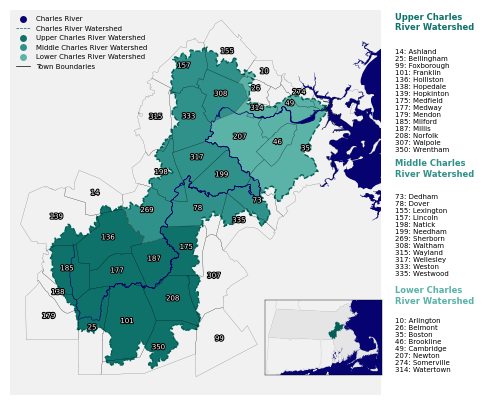

In [13]:
fig,ax=plt.subplots(1,2,figsize=(6,5),width_ratios=[6,1])
fig.subplots_adjust(hspace=0, wspace=0)
in_ax = fig.add_axes([0.57,0.15,0.2,0.15])
states[states.NAME!='Massachusetts'].plot(ax=in_ax,color='#f1f1f1',edgecolor='#e5e5e5',linewidth=0.5)
mass.plot(ax=in_ax,color='#e5e5e5')
CRW.plot(ax=in_ax,color='#015F56')
xMin, yMin, xMax, yMax = mass.total_bounds
box = gpd.GeoDataFrame(geometry=[shapely.box(xMin-10000, yMin-10000, xMax+10000, yMax+10000)], crs=mass.crs)
box.plot(ax=in_ax, color="#060270", zorder=0)
in_ax.set_ylim([yMin-10000,yMax+10000])
in_ax.set_xlim([xMin-10000,xMax+10000])
in_ax.tick_params(bottom=False,left=False,labelbottom=False,labelleft=False)
[x.set_linewidth(0.3) for x in in_ax.spines.values()]
   
CRW.boundary.plot(ax=ax[0],color='#015F56',linewidth=1,linestyle='--')
towns_fullout.boundary.plot(ax=ax[0],color='black',linewidth=0.1)
states[states.NAME=='Rhode Island'].plot(ax=ax[0],color='#f1f1f1',edgecolor='#f1f1f1',linewidth=2)
mass.plot(ax=ax[0],color='#f1f1f1')
CRW_Upper.dissolve().plot(ax=ax[0],color='#0E726A')
CRW_Middle.dissolve().plot(ax=ax[0],color='#2F9189')
CRW_Lower.dissolve().plot(ax=ax[0],color='#5BB3A8')
#rivers.to_crs(epsg=26986).plot(ax=ax,color='#015AA7',linewidth=0)
#rivers_arc.to_crs(epsg=26986).plot(ax=ax,color='#015AA7',linewidth=0.1)
Charles.plot(ax=ax[0],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[0],color='#060270',linewidth=0.4)
box = gpd.GeoDataFrame(geometry=[shapely.box(190000, 860000, 260000, 920000)], crs=mass.crs)
box.plot(ax=ax[0], color="#060270", zorder=0)
ax[0].set_ylim([860000,917000])
ax[0].set_xlim([190000,245000])
ax[0].axis('off')

towns_fullout['coords'] = towns_fullout['geometry'].apply(lambda x: x.centroid.coords[:])
towns_fullout['coords'] = [coords[0] for coords in towns_fullout['coords']]
for idx, row in towns_fullout.iterrows():
    ax[0].annotate(text=row['codes'], xy=row['coords'],
                horizontalalignment='center',fontsize=5,color='white',
                path_effects=[mpl.patheffects.withStroke(linewidth=1.5, foreground="black")])

l1 = mpl.lines.Line2D([], [], color='#015F56',linewidth=0.5,linestyle='--',label='Charles River Watershed')
l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#060270', marker='o',markeredgecolor=(1,1,1,0),markersize=5, label='Charles River')
l3 = mpl.lines.Line2D([], [], color='black',label='Town Boundaries',linewidth=0.5)
l4 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#0E726A', markeredgecolor=(1,1,1,0), marker='o',markersize=5, label='Upper Charles River Watershed')
l5 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#2F9189', markeredgecolor=(1,1,1,0), marker='o',markersize=5, label='Middle Charles River Watershed')
l6 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#5BB3A8', markeredgecolor=(1,1,1,0), marker='o',markersize=5, label='Lower Charles River Watershed')
ax[0].legend(handles=[l2,l1,l4,l5,l6,l3],loc='upper left',fontsize=5,frameon=False)

ax[1].annotate(text='Upper Charles\n'+'River Watershed\n',xy=(0,0.92),fontsize=6,weight='bold',color='#0E726A')
ax[1].annotate(text='14: Ashland\n'+'25: Bellingham\n'+'99: Foxborough\n'+'101: Franklin\n'+'136: Holliston\n'
               +'138: Hopedale\n'+'139: Hopkinton\n'+'175: Medfield\n'+'177: Medway\n'+'179: Mendon\n'+'185: Milford\n'+'187: Millis\n'
               +'208: Norfolk\n'+'307: Walpole\n'+'350: Wrentham',xy=(0,0.63),fontsize=5)
ax[1].annotate(text='Middle Charles\n'+'River Watershed\n',xy=(0,0.54),fontsize=6,weight='bold',color='#2F9189')
ax[1].annotate(text='73: Dedham\n'+'78: Dover\n'+'155: Lexington\n'+'157: Lincoln\n'+'198: Natick\n'+'199: Needham\n'+'269: Sherborn\n'
               +'308: Waltham\n'+'315: Wayland\n'+'317: Wellesley\n'+'333: Weston\n'+'335: Westwood',xy=(0,0.31),fontsize=5)
ax[1].annotate(text='Lower Charles\n'+'River Watershed\n',xy=(0,0.21),fontsize=6,weight='bold',color='#5BB3A8')
ax[1].annotate(text='10: Arlington\n'+'26: Belmont\n'+'35: Boston\n'+'46: Brookline\n'+'49: Cambridge\n'+'207: Newton\n'+'274: Somerville\n'
               +'314: Watertown',xy=(0,0.06),fontsize=5)


ax[1].axis('off')
fig.savefig('Output Maps/CRWA Overview Map',dpi=300,bbox_inches='tight')

# Tree Canopy

In [103]:
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    img=ee.Image('USGS/NLCD_RELEASES/2021_REL/TCC/v2021-4/TCC_v2021-4_CONUS_'+year).clip(geemap.geopandas_to_ee(CRW)).select('Science_Percent_Tree_Canopy_Cover').reproject(crs='EPSG:26986',scale=30)
    geemap.ee_export_image(img,filename='../../Working_Data/TCC'+year+'.tif', region=geemap.geopandas_to_ee(CRW).geometry(), file_per_band=False)

<IPython.core.display.HTML object>

Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2008.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2009.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2010.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2011.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2012.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2013.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2014.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\TCC2015.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project

In [141]:
canStats=pd.DataFrame(rasterstats.zonal_stats(Charles_Towns, "../../Working_Data/TCC"+'2008'+".tif",stats="count min mean max median"),index=Charles_Towns.index)
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(Charles_Towns, "../../Working_Data/TCC"+year+".tif",stats="count min mean max median"),index=Charles_Towns.index)
    canStats=canStats.merge(stats,left_index=True,right_index=True,suffixes=('',year))
canStats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/AverageCanopy.csv')

<IPython.core.display.HTML object>

In [142]:
canCRWStats=pd.DataFrame(rasterstats.zonal_stats(CRW.dissolve(), "../../Working_Data/TCC"+'2008'+".tif",stats="mean"))
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(CRW.dissolve(), "../../Working_Data/TCC"+year+".tif",stats="mean"))
    canCRWStats=canCRWStats.join(stats,rsuffix=year)
canCRWStats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/AverageCRWCanopy.csv')

canUStats=pd.DataFrame(rasterstats.zonal_stats(CRW_Upper.dissolve(), "../../Working_Data/TCC"+'2008'+".tif",stats="mean"))
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(CRW_Upper.dissolve(), "../../Working_Data/TCC"+year+".tif",stats="mean"))
    canUStats=canUStats.join(stats,rsuffix=year)
canUStats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/AverageUCanopy.csv')

canMStats=pd.DataFrame(rasterstats.zonal_stats(CRW_Middle.dissolve(), "../../Working_Data/TCC"+'2008'+".tif",stats="mean"))
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(CRW_Middle.dissolve(), "../../Working_Data/TCC"+year+".tif",stats="mean"))
    canMStats=canMStats.join(stats,rsuffix=year)
canMStats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/AverageMCanopy.csv')

canLStats=pd.DataFrame(rasterstats.zonal_stats(CRW_Lower.dissolve(), "../../Working_Data/TCC"+'2008'+".tif",stats="mean"))
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(CRW_Lower.dissolve(), "../../Working_Data/TCC"+year+".tif",stats="mean"))
    canLStats=canLStats.join(stats,rsuffix=year)
canLStats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/AverageLCanopy.csv')

<IPython.core.display.HTML object>

NameError: name 'CRW_Upper' is not defined

In [143]:
CanData=pd.read_csv('../../Working_Data/AverageCRWCanopy.csv')
CanData=pd.melt(CanData,var_name='Year')
for i in CanData.index:
    CanData['Year'].iloc[i]=CanData['Year'].iloc[i][-4:]

CanUData=pd.read_csv('../../Working_Data/AverageUCanopy.csv')
CanUData=pd.melt(CanUData,var_name='Year')
for i in CanUData.index:
    CanUData['Year'].iloc[i]=CanUData['Year'].iloc[i][-4:]

CanMData=pd.read_csv('../../Working_Data/AverageMCanopy.csv')
CanMData=pd.melt(CanMData,var_name='Year')
for i in CanMData.index:
    CanMData['Year'].iloc[i]=CanMData['Year'].iloc[i][-4:]

CanLData=pd.read_csv('../../Working_Data/AverageLCanopy.csv')
CanLData=pd.melt(CanLData,var_name='Year')
for i in CanLData.index:
    CanLData['Year'].iloc[i]=CanLData['Year'].iloc[i][-4:]

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\3904232877.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  CanData['Year'].iloc[i]=CanData['Year'].iloc[i][-4:]
C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\3904232877.py:4: SettingWit

In [144]:
CanData=pd.read_csv('../../Working_Data/AverageCRWCanopy.csv')
CanData=pd.melt(CanData,var_name='Year')
for i in CanData.index:
    CanData['Year'].iloc[i]=CanData['Year'].iloc[i][-4:]

CanUData=pd.read_csv('../../Working_Data/AverageUCanopy.csv')
CanUData=pd.melt(CanUData,var_name='Year')
for i in CanUData.index:
    CanUData['Year'].iloc[i]=CanUData['Year'].iloc[i][-4:]

CanMData=pd.read_csv('../../Working_Data/AverageMCanopy.csv')
CanMData=pd.melt(CanMData,var_name='Year')
for i in CanMData.index:
    CanMData['Year'].iloc[i]=CanMData['Year'].iloc[i][-4:]

CanLData=pd.read_csv('../../Working_Data/AverageLCanopy.csv')
CanLData=pd.melt(CanLData,var_name='Year')
for i in CanLData.index:
    CanLData['Year'].iloc[i]=CanLData['Year'].iloc[i][-4:]

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\3904232877.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  CanData['Year'].iloc[i]=CanData['Year'].iloc[i][-4:]
C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\3904232877.py:4: SettingWit

In [149]:
CanLData

<IPython.core.display.HTML object>

,Year,value
0,d: 0,0.000000
1,2008,35.220160
2,2009,35.303099
3,2010,35.276681
4,2011,35.389270
5,2012,35.449646
6,2013,35.473879
7,2014,35.288143
8,2015,34.856128
9,2016,34.060867


<IPython.core.display.HTML object>

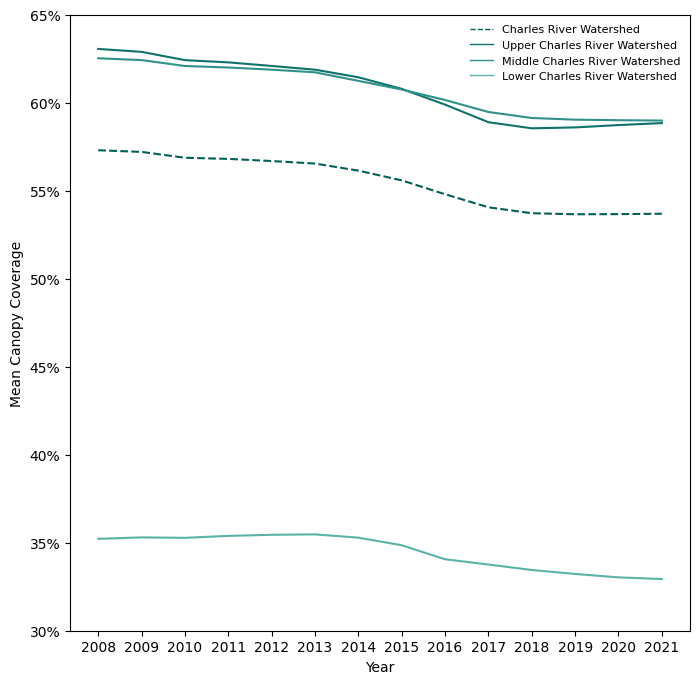

In [145]:
fig,ax=plt.subplots(figsize=(8,8))
sns.lineplot(CanData[1:],x='Year',y='value',ax=ax,color='#015F56',linestyle='--')
sns.lineplot(CanUData[1:],x='Year',y='value',ax=ax,color='#0E726A')
sns.lineplot(CanMData[1:],x='Year',y='value',ax=ax,color='#2F9189')
sns.lineplot(CanLData[1:],x='Year',y='value',ax=ax,color='#5BB3A8')
ax.set_ylabel('Mean Canopy Coverage')
ax.set_ylim([30,65])
l1 = mpl.lines.Line2D([], [], color='#015F56',linewidth=1,linestyle='--',label='Charles River Watershed')
l4 = mpl.lines.Line2D([], [], color='#0E726A', linewidth=1, label='Upper Charles River Watershed')
l5 = mpl.lines.Line2D([], [], color='#2F9189', linewidth=1, label='Middle Charles River Watershed')
l6 = mpl.lines.Line2D([], [], color='#5BB3A8', linewidth=1, label='Lower Charles River Watershed')
ax.legend(handles=[l1,l4,l5,l6],loc='upper right',fontsize=8,frameon=False)
ax.set_xlabel('Year')
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(decimals=0))
fig.savefig('Output Maps/Canopy CRW time series',dpi=300,transparent=True,bbox_inches='tight')

In [240]:
CanData=pd.read_csv('../../Working_Data/AverageCanopy.csv')
CanData['name']=CanData.NAMELSAD20.str.split(' ').str[0]
CanData=CanData[['name','mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']]
CanData=pd.melt(CanData,id_vars='name',var_name='Year')
for i in CanData.index:
    CanData['Year'].iloc[i]=CanData['Year'].iloc[i][-4:]
    CanData['value'].iloc[i]=CanData['value']

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\875712119.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  CanData['Year'].iloc[i]=CanData['Year'].iloc[i][-4:]
C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\875712119.py:6: SettingWithC

ValueError: setting an array element with a sequence.

In [258]:
CanData_U=CanData[np.isin(CanData['name'],Upper)]
CanData_U=CanData_U.pivot(columns='Year',index='name')
for column in CanData_U.columns:
    lista=(CanData_U[column]/100)
    listb=CRW_Upper.geometry.area*2.47105381/10000
    CanData_U[column]=[a*b for a,b in zip(lista,listb)]
    
CanData_M=CanData[np.isin(CanData['name'],Middle)]
CanData_M=CanData_M.pivot(columns='Year',index='name')
for column in CanData_M.columns:
    lista=(CanData_M[column]/100)
    listb=CRW_Middle.geometry.area*2.47105381/10000
    CanData_M[column]=[a*b for a,b in zip(lista,listb)]
    
CanData_L=CanData[np.isin(CanData['name'],Lower)]
CanData_L.loc[0,'Year']='mean2008'
CanData_L=CanData_L.pivot(columns='Year',index='name')
for column in CanData_L.columns:
    lista=(CanData_L[column]/100)
    listb=CRW_Lower.geometry.area*2.47105381/10000
    CanData_L[column]=[a*b for a,b in zip(lista,listb)]

<IPython.core.display.HTML object>

In [275]:
CanData_U.sort_values(('value', 'mean2008'),ascending=False).T

<IPython.core.display.HTML object>

name               Franklin    Holliston      Norfolk       Millis  \
      Year                                                           
value mean2008  9268.492894  8249.308103  6556.797443  5054.454123   
      mean2009  9254.314931  8207.326887  6555.721078  5046.822370   
      mean2010  9206.229251  8128.828033  6505.836372  4989.833654   
      mean2011  9218.156143  8101.864856  6499.464816  4977.173113   
      mean2012  9191.295856  8068.507569  6474.831590  4966.455608   
      mean2013  9167.046485  8024.098417  6458.937291  4942.142710   
      mean2014  9139.069209  7932.693478  6412.641196  4886.676403   
      mean2015  9063.264029  7829.388939  6367.655220  4837.773419   
      mean2016  9017.023720  7620.519231  6324.730816  4801.038483   
      mean2017  8916.845716  7466.917114  6252.495275  4720.175285   
      mean2018  8896.921467  7440.617866  6216.831823  4643.219482   
      mean2019  8904.063056  7462.403373  6236.897595  4629.391941   
      mean2020  8930.946953  7507.110247  6238.567844  4615.604699   
      mean2021  8947.247898  7529.879374  6255.146866  4611.053822   

name               Medfield       Medway      Milford     Wrentham  \
      Year                                                           
value mean2008  4839.696769  4527.732173  4422.894772  3964.658327   
      mean2009  4834.929607  4512.036522  4406.072663  3957.012057   
      mean2010  4805.039234  4456.386136  4374.311000  3938.954863   
      mean2011  4800.169792  4441.389737  4356.825957  3915.575818   
      mean2012  4795.253455  4429.324295  4344.609549  3892.114265   
      mean2013  4790.103695  4415.658152  4326.639120  3878.742506   
      mean2014  4759.013911  4390.524326  4310.469317  3850.174798   
      mean2015  4729.153754  4359.857105  4239.684677  3772.168620   
      mean2016  4699.183333  4337.638126  4091.847282  3663.754004   
      mean2017  4647.258176  4258.143066  3968.936344  3611.866066   
      mean2018  4623.909310  4239.619992  3939.086190  3581.229311   
      mean2019  4623.509082  4227.360243  3945.187454  3596.210682   
      mean2020  4618.561817  4226.388271  3984.764061  3602.476039   
      mean2021  4616.324986  4224.682315  4006.517346  3624.530387   

name             Bellingham    Hopkinton      Walpole    Hopedale     Ashland  \
      Year                                                                      
value mean2008  3847.873065  1518.700124  1036.486284  392.040550  267.466458   
      mean2009  3826.785980  1510.672674  1035.848534  390.465165  266.772724   
      mean2010  3812.568598  1501.015812  1029.331038  387.376965  265.742097   
      mean2011  3803.936139  1500.067206  1025.871188  387.207136  265.504942   
      mean2012  3785.577850  1499.553251  1020.720299  386.934517  264.199482   
      mean2013  3774.588429  1497.185591  1015.811623  384.183739  262.665732   
      mean2014  3749.968316  1484.879502  1009.245240  382.051942  260.535771   
      mean2015  3697.450150  1470.943956  1002.314429  377.158195  257.408428   
      mean2016  3613.952833  1459.292264   996.592454  365.319349  245.588359   
      mean2017  3534.703175  1445.800080   981.879757  356.966460  240.022975   
      mean2018  3505.963807  1448.223672   975.477811  354.284955  238.254287   
      mean2019  3506.120670  1452.467807   977.053299  349.965496  236.640747   
      mean2020  3513.026031  1460.081039   977.242180  349.415788  236.514412   
      mean2021  3510.991023  1464.617729   977.039966  349.683938  237.527307   

name                Mendon  Foxborough  
      Year                              
value mean2008  126.511829   11.839826  
      mean2009  126.305081   11.773768  
      mean2010  125.409174   11.756152  
      mean2011  125.140180   11.696700  
      mean2012  124.377659   11.639449  
      mean2013  124.088657   11.542564  
      mean2014  123.463967   11.452284  
      mean2015  122.025625   10.089284  
      mean2016  120.398321    9.697339  
      mean

<IPython.core.display.HTML object>

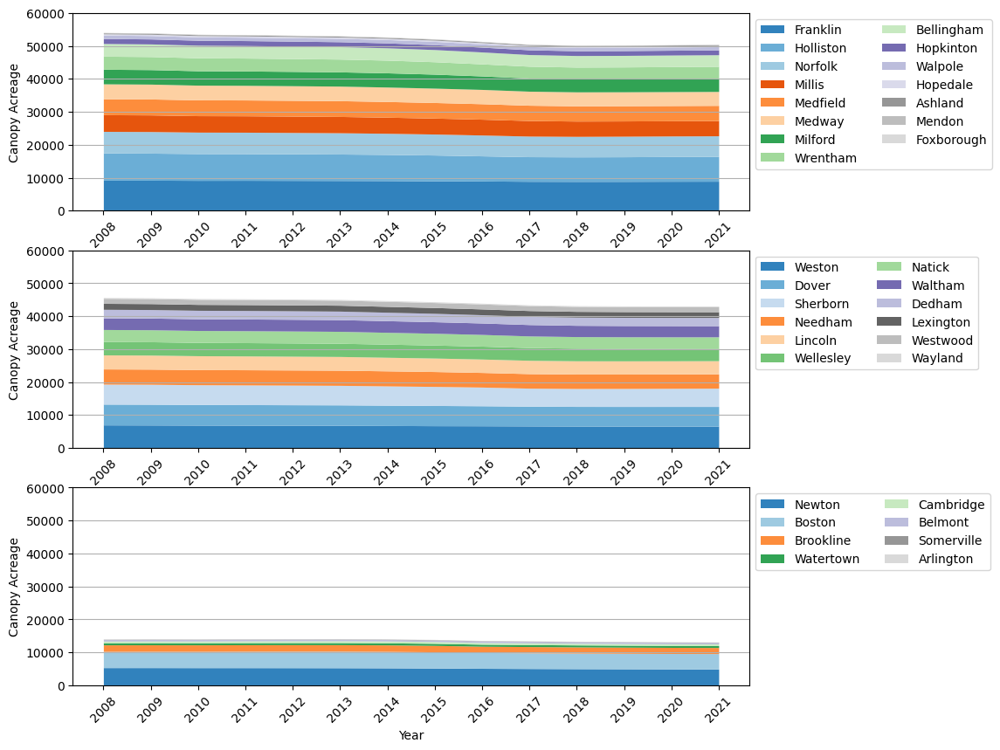

In [274]:
fig,ax=plt.subplots(3,1,figsize=(10,10))
CanData_U.sort_values(('value', 'mean2008'),ascending=False).T.plot.area(ax=ax[0],stacked=True,legend=True,cmap='tab20c',linewidth=0)
CanData_M.sort_values(('value', 'mean2008'),ascending=False).T.plot.area(ax=ax[1],stacked=True,legend=True,cmap='tab20c',linewidth=0)
CanData_L.sort_values(('value', 'mean2008'),ascending=False).T.plot.area(ax=ax[2],stacked=True,legend=True,cmap='tab20c',linewidth=0)
#sns.lineplot(CanUData[1:],x='Year',y='value',ax=ax[0],color='#0E726A',linewidth=4,linestyle='--')
#sns.lineplot(CanMData[1:],x='Year',y='value',ax=ax[1],color='#2F9189',linewidth=4,linestyle='--')
#sns.lineplot(CanLData[1:],x='Year',y='value',ax=ax[2],color='#5BB3A8',linewidth=4,linestyle='--')

ax[0].set_ylabel('Canopy Acreage')
ax[0].set_xlabel('Year')
ax[0].set_xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13],labels=['2008','2009','2010','2011','2012','2013','2014',
                                                              '2015','2016','2017','2018','2019','2020','2021'],rotation=45)
h,l = ax[0].get_legend_handles_labels()
ax[0].legend_.remove()
ax[0].legend(h,l, ncol=2,loc='upper left',bbox_to_anchor=(1,1))
ax[0].set_ylim([0,60000])
ax[0].grid(visible=True,which='major',axis='y')

#sns.lineplot(CanData_M,x='Year',y='value',hue='name',ax=ax[1],legend=True)
ax[1].set_ylabel('Canopy Acreage')
ax[1].set_xlabel('Year')
ax[1].set_xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13],labels=['2008','2009','2010','2011','2012','2013','2014',
                                                              '2015','2016','2017','2018','2019','2020','2021'],rotation=45)
h,l = ax[1].get_legend_handles_labels()
ax[1].legend_.remove()
ax[1].legend(h,l, ncol=2,loc='upper left',bbox_to_anchor=(1,1))
ax[1].set_ylim([0,60000])
ax[1].grid(visible=True,which='major',axis='y')

#sns.lineplot(CanData_L,x='Year',y='value',hue='name',ax=ax[2],legend=True)
ax[2].set_ylabel('Canopy Acreage')
ax[2].set_xlabel('Year')
ax[2].set_xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13],labels=['2008','2009','2010','2011','2012','2013','2014',
                                                              '2015','2016','2017','2018','2019','2020','2021'],rotation=45)
h,l = ax[2].get_legend_handles_labels()
ax[2].legend_.remove()
ax[2].legend(h,l, ncol=2,loc='upper left',bbox_to_anchor=(1,1))
ax[2].set_ylim([0,60000])
ax[2].grid(visible=True,which='major',axis='y')

fig.savefig('Output Maps/Canopy time series.png',dpi=300,transparent=True,bbox_inches='tight')

In [25]:
TCC2021=ee.Image('USGS/NLCD_RELEASES/2021_REL/TCC/v2021-4/TCC_v2021-4_CONUS_2021').clip(geemap.geopandas_to_ee(CRW)).select('Science_Percent_Tree_Canopy_Cover').reproject(crs='EPSG:26986',scale=30)
TCC2008=ee.Image('USGS/NLCD_RELEASES/2021_REL/TCC/v2021-4/TCC_v2021-4_CONUS_2008').clip(geemap.geopandas_to_ee(CRW)).select('Science_Percent_Tree_Canopy_Cover').reproject(crs='EPSG:26986',scale=30)
dtreeCover=TCC2021.subtract(TCC2008)
dtreeCover=geemap.ee_export_image(dtreeCover, filename='../../Working_Data/dTCC08_21.tif', region=geemap.geopandas_to_ee(CRW).geometry(), file_per_band=False)

<IPython.core.display.HTML object>

Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\dTCC08_21.tif


In [182]:
TCC2021,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
TCC2021_M,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),CRW_Middle.to_crs(epsg=26986).geometry,crop=True,filled=False)
TCC2008,trans=mask(rio.open('../../Working_Data/TCC2008.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
dTCC,trans=mask(rio.open('../../Working_Data/dTCC08_21.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
dTCC_M,trans=mask(rio.open('../../Working_Data/dTCC08_21.tif'),CRW_Middle.to_crs(epsg=26986).geometry,crop=True,filled=False)
plot_extent = rio.plot.plotting_extent(rio.open('../../Working_Data/TCC2021.tif'))

<IPython.core.display.HTML object>

In [183]:
# Calculate zonal statistics, join back onto town data frame and extract town name
canStats=pd.DataFrame(rasterstats.zonal_stats(Charles_Towns, "../../Working_Data/TCC2021.tif",stats="count min mean max median"),index=Charles_Towns.index)
canStats=canStats.merge(Charles_Towns.to_crs(epsg=26986),left_index=True,right_index=True)
canStats['name']=canStats.index.str.split(' ').str[0]

<IPython.core.display.HTML object>

In [184]:
# Sort by mean tree canopy percent change
canStats=canStats.sort_values(by='mean')

<IPython.core.display.HTML object>

In [185]:
# Generate coordinates for labeling polygons on maps
canStats['coords'] = canStats['geometry'].apply(lambda x: x.representative_point().coords[:])
canStats['coords'] = [coords[0] for coords in canStats['coords']]

<IPython.core.display.HTML object>

In [186]:
canStats['mean'].mean()

<IPython.core.display.HTML object>

52.862092368405136

In [310]:
colors7=['#f7fcf5','#6d934f','#006d2c'] 
my_greens = mpl.colors.LinearSegmentedColormap.from_list('my_cmap7',colors7,N=256)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

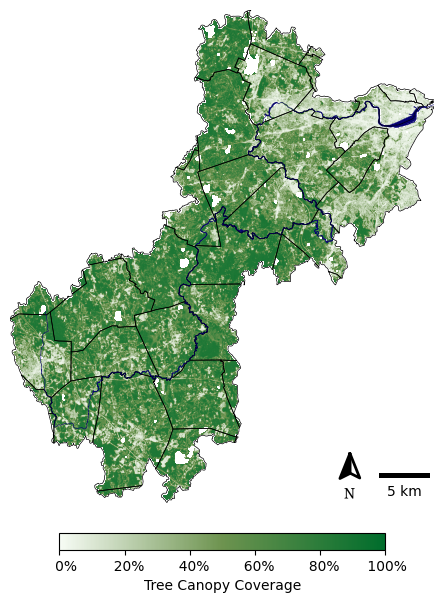

In [188]:
f, ax = plt.subplots(figsize=(6,8))

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TCC2021[0,:,:],cmap=my_greens,extent=plot_extent,alpha=1,vmin=0,vmax=100)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

# Add data and layers
show(TCC2021,cmap=my_greens,ax=ax,extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
ax.axis('off')
#plt.title('2021 Canopy Coverage')
#plt.text(-7.965e6,5.16e6,'Source: USFS Tree Canopy Coverage from Google Earth Engine',fontsize=8)


# Add colorbar using hidden version of raster
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax.add_artist(ScaleBar(1,location='lower right'))
f.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Tree Canopy Coverage')
f.savefig('Output Maps/2021 TCC for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

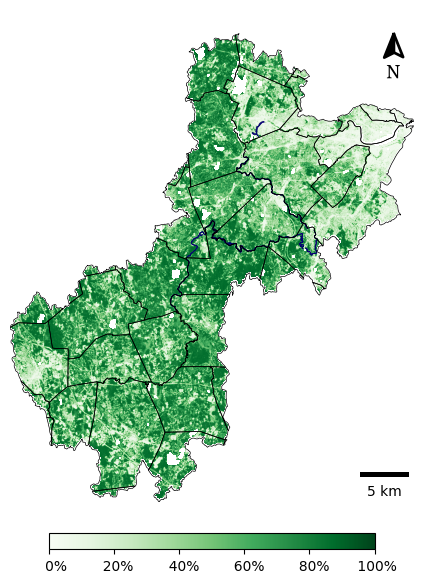

In [189]:
f, ax = plt.subplots(figsize=(6,8))

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TCC2021[0,:,:],cmap='Greens',extent=plot_extent,alpha=1,vmin=0,vmax=100)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

# Add data and layers
show(TCC2021,cmap='Greens',ax=ax,extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.clip(CRW_Middle).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.axis('off')
#plt.title('2021 Canopy Coverage')
#plt.text(-7.965e6,5.16e6,'Source: USFS Tree Canopy Coverage from Google Earth Engine',fontsize=8)


# Add colorbar using hidden version of raster
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.95,xlim_pos=0.95,text_scaler=4, text_yT=-3)
ax.add_artist(ScaleBar(1,location='lower right'))
f.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05)
f.savefig('Output Maps/2021 TCC for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

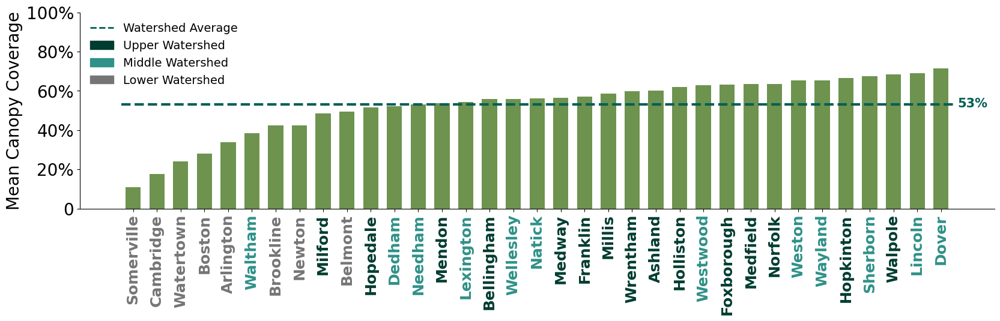

In [235]:
# Add barplot, set properties, and change colors
cols = ['#003c30' if np.isin(x,Upper) else ('#2F9189' if np.isin(x,Middle) else '#757575') for x in canStats.name]
ax=sns.catplot(canStats,y='mean',x='name',orient='v',color='#6d934f',
            kind='bar',height=4, aspect=4,saturation=1,width=0.8,gap=0.2,legend=False)
plt.hlines(y=53,xmin=-.5,xmax=34.5,color='#015F56', linewidth=3,linestyle='--')
ax.set(xlabel=None)
plt.ylabel(ylabel='Mean Canopy Coverage',fontsize=20)
plt.xticks(rotation=90,fontsize=18,weight='bold')
for ticklabel, tickcolor in zip(plt.gca().get_xticklabels(), cols):
    ticklabel.set_color(tickcolor)
plt.yticks(fontsize=20)
plt.ylim([0,100])
l1 = mpl.lines.Line2D([], [], color='#015F56', linewidth=2,linestyle='--',label='Watershed Average')
l4 = mpl.patches.Patch(color='#003c30',label='Upper Watershed')
l5 = mpl.patches.Patch(color='#2F9189',label='Middle Watershed')
l6 = mpl.patches.Patch(color='#757575',label='Lower Watershed')
plt.gca().text(34.7,51.5,'53%',fontsize=15,color='#015F56',weight='bold')
plt.legend(handles=[l1,l4,l5,l6],loc='upper left',fontsize=14,frameon=False)
ax.set_yticklabels(['0','20%','40%','60%','80%','100%'], rotation=0)
plt.savefig('Output Maps/2021 Canopy graph for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

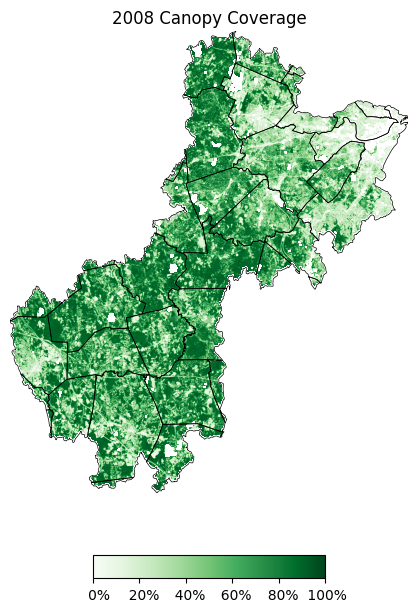

In [191]:
f, ax = plt.subplots(figsize=(6,8))

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TCC2008[0,:,:],cmap='Greens',extent=plot_extent,alpha=1,vmin=0,vmax=100)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

# Add data and layers
show(TCC2008,cmap='Greens',ax=ax,extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)

ax.axis('off')
plt.title('2008 Canopy Coverage')
#plt.text(-7.965e6,5.16e6,'Source: USFS Tree Canopy Coverage from Google Earth Engine',fontsize=8)


# Add colorbar using hidden version of raster
f.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.5,aspect=10,pad=0.1)
f.savefig('Output Maps/2008 TCC.png',transparent=True,dpi=300,bbox_inches='tight')

In [474]:
# List of names of towns participating in the climate compact from https://www.crwa.org/climate-compact
CC_Towns=['Arlington', 'Bellingham', 'Belmont', 'Boston', 'Brookline', 'Cambridge', 'Dedham', 'Dover', 'Franklin', 'Holliston', 'Hopkinton', 'Lincoln', 'Medfield', 'Medway', 'Millis', 'Natick', 'Needham', 'Newton', 'Norfolk', 'Sherborn', 'Somerville', 'Walpole', 'Waltham', 'Watertown', 'Wellesley', 'Weston', 'Westwood', 'Wrentham']

<IPython.core.display.HTML object>

In [475]:
CC_CRW=Charles_Towns.loc[Charles_Towns['name'].isin(CC_Towns)]

<IPython.core.display.HTML object>

In [476]:
dTCC_CC,trans=mask(rio.open('../../Working_Data/dTCC08_21.tif'),CC_CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)

<IPython.core.display.HTML object>

In [477]:
# Calculate zonal statistics, join back onto town data frame and extract town name
townStats=pd.DataFrame(rasterstats.zonal_stats(Charles_Towns, "../../Working_Data/dTCC08_21.tif",stats="count min mean max median"),index=Charles_Towns.index)
townStats=townStats.merge(Charles_Towns.to_crs(epsg=26986),left_index=True,right_index=True)
townStats['name']=townStats.index.str.split(' ').str[0]

<IPython.core.display.HTML object>

In [478]:
# Sort by mean tree canopy percent change
townStats=townStats.sort_values(by='mean')

<IPython.core.display.HTML object>

In [479]:
# Generate coordinates for labeling polygons on maps
townStats['coords'] = townStats['geometry'].apply(lambda x: x.representative_point().coords[:])
townStats['coords'] = [coords[0] for coords in townStats['coords']]

<IPython.core.display.HTML object>

In [480]:
# Extract only Climate Compact towns
townStatsCC=townStats.loc[townStats['name'].isin(CC_Towns)]
townStatsCC.to_csv('../../Working_Data/Town Canopy Stats.csv')

<IPython.core.display.HTML object>

In [481]:
for i in np.arange(0,27):
    if np.isin(townStatsCC['name'].iloc[i],Upper):
        townStatsCC['division'].iloc[i]='U'
    elif np.isin(townStatsCC['name'].iloc[i],UMiddle):
        townStatsCC['division'].iloc[i]='UM'
    elif np.isin(townStatsCC['name'].iloc[i],LMiddle):
        townStatsCC['division'].iloc[i]='LM'
    elif np.isin(townStatsCC['name'].iloc[i],Lower):
        townStatsCC['division'].iloc[i]='L'

<IPython.core.display.HTML object>

NameError: name 'UMiddle' is not defined

In [482]:
townStatsCC['mean'].mean()

<IPython.core.display.HTML object>

-3.345927997091748

<IPython.core.display.HTML object>

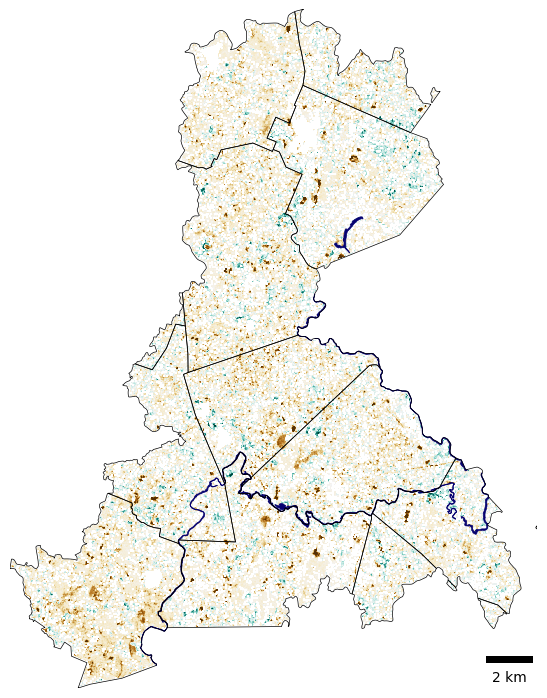

In [483]:
# Create subplots
f, ax = plt.subplots(figsize=(6,8))
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(dTCC_M[0,:,:],cmap='BrBG',extent=Middle_extent,alpha=1,vmin=-100,vmax=100)

# Add data and layers
show(dTCC_M,cmap='BrBG',ax=ax,extent=Middle_extent,alpha=1,vmin=-50,vmax=50)
CRW_Middle.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.clip(CRW_Middle).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)

# Add colorbar using hidden version of raster
#f.colorbar(hidden, cmap='BrBG',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Change in tree cover (percentage points)',format="%4i")

# Set properties of plot
#ax[0].set(title='Tree Cover Change (2008 - 2021) in the Charles River Watershed')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.set_axis_off()
#add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.95,xlim_pos=0.95,text_scaler=4, text_yT=-3)
f.savefig('Output Maps/dTCC for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

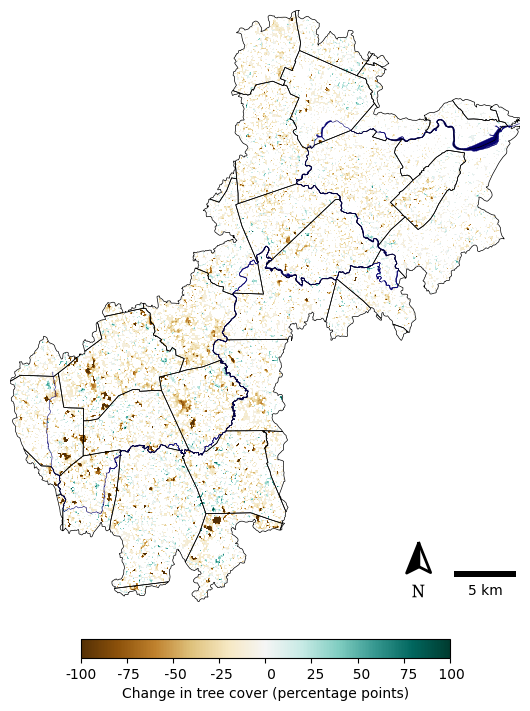

In [484]:
# Create subplots
f, ax = plt.subplots(figsize=(6,8))
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(dTCC[0,:,:],cmap='BrBG',extent=plot_extent,alpha=1,vmin=-100,vmax=100)

# Add data and layers
show(dTCC,cmap='BrBG',ax=ax,extent=plot_extent,alpha=1,vmin=-50,vmax=50)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)

# Add colorbar using hidden version of raster
f.colorbar(hidden, cmap='BrBG',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Change in tree cover (percentage points)',format="%4i")

# Set properties of plot
#ax[0].set(title='Tree Cover Change (2008 - 2021) in the Charles River Watershed')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.set_axis_off()
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
f.savefig('Output Maps/dTCC for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

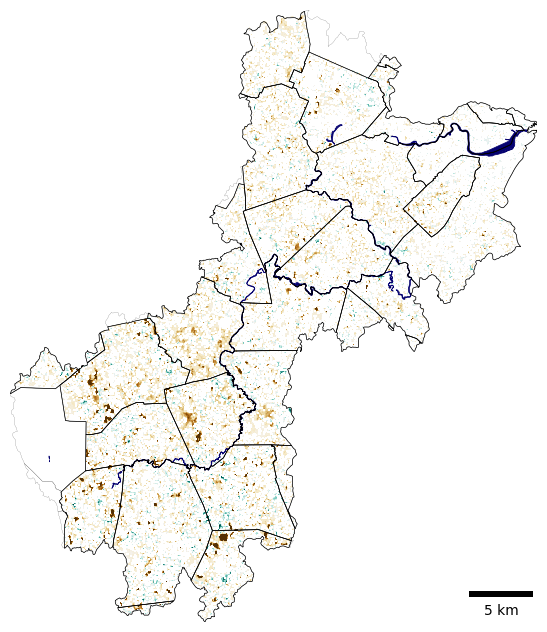

In [485]:
# Create subplots
f, ax = plt.subplots(figsize=(6,8))
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(dTCC_CC[0,:,:],cmap='BrBG',extent=plot_extent,alpha=1,vmin=-100,vmax=100)

# Add data and layers
show(dTCC_CC,cmap='BrBG',ax=ax,extent=plot_extent,alpha=1,vmin=-50,vmax=50)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.1)
CC_CRW.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
# Add colorbar using hidden version of raster
#f.colorbar(hidden, cmap='BrBG',orientation='vertical',aspect=10,shrink=0.4,pad=.04,label='Change in tree cover (percentage points)',format="%4i")

# Set properties of plot
#ax[0].set(title='Tree Cover Change (2008 - 2021) in the Charles River Watershed')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.set_axis_off()
f.savefig('Output Maps/dTCC CC.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

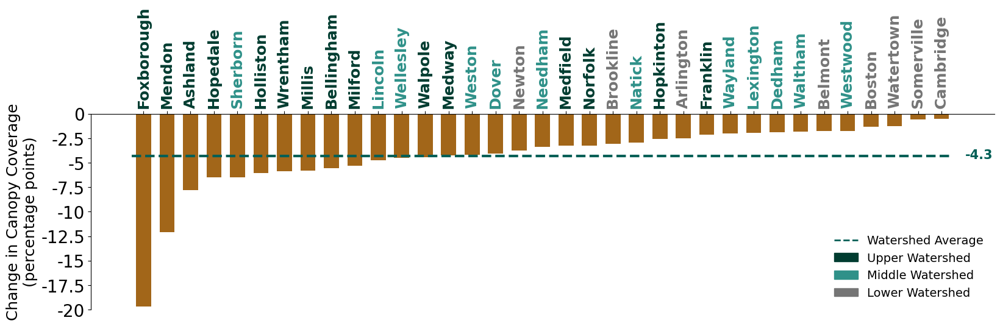

In [487]:
# Add barplot, set properties, and change colors
cols = ['#003c30' if np.isin(x,Upper) else ('#2F9189' if np.isin(x,Middle) else '#757575') for x in townStats.name]
ax=sns.catplot(townStats,y='mean',x='name',orient='v',color='#a26619',
            kind='bar',height=4, aspect=4,saturation=1,width=0.8,gap=0.2,legend=False)
plt.hlines(y=-4.3,xmin=-.5,xmax=34.5,color='#015F56', linewidth=3,linestyle='--')
ax.set(xlabel=None)
plt.gca().xaxis.tick_top()
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['bottom'].set_visible(False)
plt.ylabel(ylabel='Change in Canopy Coverage\n(percentage points)',fontsize=18)
plt.xticks(rotation=90,fontsize=18,weight='bold')
for ticklabel, tickcolor in zip(plt.gca().get_xticklabels(), cols):
    ticklabel.set_color(tickcolor)
plt.yticks(fontsize=20)
plt.ylim([-20,0])
l1 = mpl.lines.Line2D([], [], color='#015F56', linewidth=2,linestyle='--',label='Watershed Average')
l4 = mpl.patches.Patch(color='#003c30',label='Upper Watershed')
l5 = mpl.patches.Patch(color='#2F9189',label='Middle Watershed')
l6 = mpl.patches.Patch(color='#757575',label='Lower Watershed')
plt.gca().text(35,-4.6,'-4.3',fontsize=15,color='#015F56',weight='bold')
plt.legend(handles=[l1,l4,l5,l6],loc='lower right',fontsize=14,frameon=False)
ax.set_yticklabels(['-20','-17.5','-15','-12.5','-10','-7.5','-5','-2.5','0'], rotation=0)
plt.savefig('Output Maps/dTCC graph for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
# Add barplot, set properties, and change colors
fig,ax=plt.subplots(figsize=(3, 8))
bar_plot=sns.barplot(townStatsCC,ax=ax,x='mean',y='name',orient='h',width=0.8,color='green')
ax.set(ylabel=None,xlabel='Change (percentage points)')
for p in bar_plot.patches:
    if p.get_width() < 0:
        p.set_color('#bf812d')
    else:
        p.set_color('#35978f')
fig.savefig('Output Maps/dTCC CC graph.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
# Plot tree cover change

# Create subplots
f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 7),gridspec_kw={'width_ratios': [3, 1]})
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax[0].imshow(dTCC[0,:,:],cmap='BrBG',extent=plot_extent,alpha=1,vmin=-100,vmax=100)

# Add data and layers
show(dTCC,cmap='BrBG',ax=ax[0],extent=plot_extent,alpha=1,vmin=-50,vmax=50)
towns.to_crs(epsg=26986).boundary.plot(ax=ax[0], color='black',linewidth=0.5)

# Add colorbar using hidden version of raster
f.colorbar(hidden, cmap='BrBG',orientation='horizontal',aspect=10,shrink=0.4,pad=.04,label='Change in tree cover (percentage points)',format="%4i")

# Set properties of plot
ax[0].set(title='Tree Cover Change (2008 - 2021) in the Charles River Watershed')
ax[0].add_artist(ScaleBar(1,location='lower right'))
ax[0].set_axis_off()

# Add barplot, set properties, and change colors
bar_plot=sns.barplot(townStats,ax=ax[1],x='mean',y='name',orient='h',width=0.8)
ax[1].set(ylabel=None,xlabel='Mean Change (percentage points)')
for p in bar_plot.patches:
    if p.get_width() < 0:
        p.set_color('#bf812d')
    else:
        p.set_color('#35978f')

# Save figure 
f.savefig("Output Maps/Tree Cover Change (2008 - 2021) in the Charles River Watershed.png",bbox_inches=mpl.transforms.Bbox.from_bounds(1.2,-0.1,11,7.5))

<IPython.core.display.HTML object>

NameError: name 'dTCC' is not defined

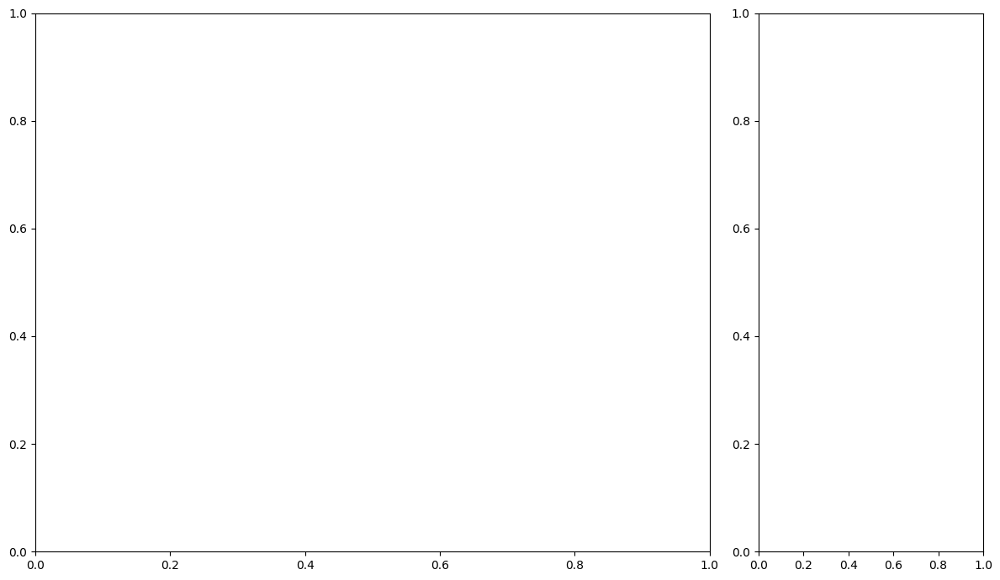

In [172]:
# Plot tree cover change

# Create subplots
f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 7),gridspec_kw={'width_ratios': [3, 1]})
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax[0].imshow(dTCC[0,:,:],cmap='BrBG',extent=plot_extent,alpha=1,vmin=-50,vmax=50)

# Add data and layers
show(dTCC,cmap='BrBG',ax=ax[0],extent=plot_extent,alpha=1,vmin=-50,vmax=50)
towns.to_crs(epsg=26986).boundary.plot(ax=ax[0], color='black',linewidth=0.5)


# Label towns
townStatsCC[townStatsCC['count']>200].apply(lambda x: ax[0].annotate(text=x['name'], xy=x['coords'], ha='center'), axis=1)

# Add colorbar using hidden version of raster
f.colorbar(hidden, cmap='BrBG',orientation='horizontal',aspect=25,shrink=0.7,pad=.04,label='Percent change in tree cover',format="%4i%%")

# Set properties of plot
ax[0].set(title='Tree Cover Change (2005 - 2020) in the Charles River Watershed')
ax[0].add_artist(ScaleBar(1,location='lower right'))
ax[0].set_axis_off()
plt.text(-21,28,'Source: Tree cover change was calculated from MODIS vegetation continuous \nfields available from Google Earth Engine',fontsize=8)

# Add barplot, set properties, and change colors
bar_plot=sns.barplot(townStatsCC,ax=ax[1],x='mean',y='name',orient='h',width=0.8)
ax[1].set(ylabel=None,xlabel='Mean Change (%)')
for p in bar_plot.patches:
    if p.get_width() < 0:
        p.set_color('#bf812d')
    else:
        p.set_color('#35978f')

# Save figure 
f.savefig("Output Maps/Climate Compact Towns Tree Cover Change (2005 - 2020) in the Charles River Watershed.png",bbox_inches=mpl.transforms.Bbox.from_bounds(1.2,-0.1,11,7.5))

In [173]:
ResultsbyDivision=townStatsCC.groupby('division')['mean'].mean()
ax=sns.barplot(ResultsbyDivision,order=['U','UM','LM','L'])
ax.set(xlabel='Subwatershed',ylabel='Mean Change in Canopy (%)')
j=0
colors=['blue','green','red','purple']
for p in ax.patches:
    p.set_color(colors[j])
    j+=1
plt.title('Change in Canopy (2005 - 2020) by Subwatershed')
plt.show()

<IPython.core.display.HTML object>

KeyError: 'division'

# Soils Maps

In [188]:
#Import soils data and clip to boundaries
Ag_soils = gpd.clip(gpd.read_file("../../Raw_Data/Soils_MassGIS_SHP/SOILS_POLY_PRIMEFARMLAND.shp",mask=CRW.to_crs('EPSG:26986')),CRW.to_crs('EPSG:26986'))
Soils = gpd.clip(gpd.read_file("../../Raw_Data/Soils_MassGIS_SHP/SOILS_MUPOLYGON_TOP20.shp",mask=CRW.to_crs('EPSG:26986')),CRW.to_crs('EPSG:26986'))
Soils.to_file('../../Working_Data/SoilsCRW.shp')  

<IPython.core.display.HTML object>

In [40]:
Soils=gpd.read_file('../../Working_Data/SoilsCRW.shp',driver='pyogrio')  

<IPython.core.display.HTML object>

In [189]:
OWN_palette = {'No':'#f6ecd1','Unranked':'#e5e5e5','Yes':'#5bb2a8'}
OWN_cmap = mpl.colors.ListedColormap([OWN_palette[b] for b in ['No','Unranked','Yes']])

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

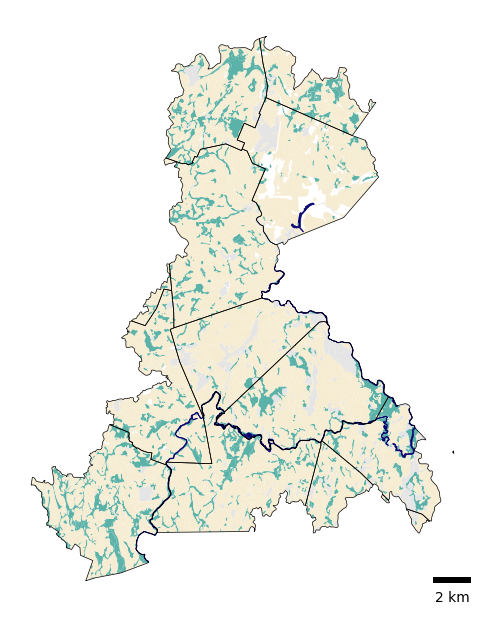

In [190]:
fig,ax=plt.subplots(figsize=(6,8))
Soils.clip(CRW_Middle).plot(ax=ax,column='HYDRCRATNG',cmap=OWN_cmap,legend=False,legend_kwds={'loc':'upper left'})
CRW_Middle.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
#plt.title('Hydric Soil Rating')
Charles.clip(CRW_Middle).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.add_artist(ScaleBar(1,location='lower right'))
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
ax.axis('off')
#ax.text(194900,859000,'Source: SSURGO data accessed from MassGIS',fontsize=10)
fig.savefig('Output Maps/Hydric rating for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

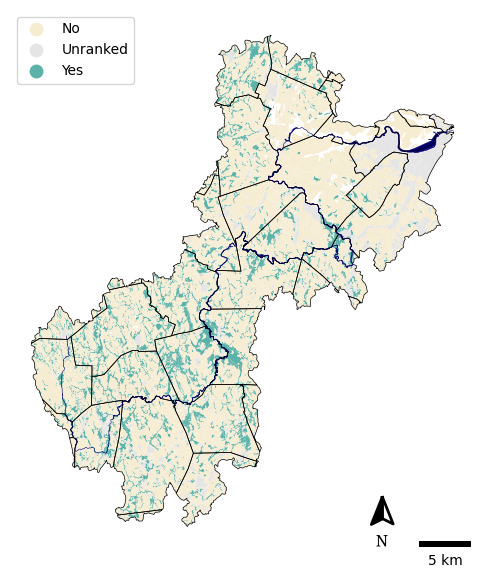

In [191]:
fig,ax=plt.subplots(figsize=(6,8))
Soils.plot(ax=ax,column='HYDRCRATNG',cmap=OWN_cmap,legend=True,legend_kwds={'loc':'upper left'})
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
#plt.title('Hydric Soil Rating')
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
ax.add_artist(ScaleBar(1,location='lower right'))
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
ax.axis('off')
#ax.text(194900,859000,'Source: SSURGO data accessed from MassGIS',fontsize=10)
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
fig.savefig('Output Maps/Hydric rating for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [192]:
#(because geopandas doesn't allow you to change sort of a categorical class and defaults to alphabetical,
#I had to recode category)
drain_recode={
    'Excessively drained': 'A',
    'Somewhat excessively drained': 'B',
    'Well drained': 'C',
    'Moderately well drained': 'D',
    'Poorly drained': 'E',
    'Very poorly drained': 'F'
}
Soils['Drain_Code']=Soils['DRAINCLASS'].map(drain_recode)

<IPython.core.display.HTML object>

In [193]:
colors5=['#dab972','#e5e5e5','#5bb2a8'] 
my_cmap5 = mpl.colors.LinearSegmentedColormap.from_list('my_cmap5',colors5,N=6)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

AttributeError: 'numpy.ndarray' object has no attribute 'set_aspect'

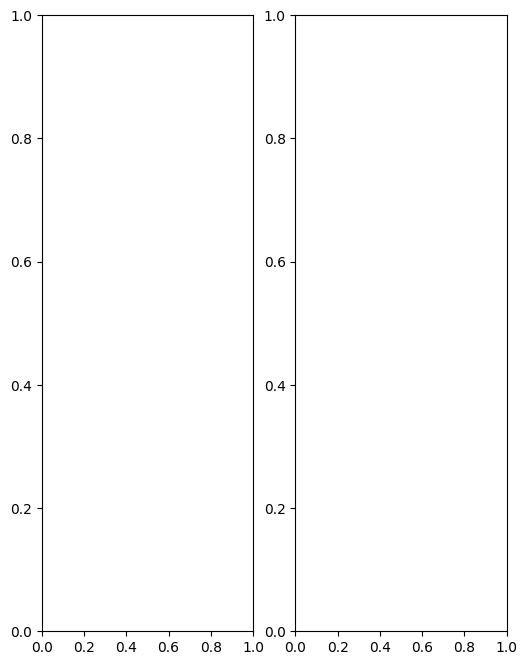

In [194]:
#Soil drainage map
fig, ax=plt.subplots(1,2,figsize=(6,8))
Soils.clip(CRW_Middle).to_crs(epsg=26986).plot(ax=ax,column='Drain_Code',cmap=my_cmap5,legend=False,legend_kwds={'loc':'upper left','fontsize':8,'framealpha':1})
#leg1 = ax.get_legend()
#new_legtxt = ['Excessively drained','Somewhat excessively drained','Well drained','Somewhat well drained','Poorly drained',
#              'Very poorly drained','No Data']

#Fixing legend entries
#for ix,eb in enumerate(leg1.get_texts()):
#    eb.set_text(new_legtxt[ix])
#    eb.set_size(fontsize=6.5)

CRW_Middle.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
#plt.title("Soil Drainage in the Charles River Watershed")
Charles.clip(CRW_Middle).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.add_artist(ScaleBar(1,location='lower right'))
ax.set_axis_off()
#ax.text(194900,859000,'Source: SSURGO data accessed from MassGIS',fontsize=10)
plt.savefig("Output Maps/Drainage for publication.png",transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

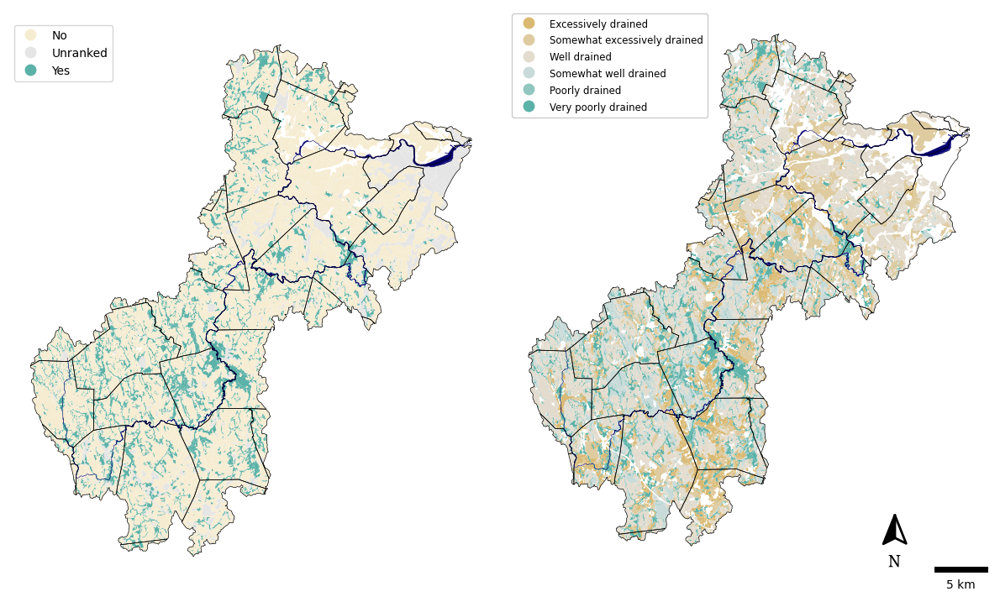

In [196]:
#Soil drainage map
fig, ax=plt.subplots(1,2,figsize=(12,8),width_ratios=[1,1],layout='tight')

Soils.plot(ax=ax[0],column='HYDRCRATNG',cmap=OWN_cmap,legend=True,legend_kwds={'loc':'upper left'})
towns.to_crs(epsg=26986).boundary.plot(ax=ax[0], color='black',linewidth=0.5)
#plt.title('Hydric Soil Rating')
Charles.plot(ax=ax[0],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[0],color='#060270',linewidth=0.4)
#ax.add_artist(ScaleBar(1,location='lower right'))
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
ax[0].axis('off')
#ax.text(194900,859000,'Source: SSURGO data accessed from MassGIS',fontsize=10)
#add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)



Soils.to_crs(epsg=26986).plot(ax=ax[1],column='Drain_Code',cmap=my_cmap5,legend=True,legend_kwds={'loc':'upper left','framealpha':1})
leg1 = ax[1].get_legend()
new_legtxt = ['Excessively drained','Somewhat excessively drained','Well drained','Somewhat well drained','Poorly drained',
              'Very poorly drained','No Data']

#Fixing legend entries
for ix,eb in enumerate(leg1.get_texts()):
    eb.set_text(new_legtxt[ix])
    eb.set_size(fontsize=8.5)

towns.to_crs(epsg=26986).boundary.plot(ax=ax[1], color='black',linewidth=0.5)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
#plt.title("Soil Drainage in the Charles River Watershed")
Charles.plot(ax=ax[1],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[1],color='#060270',linewidth=0.4)
ax[1].add_artist(ScaleBar(1,location='lower right'))
ax[1].set_axis_off()
add_north_arrow(ax=ax[1],scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
#ax.text(194900,859000,'Source: SSURGO data accessed from MassGIS',fontsize=10)
plt.savefig("Output Maps/Hydric and Drainage for publication.png",transparent=True,dpi=300,bbox_inches='tight')

# EJ Pops

In [120]:
EJPops=gpd.read_file('../../Raw_Data/EJ Data/EJ_POLY.shp',driver='pyogrio').clip(CRW)

<IPython.core.display.HTML object>

In [121]:
EJpops=EJPops.dissolve('EJ_CRITE_1')

<IPython.core.display.HTML object>

In [122]:
EJStats=pd.DataFrame(rasterstats.zonal_stats(EJpops, "../../Working_Data/TCC2021.tif",stats="count min mean max median"),index=EJpops.index)
EJStats

<IPython.core.display.HTML object>

,min,max,mean,count,median
EJ_CRITE_1,,,,,
1,1.0,98.0,37.690166,162742,28.0
2,1.0,92.0,17.658578,16689,12.0
3,1.0,85.0,12.390785,3603,8.0


In [123]:
CRWStats=pd.DataFrame(rasterstats.zonal_stats(CRW.dissolve(), "../../Working_Data/TCC2021.tif",stats="count min mean max median"))
CRWStats

<IPython.core.display.HTML object>

,min,max,mean,count,median
0,1.0,98.0,53.692368,886934,60.0


<IPython.core.display.HTML object>

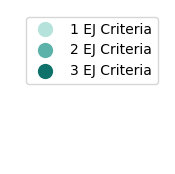

In [124]:
fig,ax=plt.subplots(figsize=(2,2))
l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#b5e3dc', marker='o',markersize=12, label='1 EJ Criteria')
l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#5bb2a8', marker='o',markersize=12, label='2 EJ Criteria')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#0e726a', marker='o',markersize=12, label='3 EJ Criteria')

ax.axis('off')
ax.legend(handles=[l1,l2,l3])
fig.savefig('Output Maps/EJ Legend.png',dpi=300,transparent=True,bbox_inches='tight')

<IPython.core.display.HTML object>

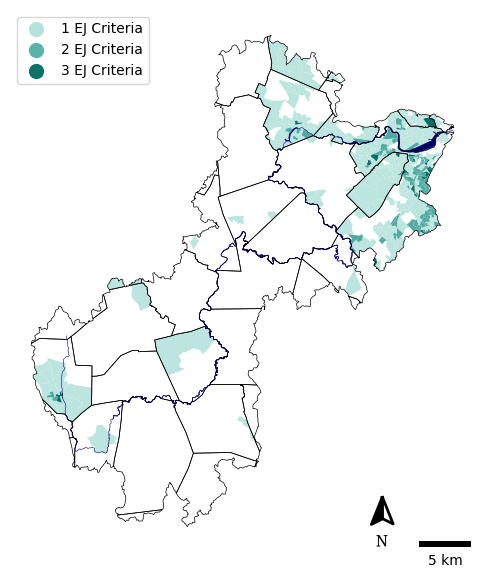

In [126]:
fig,ax=plt.subplots(figsize=(6,8))
EJPops.plot(ax=ax,column='EJ_CRITE_1',cmap='BrBG',legend=False,norm=mpl.colors.BoundaryNorm(np.linspace(-4, 4, 36),ncolors=256),vmin=1,vmax=3)
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
#plt.title('Environmental Justice Populations (2020)')
ax.add_artist(ScaleBar(1,location='lower right'))
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#b5e3dc', marker='o',markersize=12, label='1 EJ Criteria')
l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#5bb2a8', marker='o',markersize=12, label='2 EJ Criteria')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#0e726a', marker='o',markersize=12, label='3 EJ Criteria')

ax.axis('off')
ax.legend(handles=[l1,l2,l3],loc='upper left')
fig.savefig('Output Maps/EJ Legend.png',dpi=300,transparent=True,bbox_inches='tight')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.axis('off')
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.8,text_scaler=3, text_yT=-3)
fig.savefig('Output Maps/EJ Pops for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
fig,ax=plt.subplots(figsize=(6,8))
EJPops.plot(ax=ax,column='EJ_CRITE_1',cmap='BrBG',legend=False,norm=mpl.colors.BoundaryNorm(np.linspace(-4, 4, 36),ncolors=256),vmin=1,vmax=3)
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
#plt.title('Environmental Justice Populations (2020)')
ax.add_artist(ScaleBar(1,location='lower right'))
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#b5e3dc', marker='o',markersize=12, label='1 EJ Criteria')
l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#5bb2a8', marker='o',markersize=12, label='2 EJ Criteria')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#0e726a', marker='o',markersize=12, label='3 EJ Criteria')

ax.axis('off')
ax.legend(handles=[l1,l2,l3],loc='upper left')
fig.savefig('Output Maps/EJ Legend.png',dpi=300,transparent=True,bbox_inches='tight')
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
fig.savefig('Output Maps/EJ Pops for publication.png',transparent=True,dpi=300,bbox_inches='tight')

# Development Pressure

In [ ]:
# https://www.mass.gov/doc/healthy-soils-action-plan-2023/download and New England Landscape Futures data from Harvard forest

In [ ]:
scenarios=glob.glob('../../Raw_Data/NELF/*.tif')
dst_crs = 'EPSG:26986'
for fp in scenarios:
    with rio.open(fp) as src:
    
        transform, width, height = calculate_default_transform(src.crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })
        with rio.Env(CHECK_DISK_FREE_SPACE="NO"):
            with rio.open(fp[:-4]+'Reprojected.tif', 'w', **kwargs) as dst:
                for i in range(1, src.count + 1):
                    reproject(
                        source=rio.band(src, i),
                        destination=rio.band(dst, i),
                        src_transform=src.transform,
                        src_crs=src.crs,
                        dst_transform=transform,
                        dst_crs=dst_crs,
                        resampling=Resampling.nearest)

In [228]:
scenarios=glob.glob('../../Raw_Data/NELF/*01Reprojected.tif')
CC20,trans=mask(rio.open('../../Raw_Data/NELF/cc_01Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
GA20,trans=mask(rio.open('../../Raw_Data/NELF/ga_01Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
GG20,trans=mask(rio.open('../../Raw_Data/NELF/gg_01Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
RT20,trans=mask(rio.open('../../Raw_Data/NELF/rt_01Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
YC20,trans=mask(rio.open('../../Raw_Data/NELF/yc_01Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)

<IPython.core.display.HTML object>

In [229]:
scenarios=glob.glob('../../Raw_Data/NELF/*05Reprojected.tif')
CC60,trans=mask(rio.open('../../Raw_Data/NELF/cc_05Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
GA60,trans=mask(rio.open('../../Raw_Data/NELF/ga_05Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
GG60,trans=mask(rio.open('../../Raw_Data/NELF/gg_05Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
RT60,trans=mask(rio.open('../../Raw_Data/NELF/rt_05Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
YC60,trans=mask(rio.open('../../Raw_Data/NELF/yc_05Reprojected.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)

<IPython.core.display.HTML object>

Key for coding in NELF data: 
1: High Density Development
2: Low Density Development
3: Unprotected Forest
4: Conserved Forest
5: Agriculture
6: Other
7: Water

In [230]:
NELF_codes=[1,2,3,4,5,6,7]
NELF_colors=['#FFFFFF','#FFFFFF','#ABCD66','#5C8944','#FFFFFF','#FFFFFF','#060270']
NELF_cmap = mpl.colors.LinearSegmentedColormap.from_list('NELF', NELF_colors, N=7)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

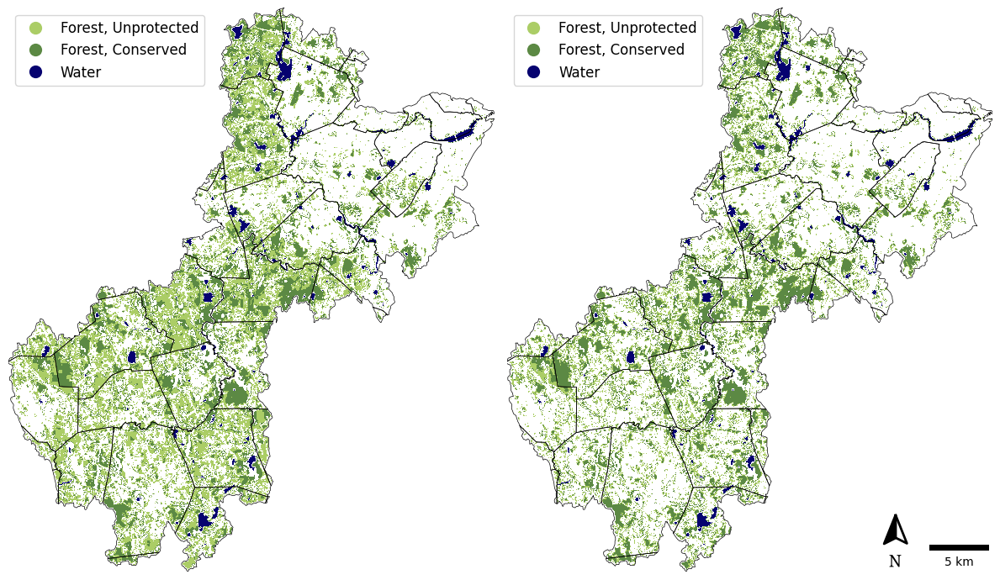

In [231]:
fig, ax=plt.subplots(1,2,figsize=(12,8),width_ratios=[1,1],layout='tight')
show(RT20,ax=ax[0],cmap=NELF_cmap,vmin=1,vmax=7,extent=full_extent)
ax[0].axis('off')
#l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#730000', marker='o',markersize=8, label='Developed, High Dens.')
#l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#E60000', marker='o',markersize=8, label='Developed, Low Dens.')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#ABCD66', marker='o',markersize=12, label='Forest, Unprotected')
l4 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#5C8944', marker='o',markersize=12, label='Forest, Conserved')
#l5 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#FFDE59', marker='o',markersize=12, label='Agriculture')
#l6 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#CCCCCC', marker='o',markersize=8, label='Other')
l7 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#060270', marker='o',markersize=12, label='Water')
towns.to_crs(epsg=26986).boundary.plot(ax=ax[0],color='black',linewidth=0.5)
ax[0].legend(handles=[l3,l4,l7],loc='upper left',fontsize=12)

show(RT60,ax=ax[1],cmap=NELF_cmap,vmin=1,vmax=7,extent=full_extent)
ax[1].axis('off')
#l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#730000', marker='o',markersize=8, label='Developed, High Dens.')
#l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#E60000', marker='o',markersize=8, label='Developed, Low Dens.')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#ABCD66', marker='o',markersize=12, label='Forest, Unprotected')
l4 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#5C8944', marker='o',markersize=12, label='Forest, Conserved')
#l5 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#FFDE59', marker='o',markersize=12, label='Agriculture')
#l6 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#CCCCCC', marker='o',markersize=8, label='Other')
l7 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#060270', marker='o',markersize=12, label='Water')
towns.to_crs(epsg=26986).boundary.plot(ax=ax[1],color='black',linewidth=0.5)
ax[1].legend(handles=[l3,l4,l7],loc='upper left',fontsize=12)
add_north_arrow(ax=ax[1],scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax[1].add_artist(ScaleBar(1,'m',location='lower right'))

fig.savefig('Output Maps/NELF RT forests 20_60.png',bbox_inches='tight',transparent=True,dpi=300)

In [77]:
unique, counts20 = np.unique(RT20.data, return_counts=True)
uf20=counts20[2]*900*2.47105381/10000
pf20=counts20[3]*900*2.47105381/10000
uf60=counts60[2]*900*2.47105381/10000
pf60=counts60[3]*900*2.47105381/10000
print('in 2020, there were '+str(uf20)+' acres of unprotected forests and '+str(pf20)+' acres of protected forests')
unique, counts60 = np.unique(RT60.data, return_counts=True)
print('by 2060, there is expected to be '+str(uf60)+' acres of unprotected forests and '+str(pf60)+' acres of protected forests')
print('delta unprotected='+str(uf60-uf20)+'\ndelta protected='+str(pf60-pf20))
print('delta unprotected='+str((uf60-uf20)/uf20*100)+'\ndelta protected='+str((pf60-pf20)/pf60*100))

<IPython.core.display.HTML object>

in 2020, there were 117484.3012639401 acres of unprotected forests and 75452.78793005459 acres of protected forests
by 2060, there is expected to be 63574.456975922694 acres of unprotected forests and 84447.769745988 acres of protected forests
delta unprotected=-53909.844288017404
delta protected=8994.98181593341
delta unprotected=-45.88684931351263
delta protected=10.6515327083114


In [97]:
forstats20=pd.DataFrame(rasterstats.zonal_stats(Charles_Towns,'../../Raw_Data/NELF/rt_01Reprojected.tif',stats="count",categorical=True),index=Charles_Towns.index)
forstats20=forstats20[[3,4]]
forstats60=pd.DataFrame(rasterstats.zonal_stats(Charles_Towns,'../../Raw_Data/NELF/rt_05Reprojected.tif',stats="count",categorical=True),index=Charles_Towns.index)
forstats60=forstats60[[3,4]]
forstats=forstats20.join(forstats60,rsuffix='.60',lsuffix='.20')
forstats['del3']=forstats['3.60']-forstats['3.20']
forstats['del4']=forstats['4.60']-forstats['4.20']
forstats['per3']=100*forstats['del3']/forstats['3.20']
forstats['per4']=100*forstats['del4']/forstats['4.20']
forstats.sort_values('per3')

<IPython.core.display.HTML object>

,3.20,4.20,3.60,4.60,del3,del4,per3,per4
NAMELSAD20,,,,,,,,
Arlington town,9.0,NaN,3.0,NaN,-6.0,NaN,-66.666667,NaN
Ashland town,347.0,574.0,146.0,631.0,-201.0,57.0,-57.925072,9.930314
Dover town,14604.0,11948.0,6495.0,14603.0,-8109.0,2655.0,-55.525883,22.221292
Foxborough town,48.0,NaN,24.0,NaN,-24.0,NaN,-50.000000,NaN
Lincoln town,9276.0,7527.0,4670.0,9028.0,-4606.0,1501.0,-49.655024,19.941544
Sherborn town,17007.0,7204.0,8617.0,10291.0,-8390.0,3087.0,-49.332628,42.851194
Bellingham town,10046.0,2485.0,5098.0,2797.0,-4948.0,312.0,-49.253434,12.555332
Wrentham town,9967.0,3521.0,5061.0,4659.0,-4906.0,1138.0,-49.222434,32.320364
Waltham city,3055.0,3366.0,1557.0,3963.0,-1498.0,597.0,-49.034370,17.736185


In [ ]:
RT2020=rioxarray.open_rasterio("../../Raw_Data/NELF/rt_01Reprojected.tif",masked=True)
RT2020=RT2020.rio.clip(CRW.to_crs(epsg=26986).geometry)
RT2020=RT2020[0,:,:]
initialdevelop=xr.where(RT2020<=2,1,np.nan)
RT60=rioxarray.open_rasterio("../../Raw_Data/NELF/rt_05Reprojected.tif",masked=True)
RT60=RT60.rio.clip(CRW.to_crs(epsg=26986).geometry)
RT60=RT60[0,:,:]
develop1=xr.where(RT60<=2,1,0)
CC60=rioxarray.open_rasterio("../../Raw_Data/NELF/cc_05Reprojected.tif",masked=True)
CC60=CC60.rio.clip(CRW.to_crs(epsg=26986).geometry)
CC60=CC60[0,:,:]
develop2=xr.where(CC60<=2,1,0)
GA60=rioxarray.open_rasterio("../../Raw_Data/NELF/ga_05Reprojected.tif",masked=True)
GA60=GA60.rio.clip(CRW.to_crs(epsg=26986).geometry)
GA60=GA60[0,:,:]
develop3=xr.where(GA60<=2,1,0)
GG60=rioxarray.open_rasterio("../../Raw_Data/NELF/gg_05Reprojected.tif",masked=True)
GG60=GG60.rio.clip(CRW.to_crs(epsg=26986).geometry)
GG60=GG60[0,:,:]
develop4=xr.where(GG60<=2,1,0)
YC60=rioxarray.open_rasterio("../../Raw_Data/NELF/yc_05Reprojected.tif",masked=True)
YC60=YC60.rio.clip(CRW.to_crs(epsg=26986).geometry)
YC60=YC60[0,:,:]
develop5=xr.where(YC60<=2,1,0)

In [ ]:
dPressure=develop1+develop2+develop3+develop4+develop5
dPressure.rio.to_raster('../../Working_Data/Development Pressure.tif')
initialdevelop.rio.to_raster('../../Working_Data/2020 development.tif')

In [98]:
dPressure,trans=mask(rio.open('../../Working_Data/Development Pressure.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
iDevelop,trans=mask(rio.open('../../Working_Data/2020 development.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
plot_extent=rio.plot.plotting_extent(rio.open('../../Working_Data/Development Pressure.tif'))

<IPython.core.display.HTML object>

In [172]:
dPress=rioxarray.open_rasterio('../../Working_Data/Development Pressure.tif',masked=True)
dPress=dPress.rio.clip(CRW.to_crs(epsg=26986).geometry)
iDev=rioxarray.open_rasterio('../../Working_Data/2020 development.tif',masked=True)
iDev=iDev.rio.clip(CRW.to_crs(epsg=26986).geometry)
iDev=vectorize(iDev.astype("uint8"))
dPress=dPress.rio.clip(iDev[iDev['_data']==0.0].to_crs(epsg=26986).geometry)
dPress=vectorize(dPress.astype("uint8")).dissolve('_data',as_index=False)
dPress=dPress.clip(CRW)

<IPython.core.display.HTML object>

C:\ProgramData\anaconda3\Lib\site-packages\xarray\core\duck_array_ops.py:188: RuntimeWarning: invalid value encountered in cast
  return data.astype(dtype, **kwargs)
C:\Users\Chad\AppData\Roaming\Python\Python311\site-packages\geocube\vector.py:62: UserWarning: The array has no name. Column name defaults to _data
  warnings.warn("The array has no name. Column name defaults to _data")
C:\ProgramData\anaconda3\Lib\site-packages\xarray\core\duck_array_ops.py:188: RuntimeWarning: invalid value encountered in cast
  return data.astype(dtype, **kwargs)
C:\Users\Chad\AppData\Roaming\Python\Python311\site-packages\geocube\vector.py:62: UserWarning: The array has no name. Column name defaults to _data
  warnings.warn("The array has no name. Column name defaults to _data")


In [173]:
Press_Stats=pd.DataFrame(rasterstats.zonal_stats(dPress, "../../Working_Data/TCC2021.tif",stats="mean"))
Press_Stats['mean']/100*(dPress.geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


0    97330.920074
1     6837.987482
2    12578.072504
3    11028.329835
4     4150.083619
5     1607.111049
dtype: float64

In [181]:
Dev_Stats=pd.DataFrame(rasterstats.zonal_stats(iDev.dissolve('_data'), "../../Working_Data/TCC2021.tif",stats="mean"))
Dev_Stats['mean']/100*(iDev.dissolve('_data').geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


0    229880.959441
1     34612.500684
dtype: float64

<IPython.core.display.HTML object>

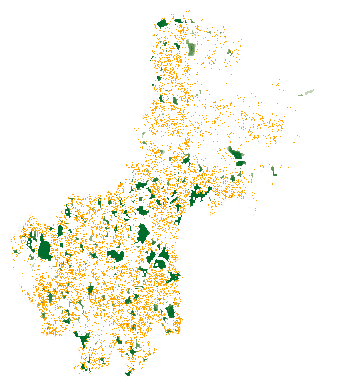

In [195]:
fig,ax=plt.subplots()
UMASS,trans=mask(rio.open('../../Raw_Data/standard/standard/iei.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
show(UMASS,cmap=my_greens2,ax=ax,extent=[195915.05,236893.2,863926.13,911511.69],vmin=0,vmax=1)
dPress[dPress['_data']>2].plot(ax=ax,color='orange')
ax.axis('off')
plt.show()

In [167]:
colors=['#e5e5e5','#e5e5e5']
my_cmap = mpl.colors.LinearSegmentedColormap.from_list('my_cmap', colors, N=2)
colors5=['#006d2c','#dab972','#c48a38'] 
my_cmap2 = mpl.colors.LinearSegmentedColormap.from_list('my_cmap2', colors5, N=5)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

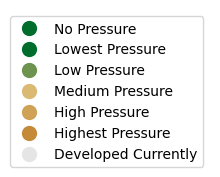

In [168]:
fig,ax=plt.subplots(figsize=(2,2))
l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#e5e5e5', marker='o',markersize=12, label='Developed Currently')
l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#006d2c', marker='o',markersize=12, label='No Pressure')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#006d2c', marker='o',markersize=12, label='Lowest Pressure')
l4 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#6d934f', marker='o',markersize=12, label='Low Pressure')
l5 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#dab972', marker='o',markersize=12, label='Medium Pressure')
l6 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#cfa255', marker='o',markersize=12, label='High Pressure')
l7 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#c48a38', marker='o',markersize=12, label='Highest Pressure')
ax.axis('off')
ax.legend(handles=[l2,l3,l4,l5,l6,l7,l1])
fig.savefig('Output Maps/NELF pressure Legend.png',dpi=300,transparent=True,bbox_inches='tight')

<IPython.core.display.HTML object>

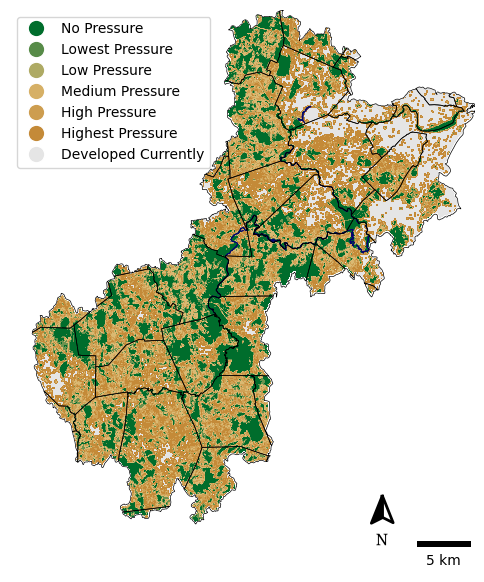

In [103]:
fig,ax=plt.subplots(figsize=(6,8))
show(dPressure,ax=ax,cmap=my_cmap2,extent=plot_extent)
show(iDevelop,ax=ax,cmap=my_cmap,extent=plot_extent)
ax.set_title('')
ax.axis('off')

l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#e5e5e5', marker='o',markersize=12, label='Developed Currently')
l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#006d2c', marker='o',markersize=12, label='No Pressure')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#578b48', marker='o',markersize=12, label='Lowest Pressure')
l4 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#aeaa64', marker='o',markersize=12, label='Low Pressure')
l5 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#d6b066', marker='o',markersize=12, label='Medium Pressure')
l6 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#cd9d4f', marker='o',markersize=12, label='High Pressure')
l7 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#c48a38', marker='o',markersize=12, label='Highest Pressure')
ax.legend(handles=[l2,l3,l4,l5,l6,l7,l1],loc='upper left')

towns.to_crs(epsg=26986).boundary.plot(ax=ax,color='black',linewidth=0.5)
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.8,text_scaler=3, text_yT=-3)
Charles.clip(CRW_Middle).to_crs(epsg=26986).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.add_artist(ScaleBar(1,'m',location='lower right'))
fig.savefig('Output Maps/Development pressure summary for publication.png',dpi=300,bbox_inches='tight',transparent=True)

In [104]:
RT20=rioxarray.open_rasterio("../../Raw_Data/NELF/rt_01.tif",masked=True)
RT20=RT20.rio.clip(CRW.to_crs(epsg=5070).geometry)
CC20=rioxarray.open_rasterio("../../Raw_Data/NELF/cc_01.tif",masked=True)
CC20=CC20.rio.clip(CRW.to_crs(epsg=5070).geometry)
GA20=rioxarray.open_rasterio("../../Raw_Data/NELF/ga_01.tif",masked=True)
GA20=GA20.rio.clip(CRW.to_crs(epsg=5070).geometry)
GG20=rioxarray.open_rasterio("../../Raw_Data/NELF/gg_01.tif",masked=True)
GG20=GG20.rio.clip(CRW.to_crs(epsg=5070).geometry)
YC20=rioxarray.open_rasterio("../../Raw_Data/NELF/yc_01.tif",masked=True)
YC20=YC20.rio.clip(CRW.to_crs(epsg=5070).geometry)
RT60=rioxarray.open_rasterio("../../Raw_Data/NELF/rt_05.tif",masked=True)
RT60=RT60.rio.clip(CRW.to_crs(epsg=5070).geometry)
CC60=rioxarray.open_rasterio("../../Raw_Data/NELF/cc_05.tif",masked=True)
CC60=CC60.rio.clip(CRW.to_crs(epsg=5070).geometry)
GA60=rioxarray.open_rasterio("../../Raw_Data/NELF/ga_05.tif",masked=True)
GA60=GA60.rio.clip(CRW.to_crs(epsg=5070).geometry)
GG60=rioxarray.open_rasterio("../../Raw_Data/NELF/gg_05.tif",masked=True)
GG60=GG60.rio.clip(CRW.to_crs(epsg=5070).geometry)
YC60=rioxarray.open_rasterio("../../Raw_Data/NELF/yc_05.tif",masked=True)
YC60=YC60.rio.clip(CRW.to_crs(epsg=5070).geometry)

<IPython.core.display.HTML object>

In [105]:
labels=['HDD','LDD','UF','CF','A','Other','Water','Total']
unique, count = np.unique(RT20.to_numpy(), return_counts = True)
RT20_Stats=pd.DataFrame({'Value':labels,'RT20':count})
unique, count = np.unique(CC20.to_numpy(), return_counts = True)
CC20_Stats=pd.DataFrame({'CC20':count})
unique, count = np.unique(GA20.to_numpy(), return_counts = True)
GA20_Stats=pd.DataFrame({'GA20':count})
unique, count = np.unique(GG20.to_numpy(), return_counts = True)
GG20_Stats=pd.DataFrame({'GG20':count})
unique, count = np.unique(YC20.to_numpy(), return_counts = True)
YC20_Stats=pd.DataFrame({'YC20':count})
unique, count = np.unique(RT60.to_numpy(), return_counts = True)
RT60_Stats=pd.DataFrame({'RT60':count})
unique, count = np.unique(CC60.to_numpy(), return_counts = True)
CC60_Stats=pd.DataFrame({'CC60':count})
unique, count = np.unique(GA60.to_numpy(), return_counts = True)
GA60_Stats=pd.DataFrame({'GA60':count})
unique, count = np.unique(GG60.to_numpy(), return_counts = True)
GG60_Stats=pd.DataFrame({'GG60':count})
unique, count = np.unique(YC60.to_numpy(), return_counts = True)
YC60_Stats=pd.DataFrame({'YC60':count})
NELF_Stats=pd.concat([RT20_Stats,CC20_Stats,GA20_Stats,GG20_Stats,YC20_Stats,RT60_Stats,CC60_Stats,GA60_Stats,GG60_Stats,YC60_Stats],axis=1)
NELF_Stats=NELF_Stats.iloc[:5,:]
NELF_Stats['Recent Trends']=(NELF_Stats['RT60']-NELF_Stats['RT20'])*900*0.00024711
NELF_Stats['Connected Communities']=900*(NELF_Stats['CC60']-NELF_Stats['CC20'])*0.00024711
NELF_Stats['Go It Alone']=900*(NELF_Stats['GA60']-NELF_Stats['GA20'])*0.00024711
NELF_Stats['Growing Global']=900*(NELF_Stats['GG60']-NELF_Stats['GG20'])*0.00024711
NELF_Stats['Yankee Cosmopolitan']=900*(NELF_Stats['YC60']-NELF_Stats['YC20'])*0.00024711
NELF_Stats=NELF_Stats.drop(['RT20','CC20','GA20','GG20','YC20','RT60','CC60','GA60','GG60','YC60'],axis=1).melt(id_vars=['Value'],var_name='Scenario')

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

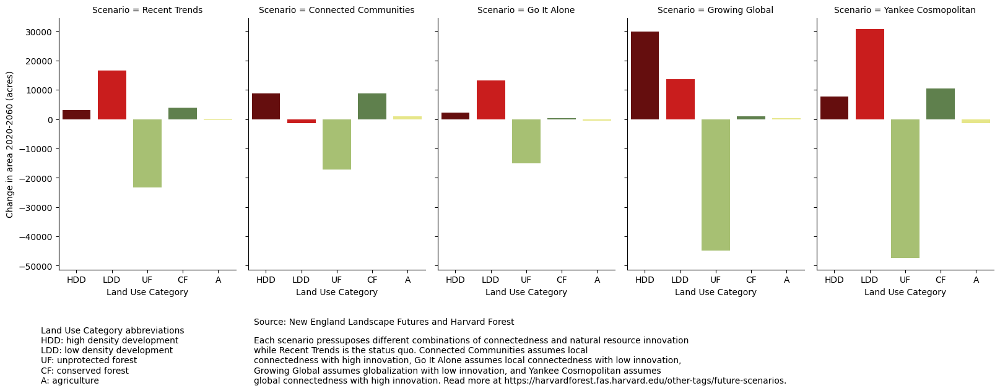

In [106]:
g=sns.catplot(NELF_Stats,x='Value',y='value',col='Scenario',kind='bar',hue='Value',palette=['#730000','#E60000','#ABCD66','#5C8944','#F5F57A'],aspect=0.65)
axes = g.axes.flatten()
axes[0].set_ylabel("Change in area 2020-2060 (acres)")
for i in np.arange(0,5):
    axes[i].set_xlabel('Land Use Category')
axes[0].text(-1,-90000,'Land Use Category abbreviations\nHDD: high density development\nLDD: low density development\nUF: unprotected forest\nCF: conserved forest\nA: agriculture')
axes[0].text(5,-70000,'Source: New England Landscape Futures and Harvard Forest')
axes[0].text(5,-90000,'Each scenario pressuposes different combinations of connectedness and natural resource innovation\nwhile Recent Trends is the status quo. Connected Communities assumes local\nconnectedness with high innovation, Go It Alone assumes local connectedness with low innovation,\nGrowing Global assumes globalization with low innovation, and Yankee Cosmopolitan assumes\nglobal connectedness with high innovation. Read more at https://harvardforest.fas.harvard.edu/other-tags/future-scenarios.')
plt.savefig('Output Maps/Change Graphs.png',dpi=300,bbox_inches='tight')

In [107]:
RT2020.plot()
plt.show()

<IPython.core.display.HTML object>

NameError: name 'RT2020' is not defined

In [ ]:
fig,ax=plt.subplots()
hidden=ax.imshow(summ[0,:,:],cmap='Greys')
show(summ,cmap='Reds',ax=ax)
ax.imshow((RT2020<=2)[0,:,:],cmap='Greys')
fig.colorbar(hidden)
plt.show()

# UMASS CAPS Data

<IPython.core.display.HTML object>

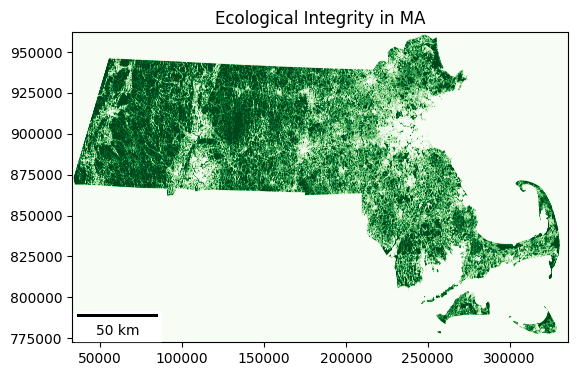

In [189]:
#Open and visualize caps data for whole state
UMASS = rio.open('../../Raw_Data/standard/standard/iei.tif').read(1)
plot_extent = rio.plot.plotting_extent(rio.open('../../Raw_Data/standard/standard/iei.tif'))
f, ax =plt.subplots()

show(UMASS,ax=ax,cmap='Greens',extent=plot_extent)

ax.set(title='Ecological Integrity in MA')
ax.add_artist(ScaleBar(1,location='lower left'))
plt.show()

<IPython.core.display.HTML object>

<Axes: >

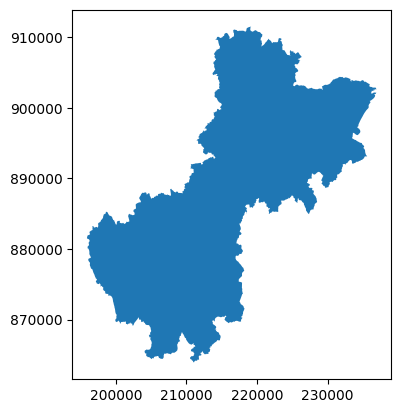

In [190]:
CRW.plot()

In [191]:
CRW.total_bounds

<IPython.core.display.HTML object>

array([195915.05, 863926.13, 236893.2 , 911511.69])

In [192]:
colors7=['#f7fcf5','#9bb686','#498643','#006d2c','#006d2c','#006d2c']
my_greens2 = mpl.colors.LinearSegmentedColormap.from_list('my_cmap7',colors7,N=10)

<IPython.core.display.HTML object>

In [193]:
CAPS=rioxarray.open_rasterio('../../Raw_Data/standard/standard/iei.tif',masked=True)
CAPS.name='INT_Rating'
CAPS=CAPS.rio.clip(CRW.to_crs(epsg=26986).geometry)
CAPS_gdf=vectorize(CAPS)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

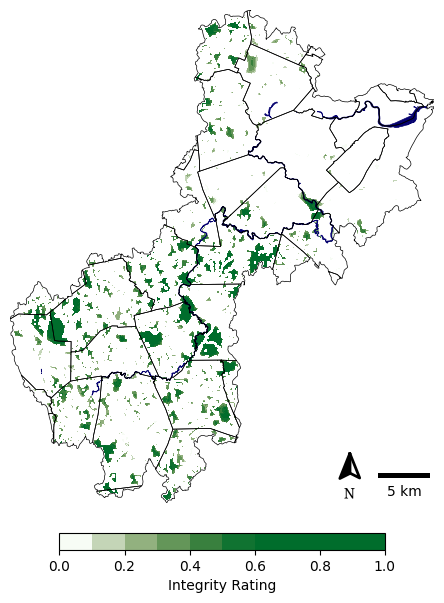

In [295]:
# Just for CRW
UMASS,trans=mask(rio.open('../../Raw_Data/standard/standard/iei.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
f, ax =plt.subplots(figsize=(6,8))
hidden=ax.imshow(UMASS[0,:,:],cmap=my_greens2,extent=[195915.05,236893.2,863926.13,911511.69],vmin=0,vmax=1)
#ax.set(title='Ecological Integrity in the Watershed')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.axis('off')
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
show(UMASS,cmap=my_greens2,ax=ax,extent=[195915.05,236893.2,863926.13,911511.69],vmin=0,vmax=1)
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
f.colorbar(hidden,label='Integrity Rating',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05)
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.8,text_scaler=3, text_yT=-3)
#ax.text(194900,859000,'Source: UMASS CAPS Data (https://umasscaps.org/)')
f.savefig('Output Maps/CAPS Ecological Integrity for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
help(geocube)

In [ ]:
fig,ax=plt.subplots(figsize=(6,8))
CAPS_gdf[CAPS_gdf['INT_Rating']>0.6].plot(ax=ax,color='#ff9101')
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
#plt.title('Hydric Soil Rating')
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.add_artist(ScaleBar(1,location='lower right'))
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
ax.axis('off')
#ax.text(194900,859000,'Source: SSURGO data accessed from MassGIS',fontsize=10)
fig.savefig('Output Maps/Top 40 CAPS sites for publication.png',transparent=True,dpi=300,bbox_inches='tight')

# Impervious Cover

In [508]:
# Mask data
with rio.open('../../Raw_Data/NLCD/NLCD_2021_Impervious_L48_20230630_gFaEArJ6Oh9dOXkwqx9r.tiff') as src:
    out_meta = src.meta
    out_image, out_transform = rio.mask.mask(src,
                                             shapes=CRW.to_crs(rio.open('../../Raw_Data/NLCD/NLCD_2021_Impervious_L48_20230630_gFaEArJ6Oh9dOXkwqx9r.tiff').crs).geometry, crop=True)


    profile = src.profile
    profile["height"] = out_image.shape[1]
    profile["width"] = out_image.shape[2]
    profile["transform"] = out_transform


    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rio.open("../../Working_Data/NLCD2021_masked.tif", "w", **out_meta) as dest:
    dest.write(out_image)

#Reproject data
dst_crs = 'EPSG:26986'

with rio.open("../../Working_Data/NLCD2021_masked.tif") as src:

    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })
    with rio.Env(CHECK_DISK_FREE_SPACE="NO"):
        with rio.open("../../Working_Data/NLCD2021.tif", 'w', **kwargs) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rio.band(src, i),
                    destination=rio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest)

# Mask data
with rio.open('../../Raw_Data/NLCD/NLCD_2008_Impervious_L48_20210604_gFaEArJ6Oh9dOXkwqx9r.tiff') as src:
    out_meta = src.meta
    out_image, out_transform = rio.mask.mask(src,
                                             shapes=CRW.to_crs(rio.open('../../Raw_Data/NLCD/NLCD_2008_Impervious_L48_20210604_gFaEArJ6Oh9dOXkwqx9r.tiff').crs).geometry, crop=True)


    profile = src.profile
    profile["height"] = out_image.shape[1]
    profile["width"] = out_image.shape[2]
    profile["transform"] = out_transform


    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rio.open("../../Working_Data/NLCD2008_masked.tif", "w", **out_meta) as dest:
    dest.write(out_image)

#Reproject data
dst_crs = 'EPSG:26986'

with rio.open("../../Working_Data/NLCD2008_masked.tif") as src:

    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })
    with rio.Env(CHECK_DISK_FREE_SPACE="NO"):
        with rio.open("../../Working_Data/NLCD2008.tif", 'w', **kwargs) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rio.band(src, i),
                    destination=rio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest)
     

<IPython.core.display.HTML object>

In [559]:
NLCD2008,trans=mask(rio.open('../../Working_Data/NLCD2008.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
NLCD2021,trans=mask(rio.open('../../Working_Data/NLCD2021.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)

<IPython.core.display.HTML object>

In [585]:
ImpStats=pd.DataFrame(rasterstats.zonal_stats(CRW_Upper.dissolve(), "../../Working_Data/NLCD2008.tif",stats="count min mean max median"),index=CRW.index)
ImpStats

<IPython.core.display.HTML object>

,min,max,mean,count,median
0,0.0,100.0,16.071523,389607,0.0


In [586]:
ImpStats=pd.DataFrame(rasterstats.zonal_stats(CRW_Upper.dissolve(), "../../Working_Data/NLCD2021.tif",stats="count min mean max median"),index=CRW.index)
ImpStats

<IPython.core.display.HTML object>

,min,max,mean,count,median
0,0.0,100.0,17.538307,389607,0.0


<IPython.core.display.HTML object>

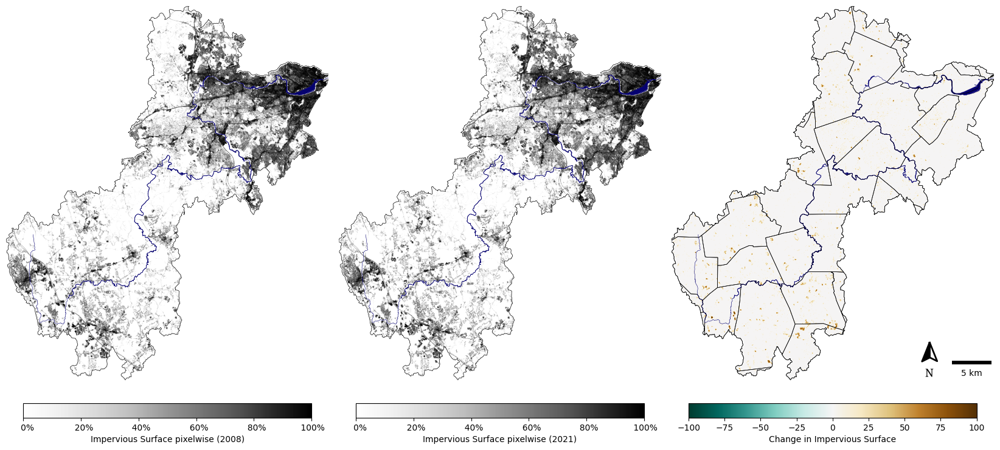

In [577]:
fig,ax=plt.subplots(1,3,figsize=(18,8),layout='tight')

hidden=ax[0].imshow(NLCD2008[0,:,:],cmap='Greys',extent=full_extent)
fig.colorbar(hidden,orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,format='%4i%%',label='Impervious Surface pixelwise (2008)')
show(NLCD2008,ax=ax[0],cmap='Greys',extent=full_extent)
CRW.boundary.plot(ax=ax[0],color='black',linewidth=0.5)
Charles.plot(ax=ax[0],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[0],color='#060270',linewidth=0.4)
ax[0].axis('off')

hidden=ax[1].imshow(NLCD2021[0,:,:],cmap='Greys',extent=full_extent)
fig.colorbar(hidden,orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,format='%4i%%',label='Impervious Surface pixelwise (2021)')
show(NLCD2021,ax=ax[1],cmap='Greys',extent=full_extent)
CRW.boundary.plot(ax=ax[1],color='black',linewidth=0.5)
Charles.plot(ax=ax[1],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[1],color='#060270',linewidth=0.4)
ax[1].axis('off')

hidden=ax[2].imshow((NLCD2021-NLCD2008)[0,:,:],cmap='BrBG_r',extent=full_extent,vmin=-100,vmax=100)
fig.colorbar(hidden,orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Change in Impervious Surface')
show(NLCD2021-NLCD2008,ax=ax[2],cmap='BrBG_r',extent=full_extent,vmin=-100,vmax=100)
CRW.boundary.plot(ax=ax[2],color='black',linewidth=0.5)
ax[2].axis('off')
towns.to_crs(epsg=26986).boundary.plot(ax=ax[2], color='black',linewidth=0.5)
Charles.plot(ax=ax[2],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[2],color='#060270',linewidth=0.4)
add_north_arrow(ax=ax[2],scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax[2].add_artist(ScaleBar(1,location='lower right'))
fig.savefig('Output Maps/Impervious Surfaces.png',dpi=300,transparent=True,bbox_inches='tight')

In [ ]:
NLCD2019_imp=ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2019').clip(Charles).select('impervious').reproject(crs='EPSG:26986',scale=30)
imp2019=geemap.ee_export_image(
    NLCD2019_imp, filename='../../Working_Data/imp2019.tif', region=Charles.geometry(), file_per_band=False
)

In [ ]:
NLCD2021_imp=ee.Image('USGS/NLCD_RELEASES/2021_REL/NLCD/2021').clip(Charles).select('impervious').reproject(crs='EPSG:26986',scale=30)
imp2021=geemap.ee_export_image(
    NLCD2021_imp, filename='../../Working_Data/imp2021.tif', region=Charles.geometry(), file_per_band=False
)

In [ ]:
f, ax =plt.subplots(nrows=1, ncols=3,figsize=(10,10))
f.tight_layout()

plot_extent = rio.plot.plotting_extent(rio.open('../../Working_Data/imp2019.tif'))
imp2019,trans=mask(rio.open('../../Working_Data/imp2019.tif'),CRW.to_crs(epsg=26986).geometry,crop=True)
hidden = ax[0].imshow(imp2019[0,:,:],cmap='Greys',extent=plot_extent)

# Add data and layers
show(imp2019,cmap='Greys',ax=ax[0],extent=plot_extent)
towns.to_crs(epsg=26986).boundary.plot(ax=ax[0], color='gray',linewidth=1)

# Add colorbar using hidden version of raster
f.colorbar(hidden,ax=ax[0],cmap='Greys',orientation='horizontal',aspect=25,shrink=0.7,pad=.04,label='Impervious Cover',format="%4i%%")

# Set properties of plot
ax[0].set(title='Impervious cover (2019)')
ax[0].add_artist(ScaleBar(1,location='lower right'))
ax[0].set_axis_off()


plot_extent = rio.plot.plotting_extent(rio.open('../../Working_Data/imp2021.tif'))
imp2021,trans=mask(rio.open('../../Working_Data/imp2021.tif'),CRW.to_crs(epsg=26986).geometry,crop=True)
hidden = ax[1].imshow(imp2021[0,:,:],cmap='Greys',extent=plot_extent)

# Add data and layers
show(imp2021,cmap='Greys',ax=ax[1],extent=plot_extent)
towns.to_crs(epsg=26986).boundary.plot(ax=ax[1], color='gray',linewidth=1)

# Add colorbar using hidden version of raster
f.colorbar(hidden,ax=ax[1],cmap='Greys',orientation='horizontal',aspect=25,shrink=0.7,pad=.04,label='Impervious Cover',format="%4i%%")

# Set properties of plot
ax[1].set(title='Impervious cover (2021)')
ax[1].add_artist(ScaleBar(1,location='lower right'))
ax[1].set_axis_off()

hidden = ax[2].imshow(imp2021[0,:,:]-imp2019[0,:,:],cmap='Oranges',extent=plot_extent,vmin=0,vmax=60)

# Add data and layers
show(imp2021-imp2019,cmap='Oranges',ax=ax[2],extent=plot_extent,vmin=0,vmax=60)
towns.to_crs(epsg=26986).boundary.plot(ax=ax[2], color='gray',linewidth=1)

# Add colorbar using hidden version of raster
f.colorbar(hidden,ax=ax[2],cmap='Oranges',orientation='horizontal',aspect=25,shrink=0.7,pad=.04,label='Impervious Cover',format="%4i%%")

# Set properties of plot
ax[2].set(title='Change')
ax[2].add_artist(ScaleBar(1,location='lower right'))
ax[2].set_axis_off()

ax[0].text(195000,845000,'Source: National Land Cover Database (NLCD)')
f.savefig('Output Maps/Impervious Cover 2019 and 2021.png',dpi=300,bbox_inches='tight')

# Heat

In [15]:
def CharClip(image):
    return image.clip(geemap.geopandas_to_ee(CRW))

<IPython.core.display.HTML object>

In [276]:
DAYMET=ee.ImageCollection("NASA/ORNL/DAYMET_V4").filterBounds(geemap.geopandas_to_ee(CRW)).filterDate('2019-01-01','2023-12-31').filter(ee.Filter.calendarRange(7, 7, 'month')).map(CharClip).select(['tmax','tmin']).mean().reproject(crs='EPSG:26986',scale=30)
geemap.ee_export_image(DAYMET,filename='../../Working_Data/JulyTemps2019_2023.tif', region=geemap.geopandas_to_ee(CRW).geometry(), file_per_band=True)

<IPython.core.display.HTML object>

Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data


In [127]:
TMAX,trans=mask(rio.open('../../Working_Data/JulyTemps2019_2023.tmax.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
TMIN,trans=mask(rio.open('../../Working_Data/JulyTemps2019_2023.tmin.tif'),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
TMAX=TMAX*1.8+32
TMIN=TMIN*1.8+32
plot_extent= rio.plot.plotting_extent(rio.open('../../Working_Data/JulyTemps2019_2023.tmax.tif'))

<IPython.core.display.HTML object>

In [128]:
TCC=rioxarray.open_rasterio('../../Working_Data/TCC2021.tif',masked=True)
TCC=TCC.rio.clip(CRW.to_crs(epsg=26986).geometry)
TCC=vectorize(TCC)
TCC_high=TCC[TCC['_data']>90].dissolve()
TCC_low=TCC[TCC['_data']<10].dissolve()

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Roaming\Python\Python311\site-packages\geocube\vector.py:62: UserWarning: The array has no name. Column name defaults to _data
  warnings.warn("The array has no name. Column name defaults to _data")


In [129]:
lows=pd.DataFrame(rasterstats.zonal_stats(TCC_high, '../../Working_Data/JulyTemps2019_2023.tmin.tif',stats="mean"))*1.8+32
highs=pd.DataFrame(rasterstats.zonal_stats(TCC_high, '../../Working_Data/JulyTemps2019_2023.tmax.tif',stats="mean"))*1.8+32
lows

<IPython.core.display.HTML object>

C:\ProgramData\anaconda3\Lib\site-packages\rasterstats\io.py:328: NodataWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn(


,mean
0,64.442969


In [130]:
highs

<IPython.core.display.HTML object>

,mean
0,84.570231


In [131]:
lows=pd.DataFrame(rasterstats.zonal_stats(TCC_low, '../../Working_Data/JulyTemps2019_2023.tmin.tif',stats="mean"))*1.8+32
highs=pd.DataFrame(rasterstats.zonal_stats(TCC_low, '../../Working_Data/JulyTemps2019_2023.tmax.tif',stats="mean"))*1.8+32
lows

<IPython.core.display.HTML object>

,mean
0,64.85455


In [132]:
highs

<IPython.core.display.HTML object>

,mean
0,84.71475


In [133]:
low_colors=['#003c30','#0e726a','#5bb2a8','#b5e3dc','#f5f5f5']
low_cmap = mpl.colors.LinearSegmentedColormap.from_list('low_cmap', low_colors, N=256)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

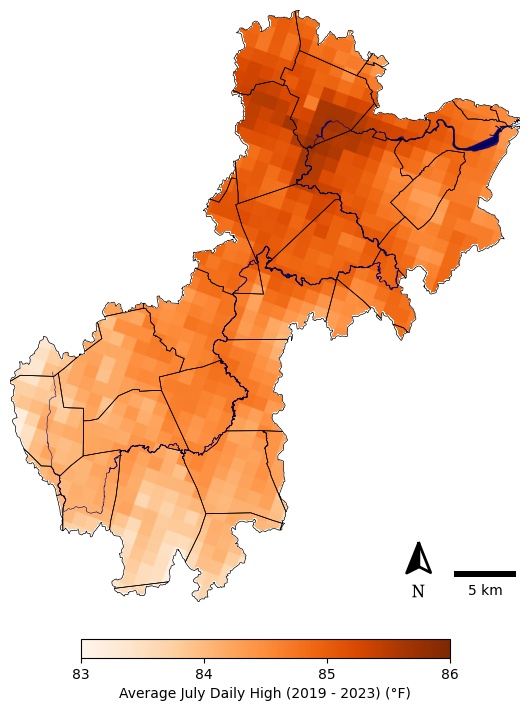

In [134]:
# Create subplots
f, ax = plt.subplots(figsize=(6,8))
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TMAX[0,:,:],cmap='Oranges',extent=plot_extent,alpha=1,vmin=83,vmax=86)

# Add data and layers
show(TMAX,cmap='Oranges',ax=ax,extent=plot_extent,alpha=1,vmin=83,vmax=86)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)

# Add colorbar using hidden version of raster
cb=f.colorbar(hidden,orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Average July Daily High (2019 - 2023) (°F)',format="%0.f")
tick_locator = mpl.ticker.MaxNLocator(nbins=3)
cb.locator = tick_locator
cb.update_ticks()

# Set properties of plot
#ax[0].set(title='Tree Cover Change (2008 - 2021) in the Charles River Watershed')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.set_axis_off()
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
f.savefig('Output Maps/heat v3 TMAX.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

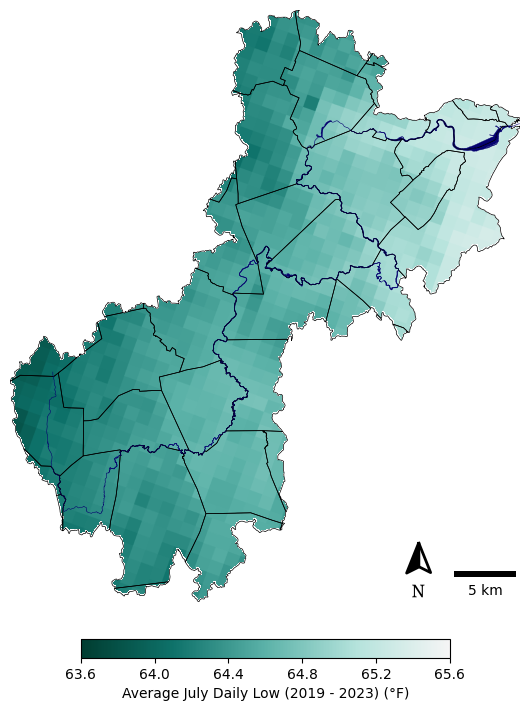

In [135]:
# Create subplots
f, ax = plt.subplots(figsize=(6,8))
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TMIN[0,:,:],cmap=low_cmap,extent=plot_extent,alpha=1,vmin=63.6,vmax=65.6)

# Add data and layers
show(TMIN,cmap=low_cmap,ax=ax,extent=plot_extent,alpha=1,vmin=63.6,vmax=65.6)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)

# Add colorbar using hidden version of raster
cb=f.colorbar(hidden,orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Average July Daily Low (2019 - 2023) (°F)',format="%0.1f")
tick_locator = mpl.ticker.MaxNLocator(nbins=5)
cb.locator = tick_locator
cb.update_ticks()

# Set properties of plot
#ax[0].set(title='Tree Cover Change (2008 - 2021) in the Charles River Watershed')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.set_axis_off()
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
f.savefig('Output Maps/heat v3 TMIN.png',transparent=True,dpi=300,bbox_inches='tight')

In [223]:
file_name = '../../Working_Data/JulyTemps2019_2023.tmax.tif'
with rio.open(file_name) as src:
    band1 = src.read(1)
    height = band1.shape[0]
    width = band1.shape[1]
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rio.transform.xy(src.transform, rows, cols)
    lons= np.array(xs)
    lats = np.array(ys)
    coords=np.array(list(zip(np.ravel(lons), np.ravel(lats))))

<IPython.core.display.HTML object>

In [224]:
np.ravel(TCC2021[0,:,:]).data.reshape(-1,1)

<IPython.core.display.HTML object>


array([[60],
       [47],
       [48],
       ...,
       [54],
       [85],
       [90]], dtype=uint8)

In [ ]:
res=mgwr.gwr.GWR(coords,y=np.ravel(TCC2021[0,:,:]).data.reshape(-1,1),X=np.ravel(TMAX[0,:,:]).data.reshape(-1,1),bw=100).fit()
print(res)

In [390]:
scale=pd.DataFrame(rasterstats.zonal_stats(CRW, "../../Raw_Data/Heat/LST_index_normwater_mapc.tif",stats="count min mean max median"),index=CRW.index)

<IPython.core.display.HTML object>

In [430]:
heat=rioxarray.open_rasterio("../../Raw_Data/Heat/LST_index_normwater_mapc.tif")
heat=heat.rio.clip(CRW.geometry)
heat=vectorize(heat.astype('float32'))
heat['_data']=(heat['_data']-scale['min'][0])/(scale['max'][0]-scale['min'][0])
heat=heat[heat['_data']>=0.5].dissolve('_data',as_index=False)

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Roaming\Python\Python311\site-packages\geocube\vector.py:62: UserWarning: The array has no name. Column name defaults to _data
  warnings.warn("The array has no name. Column name defaults to _data")


In [431]:
codes3=[1,2]
colors3=['#a6cee3','#f5f5f5','#FF9101']
my_cmap3 = mpl.colors.LinearSegmentedColormap.from_list('my_cmap3', colors3)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

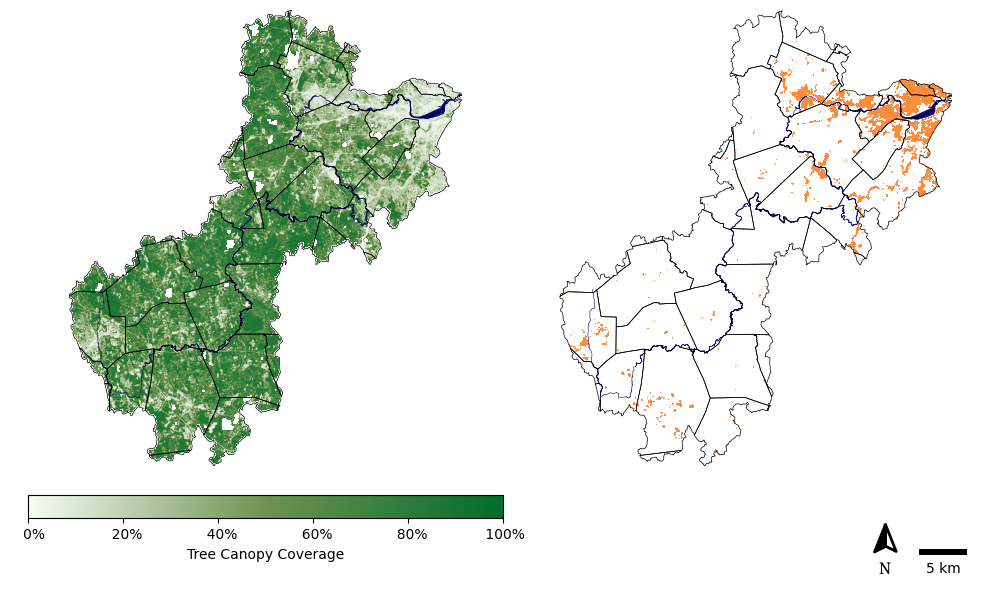

In [466]:
fig,ax=plt.subplots(1,2,figsize=(12,6),layout='tight')
hidden = ax[0].imshow(TCC2021[0,:,:],cmap=my_greens,extent=plot_extent,alpha=1,vmin=0,vmax=100)
show(TCC2021,cmap=my_greens,ax=ax[0],extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax[0], color='black',linewidth=0.5)
Charles.plot(ax=ax[0],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[0],color='#060270',linewidth=0.4)
ax[0].axis('off')
plt.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Tree Canopy Coverage')

towns.to_crs(epsg=26986).boundary.plot(ax=ax[1], color='black',linewidth=0.5)
Charles.plot(ax=ax[1],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[1],color='#060270',linewidth=0.4)
heat.plot(ax=ax[1],color='#fd8d3c')
#plt.colorbar(heat,orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='LST Index',format='%.1f')
ax[1].add_artist(ScaleBar(1,location='lower right'))
ax[1].axis('off')
ax[1].set_ylim([852000,911600])
add_north_arrow(ax=ax[1],scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
plt.savefig('Output Maps/Heat Ranking and Trees.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

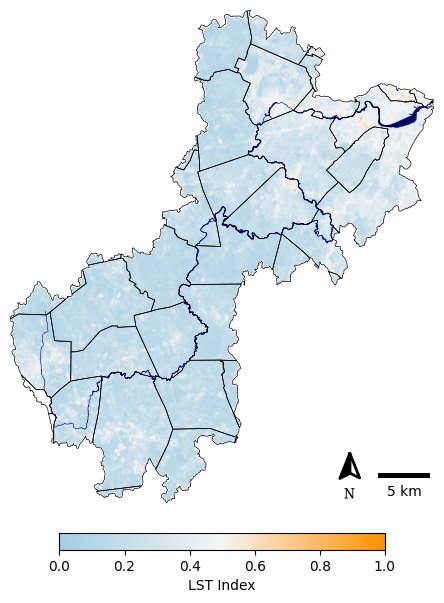

In [367]:
fig,ax=plt.subplots(figsize=(6,8))
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
hidden=ax.imshow(heat[0,:,:],cmap=my_cmap3,vmin=0,vmax=1,extent=full_extent)
show(heat,cmap=my_cmap3,ax=ax,extent=full_extent,vmin=0,vmax=1)
plt.colorbar(hidden,orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='LST Index',format='%.1f')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.axis('off')
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
plt.savefig('Output Maps/Heat Ranking wLegend.png',transparent=True,dpi=300,bbox_inches='tight')

In [117]:
def apply_scale_factors(image):
  optical_bands = image.select('SR_B.').multiply(0.0000275).add(-0.2)
  thermal_bands = image.select('ST_B.*').multiply(0.00341802).add(149.0)
  return image.addBands(optical_bands, None, True).addBands(
      thermal_bands, None, True
  )

<IPython.core.display.HTML object>

In [119]:
#Cloud mask function
def mask_l8_clouds(image):
    qa = image.select('QA_PIXEL')
    bit_mask = 1 << 1
    bit_mask1 = 1 << 2
    bit_mask2 = 1 << 3
    bit_mask3 = 1 << 4
    bit_mask4 = 1 << 5
    bit_mask5 = 1 << 7
    mask = (
        qa.bitwiseAnd(bit_mask)
        .eq(0)
        .And(qa.bitwiseAnd(bit_mask1).eq(0))
        .And(qa.bitwiseAnd(bit_mask2).eq(0))
        .And(qa.bitwiseAnd(bit_mask3).eq(0))
        .And(qa.bitwiseAnd(bit_mask4).eq(0))
        .And(qa.bitwiseAnd(bit_mask5).eq(0))
    )
    return image.updateMask(mask)

<IPython.core.display.HTML object>

In [120]:
L8=ee.ImageCollection("LANDSAT/LC08/C02/T1_L2").map(mask_l8_clouds).map(apply_scale_factors).filterBounds(geemap.geopandas_to_ee(CRW)).map(CharClip).select('ST_B10').filter(ee.Filter.calendarRange(6, 8, 'month'))

<IPython.core.display.HTML object>

In [121]:
year='2016'
img=L8.filterDate(year+'-01-01',year+'-12-31').mean().reproject(crs='EPSG:26986',scale=30)
m=geemapf.Map()
m.set_center(-71,42,10)
m.add_layer(img,vis_params={'palette':'Oranges'})
m

<IPython.core.display.HTML object>

<geemap.foliumap.Map object at 0x000001B6FFD818D0>

In [122]:
img=L8.filterDate('2019-01-01','2023-12-31').mean().reproject(crs='EPSG:26986',scale=30)
geemap.ee_export_image(img,filename='../../Working_Data/JulyLST2019_2023.tif', region=geemap.geopandas_to_ee(CRW).geometry(), file_per_band=False)

<IPython.core.display.HTML object>

Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2019_2023.tif


In [154]:
for year in ['2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']:
    img=L8.filterDate(year+'-01-01',year+'-12-31').mean().reproject(crs='EPSG:26986',scale=30)
    geemap.ee_export_image(img,filename='../../Working_Data/JulyLST'+year+'.tif', region=geemap.geopandas_to_ee(CRW).geometry(), file_per_band=False)

<IPython.core.display.HTML object>

Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2014.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2015.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2016.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2017.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2018.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2019.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2020.tif
Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data\JulyLST2021.tif
Generating URL ...
Please wait ...
Data downloaded to C:

In [123]:
Kelvin_2023,trans=mask(rio.open("../../Working_Data/JulyLST2019_2023.tif"),CRW.to_crs(epsg=26986).geometry,crop=True,filled=False)
plot_extent = rio.plot.plotting_extent(rio.open('../../Working_Data/JulyLST2023.tif'))
heat_2023=((Kelvin_2023 - 273.15) * 1.8) + 32

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

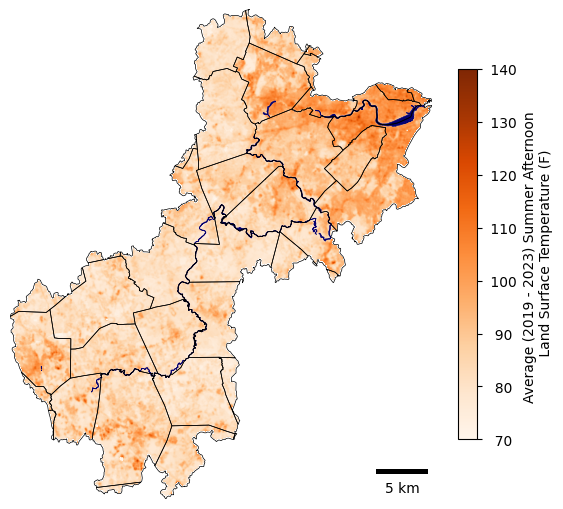

In [129]:
# Create subplots
f, ax = plt.subplots(figsize=(6,8))
f.tight_layout()

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(heat_2023[0,:,:],cmap='Oranges',extent=plot_extent,alpha=1,vmin=70,vmax=140)

# Add data and layers
show(heat_2023,cmap='Oranges',ax=ax,extent=plot_extent,alpha=1,vmin=70,vmax=140)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)

# Add colorbar using hidden version of raster
#f.colorbar(hidden, cmap='Oranges',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05,label='Average (2019 - 2023) Summer Afternoon \n Land Surface Temperature (F)',format="%4i")

# Set properties of plot
#ax[0].set(title='Tree Cover Change (2008 - 2021) in the Charles River Watershed')
ax.add_artist(ScaleBar(1,location='lower right'))
ax.set_axis_off()
#add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.95,xlim_pos=0.95,text_scaler=4, text_yT=-3)
f.savefig('Output Maps/heat v2.png',transparent=True,dpi=300,bbox_inches='tight')

# Combined Sewer Outflows

In [ ]:
layers = fiona.listlayers('../../Raw_Data/CSO/CSO_exportApril2024.gdb')
for layer in layers:
    CSO = gpd.read_file('../../Raw_Data/CSO/CSO_exportApril2024.gdb',layer=layer).to_crs(epsg=26986).clip(CRW)

In [ ]:
fig,ax=plt.subplots(figsize=(20,20))
CSO.plot(ax=ax)
cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
ax.axis('off')
fig.savefig('Output Maps/CSO all.png')

# Open Space

In [599]:
OS.dissolve().geometry.area/CRW.dissolve().geometry.area

<IPython.core.display.HTML object>


0    0.22759
dtype: float64

In [598]:
OS = gpd.read_file('../../Raw_Data/OpenSpace/OPENSPACE_POLY.shp',driver='pyogrio').clip(CRW)

<IPython.core.display.HTML object>

In [350]:
OS.dissolve().geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


0    45276.798666
dtype: float64

In [351]:
OS[~np.isin(OS.OWNER_TYPE,['M','P','S','F','L','N','B'])]

<IPython.core.display.HTML object>

,TOWN_ID,POLY_ID,SITE_NAME,FEE_OWNER,OWNER_ABRV,OWNER_TYPE,MANAGER,MANAGR_ABR,MANAGR_TYP,PRIM_PURP,...,INTSYM,OS_ID,CAL_DATE_R,FORMAL_SIT,CR_REF,OS_TYPE,EEA_CR_ID,SHAPE_AREA,SHAPE_LEN,geometry
30889,187,178,ACOE Easement,Private Owner,None,None,None,None,None,F,...,OINT,187-178,None,None,0,None,None,40349.282845,1114.770850,"POLYGON ((212634.344 881495.751, 212627.274 88..."
19062,35,737,Mission Hill Community Garden,Boston Planning and Development Agency,BPDA,O,None,None,None,A,...,None,35-737,None,None,0,None,None,646.693700,116.023961,"POLYGON ((233123.394 897794.771, 233098.244 89..."
49938,185,8,Upper Charles River Rail Trail,Owner Unknown,None,X,None,None,None,R,...,None,185-8,None,None,0,Rail Trail,None,17959.731694,1933.186424,"POLYGON ((200066.253 877635.150, 200064.894 87..."
57179,185,6,Upper Charles River Rail Trail,Owner Unknown,None,X,None,None,None,R,...,None,185-6,None,None,0,Rail Trail,None,3623.624275,372.343169,"POLYGON ((201034.475 877999.247, 201033.398 87..."
49798,269,6,Upper Charles River Rail Trail,Owner Unknown,None,X,None,None,None,R,...,None,269-6,None,None,0,None,None,8617.658588,1016.534887,"POLYGON ((207029.932 887216.765, 207026.492 88..."
21130,314,587,Watertown Linear Park,Owner Unknown,None,X,None,None,None,R,...,None,314-587,None,None,0,None,None,7731.777164,643.674169,"POLYGON ((225494.663 902283.193, 225498.380 90..."
43709,155,207,Minuteman Career and Technical High School Ath...,Minuteman Career and Technical High School,None,O,None,None,None,R,...,None,155-207,None,None,0,None,None,2114.601251,215.768651,"POLYGON ((218946.429 910420.669, 218941.959 91..."
32989,157,777,Minuteman Career and Technical High School Ath...,Minuteman Career and Technical High School,None,O,None,None,None,R,...,None,157-777,None,None,0,None,None,80583.599399,1553.838556,"POLYGON ((218740.337 910735.949, 218724.512 91..."


## Level of Protection

In [352]:
LOP_recode={
    'P': 'A',
    'T': 'B',
    'L': 'C',
    'N': 'D',
    'X': 'E'
}
OS['LOP_Recode']=OS['LEV_PROT'].map(LOP_recode)

LOP_palette = {'A':'#238b45','B':'#74c476','C':'#c7e9c0','D':'#9B4832','E':'#6E756B'}
LOP_cmap = mpl.colors.ListedColormap([LOP_palette[b] for b in ['A','B','C','D','E']])

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

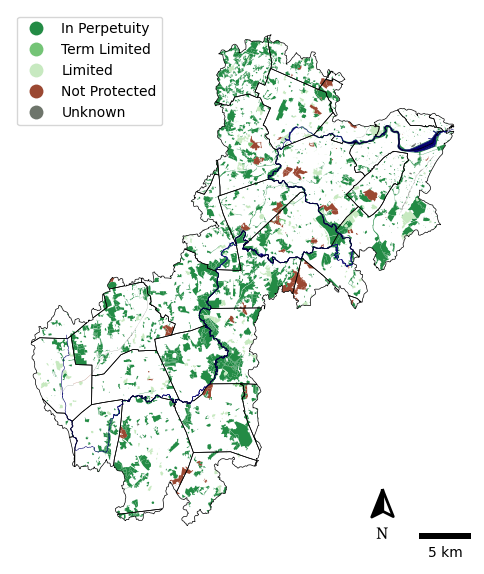

In [353]:
fig,ax=plt.subplots(figsize=(6,8))
OS.plot(ax=ax,column='LOP_Recode',legend=True,cmap=LOP_cmap,legend_kwds={'loc':'upper left'})
leg1 = ax.get_legend()
new_legtxt = ['In Perpetuity','Term Limited','Limited','Not Protected','Unknown']

#Fixing legend entries
for ix,eb in enumerate(leg1.get_texts()):
    eb.set_text(new_legtxt[ix])
ax.axis('off')
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.8,text_scaler=3, text_yT=-3)
ax.add_artist(ScaleBar(1,location='lower right'))
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
fig.savefig('Output Maps/Open Space Protection for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [354]:
LOP=OS.dissolve('LEV_PROT')[['geometry']]
(LOP.geometry.area*2.47105381/10000)/(LOP.geometry.area*2.47105381/10000).sum()*100

<IPython.core.display.HTML object>


LEV_PROT
L     9.940619
N     8.320464
P    80.971617
T     0.301471
X     0.465830
dtype: float64

In [355]:
(LOP.geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


LEV_PROT
L     4500.793891
N     3767.239772
P    36661.355796
T      136.496247
X      210.912959
dtype: float64

In [356]:
LOPStats=pd.DataFrame(rasterstats.zonal_stats(LOP, "../../Working_Data/TCC2021.tif",stats="mean"),index=LOP.index)
LOPStats['mean']/100*(LOP.geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


LEV_PROT
L     2186.407639
N     2046.367136
P    25236.200477
T       80.503649
X       94.745193
dtype: float64

In [357]:
LOPStats['mean']/100*(LOP.geometry.area*2.47105381/10000)/((LOPStats['mean']/100*(LOP.geometry.area*2.47105381/10000)).sum())*100

<IPython.core.display.HTML object>


LEV_PROT
L     7.375493
N     6.903089
P    85.130245
T     0.271566
X     0.319608
dtype: float64

In [358]:
LOPStats['mean']

<IPython.core.display.HTML object>


LEV_PROT
L    48.578266
N    54.320066
P    68.835972
T    58.978654
X    44.921466
Name: mean, dtype: float64

## Primary Purpose

In [359]:
PP_Recode={
    'R':'A',
    'C':'B',
    'B':'C',
    'H':'D',
    'A':'E',
    'W':'F',
    'F':'G',
    'O':'H',
    'X':'I'
}
OS['PP_Recode']=OS['PRIM_PURP'].map(PP_Recode)

PP_palette = {'A':'#2E6C16','B':'#41BD10','C':'#3E931D','D':'#614B43','E':'#B69E40','F':'#158FB8','G':'#5DE2E7','H':'#7A7A7A','I':'#3A3A3A'}
PP_cmap = mpl.colors.ListedColormap([PP_palette[b] for b in ['A','B','C','D','E','F','G','H','I']])

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

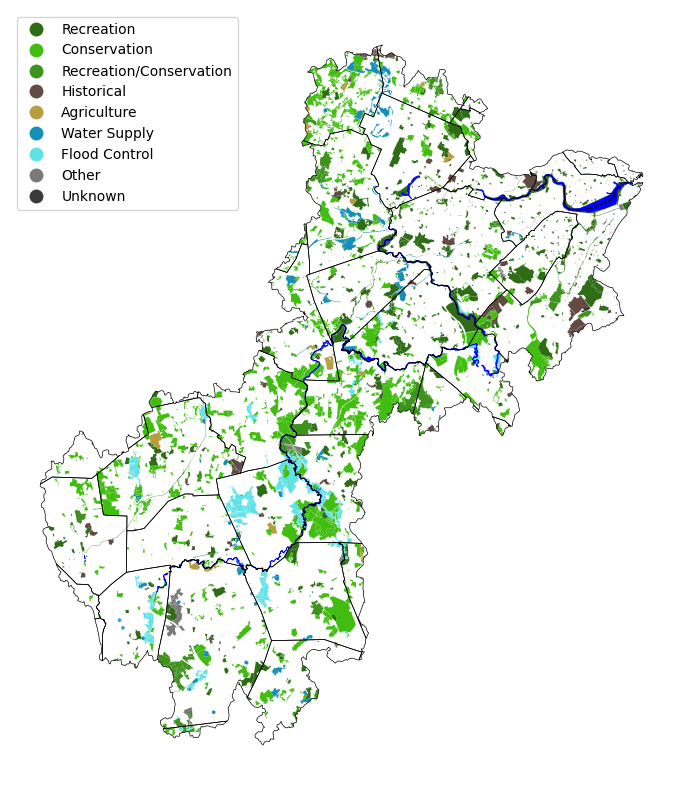

In [360]:
fig,ax=plt.subplots(figsize=(10,10))
OS.plot(ax=ax,column='PP_Recode',legend=True,cmap=PP_cmap,legend_kwds={'loc':'upper left'})
leg1 = ax.get_legend()
new_legtxt = ['Recreation','Conservation','Recreation/Conservation','Historical','Agriculture','Water Supply','Flood Control','Other','Unknown']

#Fixing legend entries
for ix,eb in enumerate(leg1.get_texts()):
    eb.set_text(new_legtxt[ix])
ax.axis('off')

towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='blue',edgecolor='blue',linewidth=0.5)
fig.savefig('Output Maps/Open Space Primary Purpose.png',transparent=True,dpi=300,bbox_inches='tight')

## Public Access

In [361]:
PA_recode={
    'Y':'A',
    'L':'B',
    'N':'C',
    'X':'D'
}
OS['PA_Recode']=OS['PUB_ACCESS'].map(PA_recode)

PA_palette = {'A':'mediumseagreen','B':'goldenrod','C':'indianred','D':'#696969'}
PA_cmap = mpl.colors.ListedColormap([PA_palette[b] for b in ['A','B','C','D']])

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

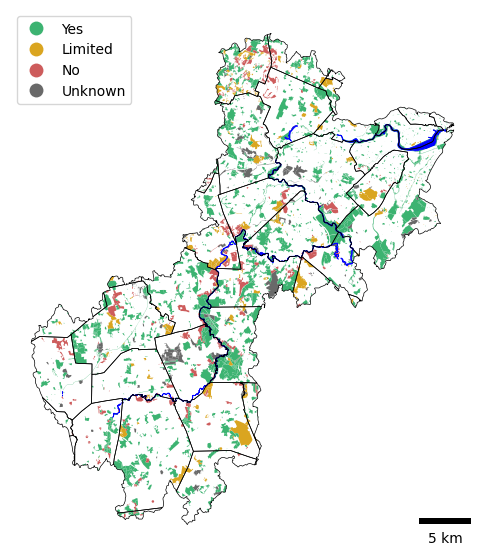

In [362]:
fig,ax=plt.subplots(figsize=(6,8))
OS.plot(ax=ax,column='PA_Recode',legend=True,cmap=PA_cmap,legend_kwds={'loc':'upper left'})
leg1 = ax.get_legend()
new_legtxt = ['Yes','Limited','No','Unknown']

#Fixing legend entries
for ix,eb in enumerate(leg1.get_texts()):
    eb.set_text(new_legtxt[ix])
ax.axis('off')

ax.add_artist(ScaleBar(1,location='lower right'))
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='blue',edgecolor='blue',linewidth=0.5)
fig.savefig('Output Maps/Open Space Public Access wLegend.png',transparent=True,dpi=300,bbox_inches='tight')

## Ownership

In [363]:
#Discovered one property with missing ownership data and manually assigned to unknown and updated Rail Trail ownership
OS.OWNER_TYPE[30889]='F'
OS.OWNER_TYPE[OS.SITE_NAME=='Upper Charles River Rail Trail']='M'

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\2849678251.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  OS.OWNER_TYPE[30889]='F'
C:\Users\Chad\AppData\Local\Temp\ipykernel_13084\2849678251.py:2: SettingWithCopyWarning: 
A value is tr

In [364]:
OWN_recode={
    'M':'A',
    'P':'B',
    'S':'C',
    'L':'D',
    'F':'E',
    'N':'F',
    'B':'G',
    'O':'H',
    'X':'I'
}
OS['OWN_Recode']=OS['OWNER_TYPE'].map(OWN_recode)

OWN_palette = {'A':'#5BB3A8','B':'#cfa155','C':'#258880','D':'#74c476','E':'#015F56','F':'#995d13','G':'#238b45','H':'#7b7373','I':'#281D19'}
OWN_cmap = mpl.colors.ListedColormap([OWN_palette[b] for b in ['A','B','C','D','E','F','G','H','I']])

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

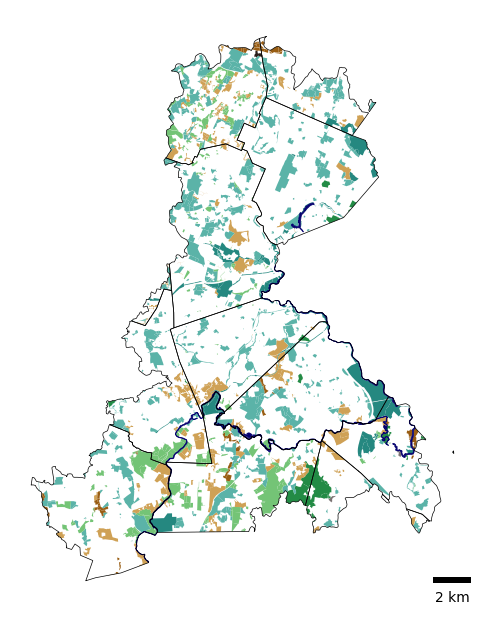

In [366]:
fig,ax=plt.subplots(figsize=(6,8))
OS.clip(CRW_Middle).plot(ax=ax,column='OWN_Recode',legend=False,cmap=OWN_cmap,legend_kwds={'loc':'upper left','fontsize':10})
#leg1 = ax.get_legend()
#new_legtxt = ['Federal','State','Municipal','Private Nonprofit','Private for Profit','Public Nonprofit','Land Trust','Other','Unknown']

#Fixing legend entries
#for ix,eb in enumerate(leg1.get_texts()):
#    eb.set_text(new_legtxt[ix])
ax.axis('off')

ax.add_artist(ScaleBar(1,location='lower right'))
CRW_Middle.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.clip(CRW_Middle).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
fig.savefig('Output Maps/Open Space Ownership for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

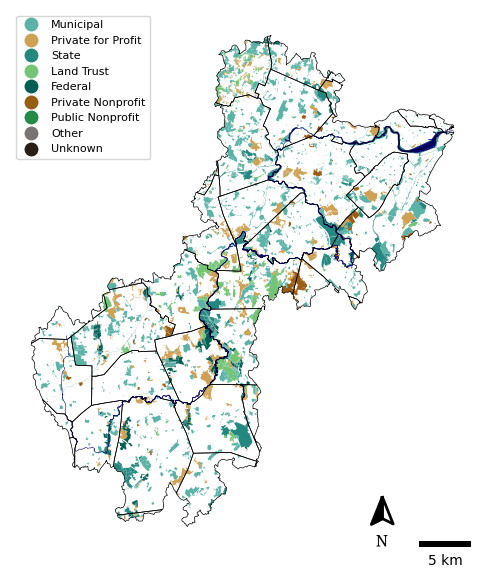

In [368]:
fig,ax=plt.subplots(figsize=(6,8))
OS.plot(ax=ax,column='OWN_Recode',legend=True,cmap=OWN_cmap,legend_kwds={'loc':'upper left','fontsize':8})
leg1 = ax.get_legend()
new_legtxt = ['Municipal','Private for Profit','State','Land Trust','Federal','Private Nonprofit','Public Nonprofit','Other','Unknown']

#Fixing legend entries
for ix,eb in enumerate(leg1.get_texts()):
    eb.set_text(new_legtxt[ix])
ax.axis('off')

ax.add_artist(ScaleBar(1,location='lower right'))
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.8,text_scaler=3, text_yT=-3)
fig.savefig('Output Maps/Open Space Ownership for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [215]:
# area in square meters converted to acres
(OS.dissolve('OWN_Recode')['geometry'].area*2.47105381/10000)

<IPython.core.display.HTML object>


OWN_Recode
A    19428.017207
B     9154.172087
C     6639.449582
D     4856.738653
E     3366.068214
F     1788.084031
G       21.763356
H       20.594972
I        1.910564
dtype: float64

In [216]:
(OS.dissolve('OWN_Recode')['geometry'].area*2.47105381/10000)/sum(OS.dissolve('OWN_Recode')['geometry'].area*2.47105381/10000)*100

<IPython.core.display.HTML object>


OWN_Recode
A    42.909432
B    20.218241
C    14.664132
D    10.726771
E     7.434422
F     3.949228
G     0.048067
H     0.045487
I     0.004220
dtype: float64

In [217]:
OSStats=pd.DataFrame(rasterstats.zonal_stats(OS.dissolve('OWN_Recode'), "../../Working_Data/TCC2021.tif",stats="count min mean max median"),index=OS.dissolve('OWN_Recode').index)
OSStats['mean']*OS.dissolve('OWN_Recode')['geometry'].area*2.47105381/10000*(1/100)

<IPython.core.display.HTML object>


OWN_Recode
A    12764.860208
B     5534.987023
C     4332.507308
D     3718.461929
E     2217.744250
F     1050.841175
G       14.867093
H        5.618220
I        0.735567
dtype: float64

In [218]:
(OSStats['mean']*OS.dissolve('OWN_Recode')['geometry'].area*2.47105381/10000*(1/100))/((OSStats['mean']*OS.dissolve('OWN_Recode')['geometry'].area*2.47105381/10000*(1/100)).sum())*100

<IPython.core.display.HTML object>


OWN_Recode
A    43.065425
B    18.673653
C    14.616789
D    12.545155
E     7.482111
F     3.545274
G     0.050158
H     0.018954
I     0.002482
dtype: float64

In [219]:
OSStats['mean']

<IPython.core.display.HTML object>


OWN_Recode
A    65.703361
B    60.464092
C    65.254013
D    76.562941
E    65.885303
F    58.769116
G    68.312500
H    27.279570
I    38.500000
Name: mean, dtype: float64

## Statistics

In [109]:
OSStats=pd.DataFrame(rasterstats.zonal_stats(OS.dissolve(), "../../Working_Data/TCC2021.tif",stats="mean"))
OSStats['mean']

<IPython.core.display.HTML object>


0    65.467792
Name: mean, dtype: float64

In [ ]:
LOP_zones=OS.dissolve(by='LEV_PROT')[['geometry']]
LOP_stats=pd.DataFrame(rasterstats.zonal_stats(LOP_zones, "../../Working_Data/TCC"+'2008'+".tif",stats="count min mean max median"),index=LOP_zones.index)
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(LOP_zones, "../../Working_Data/TCC"+year+".tif",stats="count min mean max median"),index=LOP_zones.index)
    LOP_stats=LOP_stats.join(stats,on=LOP_zones.index,rsuffix=year)
LOP_stats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/Canopy by Level of Protection.csv')

In [ ]:
LOPData=pd.read_csv('../../Working_Data/Canopy by Level of Protection.csv')
LOPData=pd.melt(LOPData,id_vars='LEV_PROT',var_name='Year')
for i in LOPData.index:
    LOPData['Year'].iloc[i]=LOPData['Year'].iloc[i][-4:]
LOPData['LOP_Recode']=LOPData['LEV_PROT'].map(LOP_recode)
LOPData=LOPData.sort_values(['LOP_Recode','Year'])

In [ ]:
fig,ax=plt.subplots(figsize=(6,8))
sns.lineplot(LOPData,x='Year',y='value',hue='LOP_Recode',ax=ax,legend=True,palette={'A':'#238b45','B':'#74c476','C':'#c7e9c0','D':'#9B4832','E':'#6E756B'})
ax.set_ylabel('Canopy Coverage (%)')
ax.set_xlabel('Year')

leg1 = ax.get_legend()
new_legtxt = ['In Perpetuity','Term Limited','Limited','Not Protected','Unknown']
leg1.set_title('')
plt.xticks(rotation=45)

#Fixing legend entries
for ix,eb in enumerate(leg1.get_texts()):
    eb.set_text(new_legtxt[ix])

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
fig.savefig('Output Maps/Canopy time series by Level of Protection.png',dpi=300,transparent=True,bbox_inches='tight')

# Parcel Data

In [14]:
# I clipped this in ArcGIS because was so large and had to combine east and west
Parcels=gpd.read_file('../../Working_Data/ParcelsClipped_fromstate.shp',driver='pyogrio')

<IPython.core.display.HTML object>

In [15]:
codes=Parcels.USE_CODE.unique()
codes=codes[codes != np.array(None)]
codes.sort()
np.savetxt("../../Working_Data/ParcelsUseCodes.csv", codes,fmt='%s', delimiter=",")
#https://www.mass.gov/doc/property-type-classification-codes-non-arms-length-codes-and-sales-report-spreadsheet/download

<IPython.core.display.HTML object>

In [16]:
public=pd.read_csv('../../Working_Data/ParcelsUseCodes_CONVERTER.csv')
genCats=pd.read_csv('../../Working_Data/ParcelsUseCodes_CONVERTER_GeneralCats.csv')

<IPython.core.display.HTML object>

In [17]:
Parcels_wPublic=Parcels.merge(public, on='USE_CODE')

<IPython.core.display.HTML object>

In [18]:
Parcels_GEN=Parcels.merge(genCats, on='USE_CODE')

<IPython.core.display.HTML object>

In [19]:
bad_geos_indexes=Parcels_wPublic[~Parcels_wPublic.geometry.is_valid].index
for i in bad_geos_indexes:
    Parcels_wPublic.geometry[i]=shapely.validation.make_valid(Parcels_wPublic.geometry[i])

bad_geos_indexes=Parcels_GEN[~Parcels_GEN.geometry.is_valid].index
for i in bad_geos_indexes:
    Parcels_GEN.geometry[i]=shapely.validation.make_valid(Parcels_GEN.geometry[i])

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Local\Temp\ipykernel_55424\3526311705.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  Parcels_wPublic.geometry[i]=shapely.validation.make_valid(Parcels_wPublic.geometry[i])
C:\Users\Chad\AppData\Local\Temp\ipykernel

<IPython.core.display.HTML object>

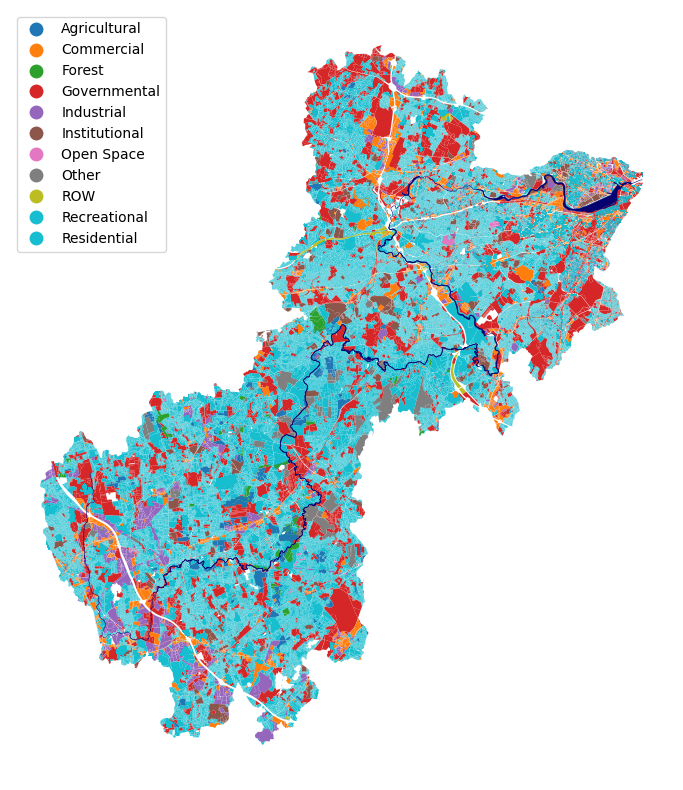

In [20]:
fig,ax=plt.subplots(figsize=(10,10))
Parcels_GEN.plot(ax=ax,column='GenCats',legend=True,legend_kwds={'loc':'upper left'})
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
ax.axis('off')
fig.savefig('Output Maps/Land Categories.png',dpi=300,transparent=True,bbox_inches='tight')

In [21]:
Parcels_GEN=Parcels_GEN.dissolve('GenCats')

<IPython.core.display.HTML object>

In [22]:
ParGENStats=pd.DataFrame(rasterstats.zonal_stats(Parcels_GEN, "../../Working_Data/TCC2021.tif",stats="mean"),index=Parcels_GEN.index)
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(Parcels_GEN, "../../Working_Data/TCC"+year+".tif",stats="mean"),index=Parcels_GEN.index)
    ParGENStats=ParGENStats.join(stats,rsuffix=year)
ParGENStats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/AverageCanopy over time by Land Use.csv')

<IPython.core.display.HTML object>

In [23]:
CanParData=pd.read_csv('../../Working_Data/AverageCanopy over time by Land Use.csv')
CanParData=pd.melt(CanParData,id_vars='GenCats',var_name='Year')
for i in CanParData.index:
    CanParData['Year'].iloc[i]=CanParData['Year'].iloc[i][-4:]

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Local\Temp\ipykernel_55424\1702887967.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  CanParData['Year'].iloc[i]=CanParData['Year'].iloc[i][-4:]
C:\Users\Chad\AppData\Local\Temp\ipykernel_55424\1702887967.py:4: Sett

In [24]:
CanParData=CanParData.pivot(columns='GenCats',index='Year')

<IPython.core.display.HTML object>

In [25]:
areas=(Parcels_GEN.geometry.area*2.47105381/10000)
areas

<IPython.core.display.HTML object>


GenCats
Agricultural      3946.599934
Commercial       10356.120258
Forest            1790.940654
Governmental     38949.389932
Industrial        8603.923033
Institutional     6568.473583
Open Space        2773.543608
Other             6065.554419
ROW                569.627279
Recreational      7360.799406
Residential      97070.570011
dtype: float64

In [26]:
for col in CanParData.columns:
    CanParData[col]=CanParData[col]*areas[col[1]]/100

<IPython.core.display.HTML object>

In [27]:
palette = {'Agricultural':'#c48a38','Commercial':'#7c4809',
           'Forest':'#00441b','Governmental':'#0e726a','Industrial':'#c1c1c1',
           'Institutional':'#b5e3dc','Open Space':'#41ab5d','Other':'#006d2c','ROW':'#757575',
           'Recreational':'#e5e5e5','Residential':'#543005'}
new_cmap = mpl.colors.ListedColormap([palette[b] for b in ['Residential','Governmental','Recreational','Other','Industrial',
                                                           'Commercial','Institutional','Agricultural','Forest','Open Space','ROW']])

<IPython.core.display.HTML object>

In [28]:
CanParData=CanParData.value[['Residential','Governmental','Recreational','Other','Industrial','Commercial','Institutional',
                             'Agricultural','Forest','Open Space','ROW']]

<IPython.core.display.HTML object>

In [29]:
100*(CanParData.T['2021']-CanParData.T['2008'])/CanParData.T['2008']

<IPython.core.display.HTML object>


GenCats
Residential     -6.408536
Governmental    -5.444623
Recreational    -4.098023
Other           -6.077956
Industrial      -9.116877
Commercial      -6.974028
Institutional   -4.518356
Agricultural    -6.304118
Forest          -6.602309
Open Space      -9.293299
ROW              0.433550
dtype: float64

<IPython.core.display.HTML object>

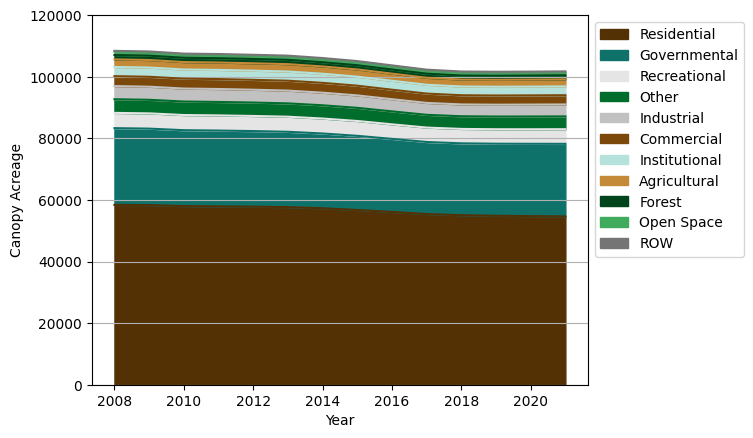

In [30]:
ax=CanParData.plot.area(stacked=True,legend=True,cmap=new_cmap)
ax.set(ylabel='Canopy Acreage',xlabel='Year')
ax.set_ylim([0,120000])
legend=ax.get_legend()
legend.set_title('')
#ax.legend(loc='upper left', labels=['Agricultural','Commercial','Forest','Governmental',
#                                                           'Industrial','Institutional','Open Space','Other','ROW','Recreational','Residential'])
ax.grid(which='major',axis='y',visible=True)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.savefig('Output Maps/Canopy by Land use type.png',dpi=300,transparent=True,bbox_inches='tight')

<IPython.core.display.HTML object>

ValueError: Could not interpret value `value` for `y`. An entry with this name does not appear in `data`.

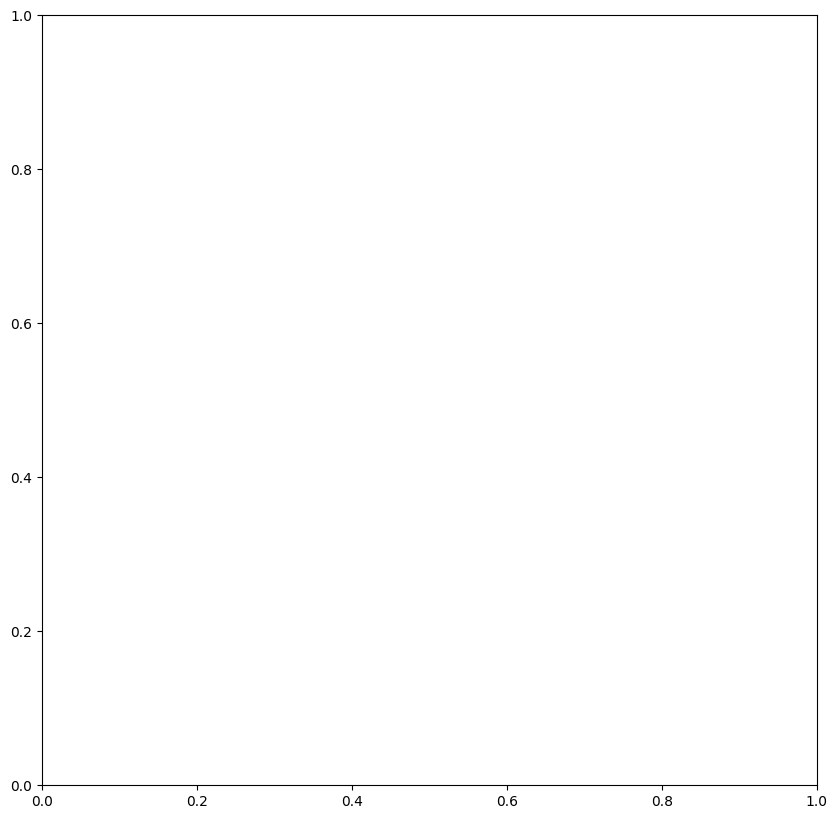

In [31]:
fig,ax=plt.subplots(figsize=(10,10))

sns.lineplot(CanParData,x='Year',y='value',hue='GenCats',ax=ax,legend=True)
ax.set_ylabel('Mean Canopy Coverage (%)')
ax.set_xlabel('Year')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(decimals=0))
fig.savefig('Output Maps/Canopy Coverage by Land Use over Time.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
Parcels_dissolved=Parcels_wPublic.dissolve('Public',as_index=False)

In [32]:
Parcels_U=Parcels_wPublic.clip(CRW_Upper).dissolve('Public')
Parcels_M=Parcels_wPublic.clip(CRW_Middle).dissolve('Public')
Parcels_L=Parcels_wPublic.clip(CRW_Lower).dissolve('Public')

<IPython.core.display.HTML object>

In [34]:
ParStats_U=pd.DataFrame(rasterstats.zonal_stats(Parcels_U, "../../Working_Data/TCC2021.tif",stats="count min mean max median"),index=Parcels_U.index)
ParStats_U

<IPython.core.display.HTML object>

,min,max,mean,count,median
Public,,,,,
R,1.0,96.0,58.496940,272508,66.0
U,1.0,97.0,65.895543,82627,79.0
X,2.0,93.0,46.391371,7139,43.0


In [35]:
(ParStats_U['mean']/100)*Parcels_U.geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


Public
R    35459.465119
U    12176.857426
X      736.752863
dtype: float64

In [36]:
ParStats_M=pd.DataFrame(rasterstats.zonal_stats(Parcels_M, "../../Working_Data/TCC2021.tif",stats="count min mean max median"),index=Parcels_M.index)
ParStats_M

<IPython.core.display.HTML object>

,min,max,mean,count,median
Public,,,,,
R,1.0,97.0,59.492863,219057,68.0
U,1.0,96.0,63.852691,76920,79.0
X,2.0,95.0,52.598302,2945,57.0


In [37]:
(ParStats_M['mean']/100)*Parcels_M.geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


Public
R    29033.766851
U    11357.874109
X      347.947337
dtype: float64

In [38]:
ParStats_L=pd.DataFrame(rasterstats.zonal_stats(Parcels_L, "../../Working_Data/TCC2021.tif",stats="count min mean max median"),index=Parcels_L.index)
ParStats_L

<IPython.core.display.HTML object>

,min,max,mean,count,median
Public,,,,,
R,1.0,94.0,32.730085,105722,26.0
U,1.0,95.0,39.335596,41392,28.0
X,2.0,93.0,30.322111,8525,22.0


In [39]:
(ParStats_L['mean']/100)*Parcels_L.geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


Public
R    7709.916435
U    3684.075842
X     575.446477
dtype: float64

In [ ]:
Parcels_dissolved.geometry.area*2.47105381/10000

In [ ]:
Parcels_dissolved

In [ ]:
ParStats=pd.DataFrame(rasterstats.zonal_stats(Parcels_dissolved, "../../Working_Data/TCC2021.tif",stats="count min mean max median"),index=Parcels_dissolved.Public)
ParStats

In [ ]:
my_palette = {'R':'#ecd8a5','U':'#5bb2a8','X':'#d5d5d5'}
my_cmap10 = mpl.colors.ListedColormap([my_palette[b] for b in ['R','U','X']])

In [ ]:
fig,ax=plt.subplots(figsize=(6,8))
Parcels_dissolved.plot(ax=ax,column='Public',cmap=my_cmap10,legend=True,legend_kwds={'loc':'upper left'})
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
#plt.title('Hydric Soil Rating')
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
ax.add_artist(ScaleBar(1,location='lower right'))
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')
leg1 = ax.get_legend()
new_legtxt = ['Private','Public','Unknown']

#Fixing legend entries
for ix,eb in enumerate(leg1.get_texts()):
    eb.set_text(new_legtxt[ix])
ax.axis('off')
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
#ax.text(194900,859000,'Source: SSURGO data accessed from MassGIS',fontsize=10)
fig.savefig('Output Maps/Parcel public private for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
Parcels_towns_dissolved=Parcels_wPublic.dissolve(['Public','TOWN_ID'],as_index=False).sort_values('TOWN_ID')
Parcels_towns_stats=pd.DataFrame(rasterstats.zonal_stats(Parcels_towns_dissolved, "../../Working_Data/TCC2021.tif",stats="mean"),index=Parcels_towns_dissolved.index)

In [ ]:
town_dict={
    10: 'Arlington',
    14: 'Ashland',  
    25:'Bellingham',  
    26: 'Belmont',  
    35:'Boston',  
    46:'Brookline',  
    49: 'Cambridge',  
    73:'Dedham',  
    78: 'Dover',  
    99:'Foxborough', 
    101:'Franklin', 
    136: 'Holliston', 
    138: 'Hopedale',
    139:'Hopkinton', 
    155:'Lexington', 
    157:'Lincoln', 
    175:'Medfield', 
    177:'Medway', 
    179:'Mendon', 
    185:'Milford', 
    187:'Millis', 
    198:'Natick', 
    199:'Needham', 
    207:'Newton', 
    208:'Norfolk', 
    269:'Sherborn',
    274:'Somerville', 
    307:'Walpole', 
    308:'Waltham', 
    314:'Watertown', 
    315:'Wayland', 
    317:'Wellesley', 
    333:'Weston', 
    335:'Westwood', 
    350:'Wrentham'
}

In [ ]:
Parcels_statsM.sort_values(['TOWN_ID','Public'])

In [ ]:
Parcels_statsbytown=Parcels_towns_dissolved.join(Parcels_towns_stats)[['Public','TOWN_ID','mean']]
Parcels_statsbytown=Parcels_statsbytown.replace({"TOWN_ID": town_dict})
Parcels_statsU=Parcels_statsbytown[np.isin(Parcels_statsbytown['TOWN_ID'],Upper)]
Parcels_statsM=Parcels_statsbytown[np.isin(Parcels_statsbytown['TOWN_ID'],Middle)]
Parcels_statsL=Parcels_statsbytown[np.isin(Parcels_statsbytown['TOWN_ID'],Lower)]
ax=sns.catplot(
    data=Parcels_statsM.sort_values(['TOWN_ID','Public']), x="Public", y="mean", col="TOWN_ID",
    kind="bar", height=3, aspect=.4,hue='Public',orient='v',palette=my_palette
)
ax.set_titles(col_template="{col_name}")
ax.set(ylabel='Mean Canopy Coverage (%)',xlabel='')
ax.set_xticklabels(labels=['Private','Public','Unknown'],rotation=45)
plt.savefig('Output Maps/Canopy by Town (2021).png',dpi=300,transparent=True,bbox_inches='tight')

In [ ]:
parcels=gpd.read_file('../../Working_Data/Parcels_Clipped.shp',driver='pyogrio')

In [ ]:
parcels.columns

In [ ]:
owners=parcels.owner_name
owners

In [ ]:
def parcelsearch(search):
    return parcels[owners.str.contains(search)==True]

In [ ]:
# https://www.mass.gov/info-details/find-my-electric-gas-and-water-company
# NSTAR
# Medical Area Total Energy? - a powerplant in Longwood
# Alliance Energy LLC? - gas terminals
# Southern Energy Kendall - generator in Kendall Square
# Deveaney Energy Inc - utility in Newton
# ANP Bellingham Energy Company - natural gas plant in Bellingham
# Northeast Energy Assoc - generators in Bellingham

In [ ]:
owners[owners.str.contains('ELECTR')==True]

In [ ]:
eversource=pd.concat([parcelsearch('NSTAR E'),parcelsearch('NSTAR G'),parcels[owners=='NSTAR']]).dissolve()
national=pd.concat([parcelsearch('MASS ELE'),parcelsearch('MASSACHUSETTS ELE')]).dissolve()
electric=pd.concat([eversource,national]).dissolve()

In [ ]:
U_stats=pd.DataFrame(rasterstats.zonal_stats(electric, "../../Working_Data/TCC"+'2008'+".tif",stats="count min mean max median"),index=electric.index)
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(electric, "../../Working_Data/TCC"+year+".tif",stats="count min mean max median"),index=electric.index)
    U_stats=U_stats.join(stats,on=electric.index,rsuffix=year)
U_stats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/Canopy in electric parcels.csv')

In [ ]:
O_stats=pd.DataFrame(rasterstats.zonal_stats(CRW.dissolve(), "../../Working_Data/TCC"+'2008'+".tif",stats="count min mean max median"),index=CRW.dissolve().index)
for year in ['2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
    stats=pd.DataFrame(rasterstats.zonal_stats(CRW.dissolve(), "../../Working_Data/TCC"+year+".tif",stats="count min mean max median"),index=CRW.dissolve().index)
    O_stats=O_stats.join(stats,on=CRW.dissolve().index,rsuffix=year)
O_stats[['mean2008','mean2009','mean2010','mean2011','mean2012','mean2013','mean2014','mean2015','mean2016','mean2017','mean2018','mean2019','mean2020','mean2021']].to_csv('../../Working_Data/Canopy watershed.csv')

In [ ]:
electric=pd.read_csv('../../Working_Data/Canopy in electric parcels.csv')
electric=pd.melt(electric,var_name='Year')
for i in electric.index:
    electric['Year'].iloc[i]=electric['Year'].iloc[i][-4:]
watershed=pd.read_csv('../../Working_Data/Canopy watershed.csv')
watershed=pd.melt(watershed,var_name='Year')
for i in watershed.index:
    watershed['Year'].iloc[i]=watershed['Year'].iloc[i][-4:]

In [ ]:
sns.lineplot(electric[1:],x='Year',y='value',color='yellow')
sns.lineplot(watershed[1:],x='Year',y='value',color='blue')
plt.show()

In [ ]:
# blue=eversource
# orange = cambridge electric
# purple = national grid
fig,ax=plt.subplots(figsize=(6,8))
eversource.plot(ax=ax,color='blue')
parcelsearch('CAMBRIDGE ELECTRIC').plot(ax=ax,color='orange')
national.plot(ax=ax,color='purple')
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
fig.savefig('Output Maps/Utility Land.png',transparent=True,dpi=300, bbox_inches='tight')

In [ ]:
fig,ax=plt.subplots(figsize=(6,8))
parcelsearch('NSTAR').plot(ax=ax)
parcelsearch('ELECTRIC').plot(ax=ax)
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
plt.show()

In [ ]:
parcels[parcels.poly_typ!='Boston_poly'].plot(column='poly_typ',legend=True,figsize=(10,10))
plt.savefig('Output Maps/Parcel Data.png',dpi=300,bbox_inches='tight',transparent=True)

# Transmission Lines

<IPython.core.display.HTML object>

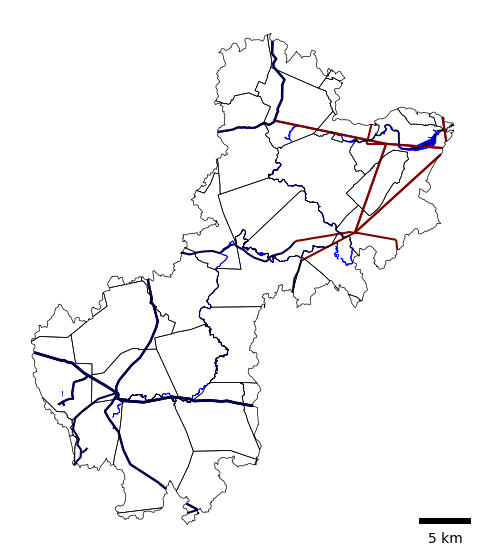

In [232]:
TL=gpd.read_file('../../Raw_Data/Transmission Lines/Electric_Power_Transmission_Lines_A.shp',driver='pyogrio').to_crs(epsg=26986).clip(CRW)
fig,ax=plt.subplots(figsize=(6,8))
TL.plot(ax=ax,column='TYPE',legend=False,cmap='seismic',legend_kwds={'loc':'upper left'})
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='blue',edgecolor='blue',linewidth=0.5)
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
fig.savefig('Output Maps/Transmission Lines.png',dpi=300,bbox_inches='tight',transparent=True)

# Gas Pipelines

In [ ]:
gas=gpd.read_file('../../Raw_Data/Gas Lines/NaturalGas_InterIntrastate_Pipelines_US_EIA.shp',driver='pyogrio').to_crs(epsg=26986).clip(CRW)
fig,ax=plt.subplots(figsize=(6,8))
gas.plot(ax=ax,color='red')
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='blue',edgecolor='blue',linewidth=0.5)
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
fig.savefig('Output Maps/Gas Lines.png',dpi=300,bbox_inches='tight',transparent=True)

# Tree Ordinances

In [317]:
Ords=Charles_Towns.sort_values(by='name')
Ords=Ords.merge(pd.read_csv('../../Raw_Data/Tree Ordinances.csv'),left_on='name',right_on='Municipality')

<IPython.core.display.HTML object>

In [85]:
Ord_palette = {'No':'#74c476','Yes':'#e5e5e5'}
Ord_cmap = mpl.colors.ListedColormap([Ord_palette[b] for b in ['Yes','No']])
Pol_palette = {'Both':'#00441b','Natural Resources Commission':'#a1d99b','Warden':'#41ab5d','Warden+':'#006d2c'}
Pol_cmap = mpl.colors.ListedColormap([Pol_palette[b] for b in ['Both','Natural Resources Commission','Warden','Warden+']])

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

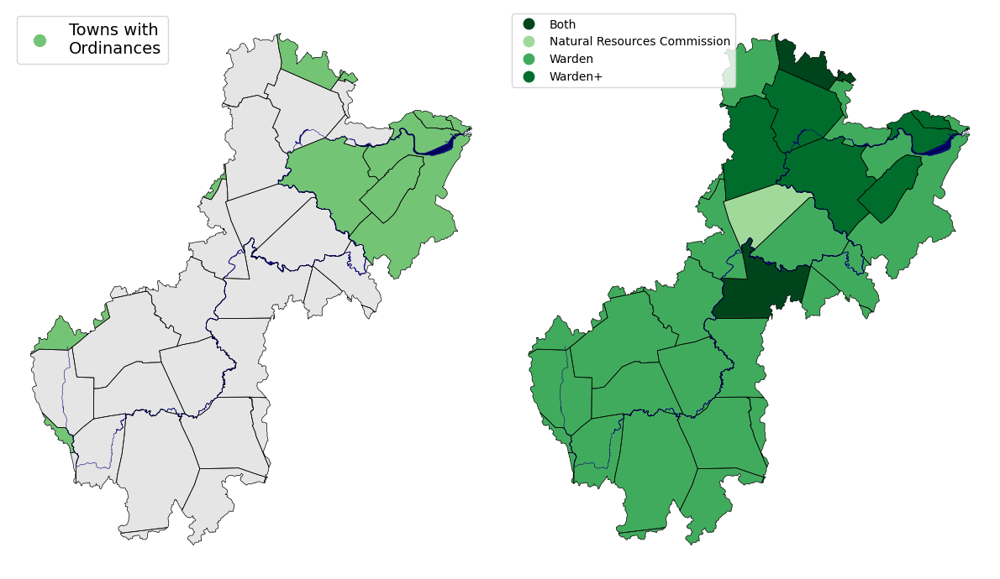

In [174]:
fig,ax=plt.subplots(1,2,figsize=(12,8),layout='tight')
Ords.plot(ax=ax[0],column='Tree Ordinance',cmap=Ord_cmap,legend=False)

l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#74c476', marker='o',markersize=12, label='Towns with\nOrdinances')
ax[0].legend(handles=[l1],fontsize=14,loc='upper left')

towns.to_crs(epsg=26986).boundary.plot(ax=ax[0], color='black',linewidth=0.5)
Charles.plot(ax=ax[0],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[0],color='#060270',linewidth=0.4)
ax[0].axis('off')
Ords.plot(ax=ax[1],column='Tree Committee/Tree Warden',cmap=Pol_cmap,legend=True,legend_kwds={'loc':'upper left'})
towns.to_crs(epsg=26986).boundary.plot(ax=ax[1], color='black',linewidth=0.5)
Charles.plot(ax=ax[1],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[1],color='#060270',linewidth=0.4)
ax[1].axis('off')
fig.savefig('Output Maps/Ordinances and Policies',dpi=300,transparent=True,bbox_inches='tight')

# TNC Conservation Priority Data

In [589]:
HP_cons_opps=gpd.read_file('../../Raw_Data/TNC_Cons/High Level Conservation Opp/High Priority Conservation Opportunities/High Priority Conservation Opportunities.shp').to_crs(epsg=26986)

<IPython.core.display.HTML object>

In [590]:
HP_cons_opps=HP_cons_opps[HP_cons_opps.Priority=='High Priority']

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

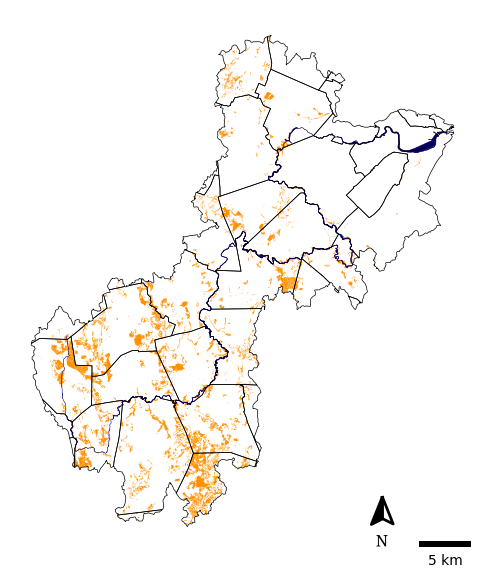

In [591]:
fig,ax=plt.subplots(figsize=(6,8))
HP_cons_opps.plot(ax=ax,color='#ff9101')
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
fig.savefig('Output Maps/High Priority Conservation Areas.png',dpi=300,transparent=True,bbox_inches='tight')

In [592]:
Private=Parcels_dissolved[Parcels_dissolved.Public=='R']
Public=Parcels_dissolved[Parcels_dissolved.Public=='U']
Unknown=Parcels_dissolved[Parcels_dissolved.Public=='X']

<IPython.core.display.HTML object>

In [593]:
pub_cons_opp=HP_cons_opps.overlay(Public,how='intersection').dissolve()
pri_cons_opp=HP_cons_opps.overlay(Private,how='intersection').dissolve()
unk_cons_opp=HP_cons_opps.overlay(Unknown,how='intersection').dissolve()

<IPython.core.display.HTML object>

In [594]:
TCC2021_mask,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),HP_cons_opps.to_crs(epsg=26986).geometry,crop=True,filled=False)
TCC2021_pub,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),pub_cons_opp.to_crs(epsg=26986).geometry,crop=True,filled=False)
TCC2021_pri,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),pri_cons_opp.to_crs(epsg=26986).geometry,crop=True,filled=False)
TCC2021_unk,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),unk_cons_opp.to_crs(epsg=26986).geometry,crop=True,filled=False)
plot_extent=rio.plot.plotting_extent(rio.open('../../Working_Data/TCC2021.tif'))

<IPython.core.display.HTML object>

In [ ]:
f, ax = plt.subplots(figsize=(6,8))

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TCC2021_pub[0,:,:],cmap='Greens',extent=plot_extent,alpha=1,vmin=0,vmax=100)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

# Add data and layers
show(TCC2021_pub,cmap='Greens',ax=ax,extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.clip(CRW).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.axis('off')
#plt.title('2021 Canopy Coverage')
#plt.text(-7.965e6,5.16e6,'Source: USFS Tree Canopy Coverage from Google Earth Engine',fontsize=8)


# Add colorbar using hidden version of raster
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax.add_artist(ScaleBar(1,location='lower right'))
f.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05)
f.savefig('Output Maps/2021 TCC conservation prio zones PUBLIC for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
f, ax = plt.subplots(figsize=(6,8))

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TCC2021_pri[0,:,:],cmap='Greens',extent=plot_extent,alpha=1,vmin=0,vmax=100)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

# Add data and layers
show(TCC2021_pri,cmap='Greens',ax=ax,extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.clip(CRW).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.axis('off')
#plt.title('2021 Canopy Coverage')
#plt.text(-7.965e6,5.16e6,'Source: USFS Tree Canopy Coverage from Google Earth Engine',fontsize=8)


# Add colorbar using hidden version of raster
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax.add_artist(ScaleBar(1,location='lower right'))
f.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05)
f.savefig('Output Maps/2021 TCC conservation prio zones PRIVATE for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [ ]:
f, ax = plt.subplots(figsize=(6,8))

# Create hidden version of raster to be used for color bar
hidden = ax.imshow(TCC2021_unk[0,:,:],cmap='Greens',extent=plot_extent,alpha=1,vmin=0,vmax=100)
#cx.add_basemap(ax,source=cx.providers.CartoDB.Positron,crs='epsg:26986')

# Add data and layers
show(TCC2021_unk,cmap='Greens',ax=ax,extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.clip(CRW).plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.axis('off')
#plt.title('2021 Canopy Coverage')
#plt.text(-7.965e6,5.16e6,'Source: USFS Tree Canopy Coverage from Google Earth Engine',fontsize=8)


# Add colorbar using hidden version of raster
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax.add_artist(ScaleBar(1,location='lower right'))
f.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05)
f.savefig('Output Maps/2021 TCC conservation prio zones UNKNOWN for publication.png',transparent=True,dpi=300,bbox_inches='tight')

<IPython.core.display.HTML object>

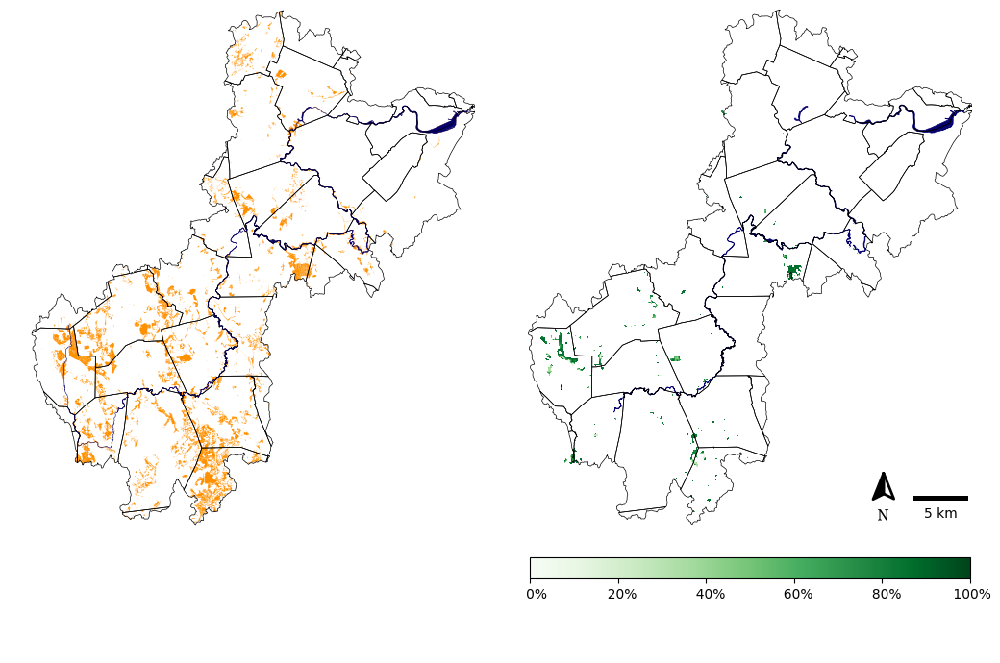

In [597]:
f, ax = plt.subplots(1,2,figsize=(12,7),layout='tight')

HP_cons_opps.plot(ax=ax[0],color='#ff9101')
towns.boundary.plot(ax=ax[0],color='black',linewidth=0.5)
Charles.plot(ax=ax[0],color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax[0],color='#060270',linewidth=0.4)
ax[0].axis('off')
ax[0].set_ylim([852000,911600])

hidden = ax[1].imshow(TCC2021_mask[0,:,:],cmap='Greens',extent=plot_extent,alpha=1,vmin=0,vmax=100)
show(TCC2021_mask,cmap='Greens',ax=ax[1],extent=plot_extent,alpha=1,vmin=0,vmax=100)
towns.to_crs(epsg=26986).boundary.plot(ax=ax[1], color='black',linewidth=0.5)
Charles.clip(CRW).plot(ax=ax[1],color='#060270',edgecolor='#060270',linewidth=0.5)
ax[1].axis('off')
add_north_arrow(ax=ax[1],scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax[1].add_artist(ScaleBar(1,location='lower right'))
f.colorbar(hidden,format='%4i%%',orientation='horizontal',shrink=0.7,aspect=20,pad=0.05)
f.savefig('Output Maps/2021 TCC conservation prio zones for publication.png',transparent=True,dpi=300,bbox_inches='tight')

In [93]:
HP_cons_opps=HP_cons_opps.dissolve()[['geometry']]
HPCons_stats=pd.DataFrame(rasterstats.zonal_stats(HP_cons_opps, "../../Working_Data/TCC"+'2021'+".tif",stats="count min mean max median"),index=HP_cons_opps.index)
HPCons_stats['mean']/100*(HP_cons_opps.geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


0    12231.193518
dtype: float64

In [94]:
HPCons_stats['mean']

<IPython.core.display.HTML object>


0    67.023526
Name: mean, dtype: float64

In [95]:
HP_cons_opps.geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


0    18249.104962
dtype: float64

In [103]:
unk_cons_opp=unk_cons_opp[['geometry']]
HPCons_stats=pd.DataFrame(rasterstats.zonal_stats(unk_cons_opp, "../../Working_Data/TCC"+'2021'+".tif",stats="count min mean max median"),index=unk_cons_opp.index)
HPCons_stats['mean']/100*(unk_cons_opp.geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


0    154.074721
dtype: float64

In [104]:
HPCons_stats['mean']

<IPython.core.display.HTML object>


0    59.703672
Name: mean, dtype: float64

In [105]:
unk_cons_opp.geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


0    258.065737
dtype: float64

In [112]:
258/(3394+12651+258)*100

<IPython.core.display.HTML object>

1.5825308225479975

# Land Cover Maps

In [ ]:
# Unzip CRWA files
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Send_CR_LandCover_2021.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Send_CR_LandCover_2021/")
zipfile.ZipFile(r"C:\Users\Chad\Desktop\CRWA Project\Raw_Data\Send_CR_LULC_2021.zip").extractall(path="C:/Users/Chad/Desktop/CRWA Project/Raw_Data/Send_CR_LULC_2021/")

In [ ]:
LC2021=rio.open('../../Raw_Data/Send_CR_LandCover_2021/Send_CR_LandCover_2021/landcover_2021_charlesriver_v4a.tif').read(1)
LULC2021=rio.open('../../Raw_Data/Send_CR_LULC_2021/Send_CR_LULC_2021/landuselandcover_2021_charlesriver_v8a.tif').read(1)

In [ ]:
# Get MASSGIS data and compare to these

In [ ]:
#Forest Areas
NLCD2019lc=ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2019').clip(Charles).select('landcover')

In [ ]:
#Impervious Cover
NLCD2019=ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2019').clip(Charles).select('impervious')
map_2 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
image_viz_params = {
    'bands': ['impervious'],
    'min': 0,
    'max': 100,
    'palette': 'plasma'
}
map_2.add_layer(NLCD2019, image_viz_params)
map_2

#NLCD data from previous years to see changes

# Natural Valley Storage Area

In [85]:
NVSA=gpd.read_file('../../Raw_Data/NVSA/NVSA.shp',driver='pyogrio').to_crs(epsg=26986)

<IPython.core.display.HTML object>

In [346]:
NVSA_stats=pd.DataFrame(rasterstats.zonal_stats(NVSA.dissolve(), "../../Working_Data/TCC2021.tif",stats="mean"))

<IPython.core.display.HTML object>

In [348]:
NVSA_stats['mean']/100*NVSA.dissolve().geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


0    2375.461065
dtype: float64

<IPython.core.display.HTML object>

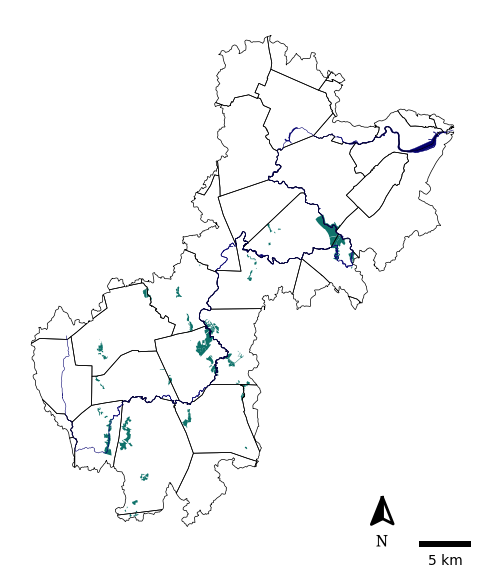

In [87]:
fig,ax=plt.subplots(figsize=(6,8))
NVSA.to_crs(epsg=26986).plot(ax=ax,color='#0e726a',legend=False)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.25)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=0.4)
ax.add_artist(ScaleBar(1,location='lower right'))
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax.axis('off')
fig.savefig('Output Maps/NVSA.png',dpi=300,transparent=True,bbox_inches='tight')

# Invasive Species

In [6]:
# Get observation function from pyinaturalist documentation (place_id = 2 for Massachusetts)
def get_obs(years,taxon_id):
    print('querying API...')
    response=pyinaturalist.v1.observations.get_observations(year=years,taxon_id=taxon_id,geo=True,page='all',place_id=2)
    my_observations = pyinaturalist.Observation.from_json_list(response)
    print('building df...')
    df = pd.DataFrame([{
              'latitude': o.location[0],
              'longitude': o.location[1],
              'date': o.observed_on.isoformat()
          }
          for o in my_observations
          if o.location]
    )
    print('saving file...')
    gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326").clip(CRW.to_crs(epsg=4326)).to_crs(epsg=26986).to_file('../../Working_Data/iNat data'+str(taxon_id)+'.geojson')

<IPython.core.display.HTML object>

In [11]:
#Extract geodataframes of species of interest
session = pyinaturalist.ClientSession(timeout=60)

years=[2020,2021,2022,2023,2024]
knotweed=914922
bittersweet=64540
buckthorn=55972
euonymus=117433
multiflora=78882
corktree=166636
porcelain=204237
kudzu=62671
barberry=58727


get_obs(years,knotweed)
get_obs(years,bittersweet)
get_obs(years,buckthorn)
get_obs(years,euonymus)
get_obs(years,multiflora)
get_obs(years,corktree)
get_obs(years,porcelain)
get_obs(years,kudzu)
get_obs(years,barberry)

<IPython.core.display.HTML object>

querying API...
building df...
saving file...
querying API...


This request is larger than recommended for API usage. For bulk requests, consider using the iNat export tool instead: https://www.inaturalist.org/observations/export


building df...
saving file...
querying API...
building df...
saving file...
querying API...
building df...
saving file...
querying API...


This request is larger than recommended for API usage. For bulk requests, consider using the iNat export tool instead: https://www.inaturalist.org/observations/export


building df...
saving file...
querying API...
building df...
saving file...
querying API...
building df...
saving file...
querying API...
building df...
saving file...
querying API...
building df...
saving file...


<IPython.core.display.HTML object>

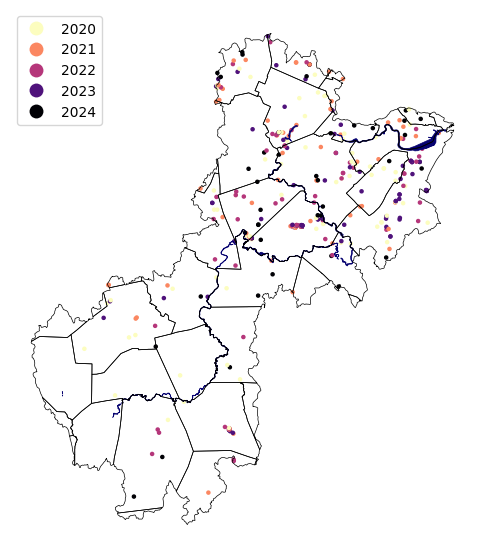

In [83]:
id=58727
barb=gpd.read_file('../../Working_Data/iNat Data'+str(id)+'.geojson',driver='pyogrio')
barb['Year']=barb.date.dt.year.astype('string')
fig,ax=plt.subplots(figsize=(6,8))
barb.plot(ax=ax,column='Year',legend=True,cmap='magma_r',markersize=5)
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.axis('off')
fig.savefig('Output Maps/Barberry.png',dpi=300,transparent=True,bbox_inches='tight')

<IPython.core.display.HTML object>

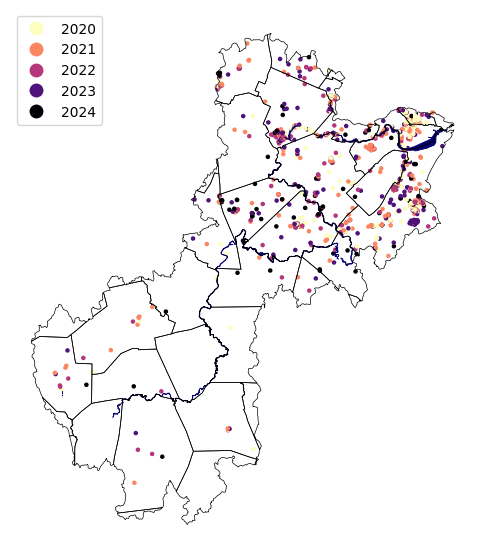

In [72]:
id=914922
knot=gpd.read_file('../../Working_Data/iNat Data'+str(id)+'.geojson',driver='pyogrio')
knot['Year']=knot.date.dt.year.astype('string')
fig,ax=plt.subplots(figsize=(6,8))
knot.plot(ax=ax,column='Year',legend=True,cmap='magma_r',markersize=5)
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.axis('off')
fig.savefig('Output Maps/Knotweed.png',dpi=300,transparent=True,bbox_inches='tight')

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Local\Temp\ipykernel_22860\712610474.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  rose['Year'][i]=rose.date[i][:4]
C:\Users\Chad\AppData\Local\Temp\ipykernel_22860\712610474.py:5: SettingWithCopyWarning: 
A value

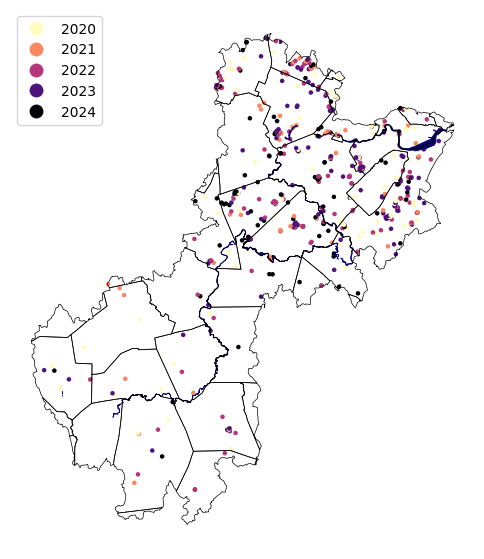

In [82]:
id=78882
rose=gpd.read_file('../../Working_Data/iNat Data'+str(id)+'.geojson',driver='pyogrio')
rose['Year']=''
for i in rose.index:
    rose['Year'][i]=rose.date[i][:4]
fig,ax=plt.subplots(figsize=(6,8))
rose.plot(ax=ax,column='Year',legend=True,cmap='magma_r',markersize=5)
towns.boundary.plot(ax=ax,color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
ax.axis('off')
fig.savefig('Output Maps/Multiflora Rose.png',dpi=300,transparent=True,bbox_inches='tight')

# Climate-driven threats to trees

In [135]:
July=ee.ImageCollection(ee.ImageCollection("NASA/NEX-DCP30_ENSEMBLE_STATS")).filterDate('2020-07-01','2020-7-30').filter("scenario=='rcp85'").first()

<IPython.core.display.HTML object>

In [136]:
July

<IPython.core.display.HTML object>

<ee.image.Image object at 0x00000142A81C9350>

In [137]:
geemap.ee_export_image(July,filename='../../Working_Data/July2099.tif', region=geemap.geopandas_to_ee(CRW.to_crs(epsg=4326)).geometry(), file_per_band=True)

<IPython.core.display.HTML object>

Generating URL ...
Please wait ...
Data downloaded to C:\Users\Chad\Desktop\CRWA Project\Working_Data


In [139]:
rio.open('../../Working_Data/July2099.pr_mean.tif').crs

<IPython.core.display.HTML object>

CRS.from_epsg(4326)

<IPython.core.display.HTML object>

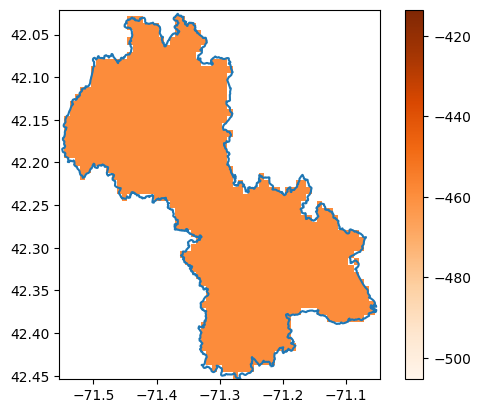

In [140]:
fig,ax=plt.subplots()
July,trans=mask(rio.open('../../Working_Data/July2099.pr_mean.tif'),CRW.to_crs(epsg=4326).geometry,filled=False,crop=True)
July=(July-273)*9/5+32
plot_extent=rio.plot.plotting_extent(rio.open('../../Working_Data/July2099.pr_mean.tif'))
show(July,ax=ax,extent=plot_extent,cmap='Oranges')
hidden=ax.imshow(July[0,:,:],extent=plot_extent,cmap='Oranges')
fig.colorbar(hidden,ax=ax)
CRW.to_crs(epsg=4326).boundary.plot(ax=ax)
fig.savefig('Output Maps/NASA NEX.png',dpi=300,transparent=True,bbox_inches='tight')

# Dams and Tributaries

In [181]:
Dams=gpd.read_file('../../Raw_Data/Dams/DAMS_PT.shp',driver='pyogrio').clip(CRW)
Dams=Dams[(Dams.REGAUTH!='Non-Jurisdictional - Other') | (Dams.HAZCODE!='N/A')]

<IPython.core.display.HTML object>

In [182]:
Target_Dams=Dams[(Dams.DAMNAME=='Charles River Dam At South Natick')|(Dams.DAMNAME=='Watertown Dam')|(Dams.DAMNAME=='Eagle Dam')]
Removed_Dams=Dams[Dams.DAMNAME=='Old Mill Dam']

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Roaming\Python\Python311\site-packages\geopandas\geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


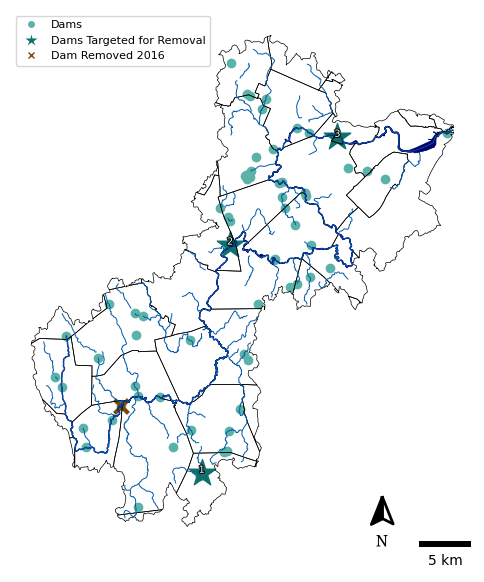

In [183]:
fig,ax=plt.subplots(figsize=(6,8))
Dams.to_crs(epsg=26986).plot(ax=ax,color='#5bb2a8',legend=False)
Target_Dams.to_crs(epsg=26986).plot(ax=ax,color='#0e726a',marker='*',markersize=400,legend=False)
Removed_Dams.to_crs(epsg=26986).plot(ax=ax,color='#7c4809',marker='x',markersize=100,linewidth=3,legend=False)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=1)
Tribs.to_crs(epsg=26986).plot(ax=ax,color='#015AA7',linewidth=0.7)
ax.add_artist(ScaleBar(1,location='lower right'))
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)

Target_Dams['coords'] = Target_Dams['geometry'].apply(lambda x: x.centroid.coords[:])
Target_Dams['coords'] = [coords[0] for coords in Target_Dams['coords']]
j=1
for idx, row in Target_Dams.iterrows():
    ax.annotate(text=str(j), xy=row['coords'],
                horizontalalignment='center',fontsize=7,color='white',
                path_effects=[mpl.patheffects.withStroke(linewidth=1.5, foreground="black")])
    j+=1

l1 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#5bb2a8', marker='o',markeredgecolor=(1,1,1,0),markersize=5, label='Dams')
l2 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#0e726a', marker='*',markeredgecolor=(1,1,1,0),markersize=9, label='Dams Targeted for Removal')
l3 = mpl.lines.Line2D([], [], color=(1,1,1,0),markerfacecolor='#7c4809', marker='x',markeredgecolor='#7c4809',markersize=5, label='Dam Removed 2016')
ax.legend(handles=[l1,l2,l3],loc='upper left',fontsize=8)

ax.axis('off')
fig.savefig('Output Maps/Dams.png',dpi=300,transparent=True,bbox_inches='tight')

# Intermittent Streams

In [251]:
rivers_arc.MINOR_TOT.unique()

<IPython.core.display.HTML object>


array(['204', '200', '610412', '412', '202', '201', '415', '412610',
       '610414', '406', '999M', '414', '200009', '415604', '109', '409',
       '407'], dtype=object)

<IPython.core.display.HTML object>

<Axes: >

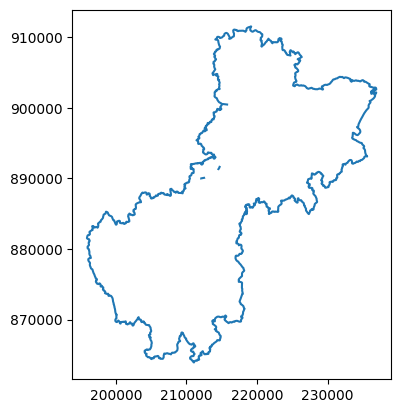

In [256]:
ax=rivers_arc[rivers_arc.MINOR_TOT=='415604'].plot()
CRW.boundary.plot(ax=ax)

In [185]:
iStreams=rivers_arc[rivers_arc.ARC_CODE==5]

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

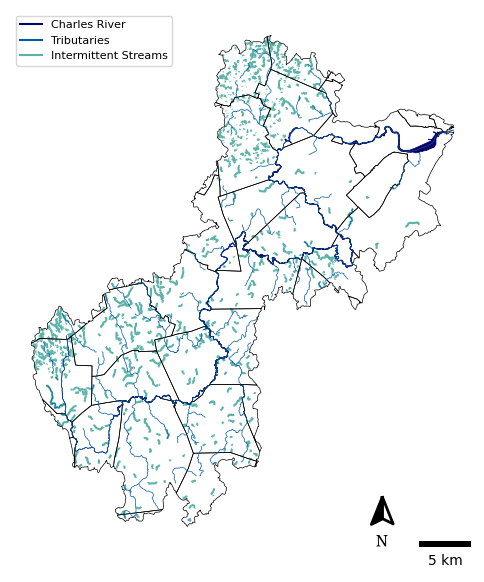

In [187]:
fig,ax=plt.subplots(figsize=(6,8))
iStreams.plot(ax=ax,color='#5bb2a8')
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=.5)
Tribs.to_crs(epsg=26986).plot(ax=ax,color='#015AA7',linewidth=0.5)
ax.add_artist(ScaleBar(1,location='lower right'))
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
ax.axis('off')

l1 = mpl.lines.Line2D([], [], color='#060270', label='Charles River')
l2 = mpl.lines.Line2D([], [], color='#015AA7', label='Tributaries')
l3 = mpl.lines.Line2D([], [], color='#5bb2a8', label='Intermittent Streams')
ax.legend(handles=[l1,l2,l3],loc='upper left',fontsize=8)

fig.savefig('Output Maps/Intermittent Streams.png',dpi=300,transparent=True,bbox_inches='tight')

# Indigenous Lands

In [ ]:
Indig=gpd.read_file('../../Raw_Data/Indigenous.geojson.txt')

In [ ]:
#https://native-land.ca/resources/api-docs/#Maps
fig,ax=plt.subplots(figsize=(8,8))
CRW.to_crs(epsg=26986).boundary.plot(ax=ax,color='black',linewidth=0.5)
Indig.to_crs(epsg=26986).boundary.plot(ax=ax,color='black',linewidth=0.5)
Indig.to_crs(epsg=26986).clip(CRW).plot(ax=ax,column='Name',alpha=0.4,legend=True,cmap='BrBG',legend_kwds={'loc':'upper left','fontsize':7})
ax.set_ylim([860000,917000])
ax.set_xlim([190000,245000])
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=1)
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.75,text_scaler=3, text_yT=-3)
fig.savefig('Output Maps/Native.png',dpi=300,transparent=True,bbox_inches='tight')

# Overall Protection Map

In [318]:
# Tree Canopy under ordinances
Pub_Ords=Ords[(Ords['Tree Ordinance']=='Yes')&(Ords['Private']!='Y')]
Pub_Protect=Parcels_wPublic[Parcels_wPublic.Public=='U'].clip(Pub_Ords).dissolve()
Pub_TCC,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),Pub_Protect.to_crs(epsg=26986).geometry,crop=True,filled=False)

Pri_Ords=Ords[(Ords['Tree Ordinance']=='Yes')&(Ords['Private']=='Y')]
Pri_Protect=Parcels_wPublic.clip(Pri_Ords).dissolve()
Pri_TCC,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),Pri_Protect.to_crs(epsg=26986).geometry,crop=True,filled=False)

<IPython.core.display.HTML object>

In [319]:
Pri_extent=[Pri_Protect.dissolve().geometry.bounds['minx'][0],Pri_Protect.dissolve().geometry.bounds['maxx'][0],Pri_Protect.dissolve().geometry.bounds['miny'][0],Pri_Protect.dissolve().geometry.bounds['maxy'][0]]
Pub_extent=[Pub_Protect.dissolve().geometry.bounds['minx'][0],Pub_Protect.dissolve().geometry.bounds['maxx'][0],Pub_Protect.dissolve().geometry.bounds['miny'][0],Pub_Protect.dissolve().geometry.bounds['maxy'][0]]

<IPython.core.display.HTML object>

In [320]:
# Tree canopy on protected open space
P_OS=OS[OS['LEV_PROT']=='P']
POS_TCC,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),P_OS.to_crs(epsg=26986).geometry,crop=True,filled=False)
OS_extent=[P_OS.dissolve().geometry.bounds['minx'][0],P_OS.dissolve().geometry.bounds['maxx'][0],P_OS.dissolve().geometry.bounds['miny'][0],P_OS.dissolve().geometry.bounds['maxy'][0]]

<IPython.core.display.HTML object>

In [321]:
# Tree Canopy on NVSA land
NVSA_TCC,trans=mask(rio.open('../../Working_Data/TCC2021.tif'),NVSA[NVSA.geometry!=None].to_crs(epsg=26986).geometry,crop=True,filled=False)
NVSA_extent=[NVSA.dissolve().geometry.bounds['minx'][0],NVSA.dissolve().geometry.bounds['maxx'][0],NVSA.dissolve().geometry.bounds['miny'][0],NVSA.dissolve().geometry.bounds['maxy'][0]]

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

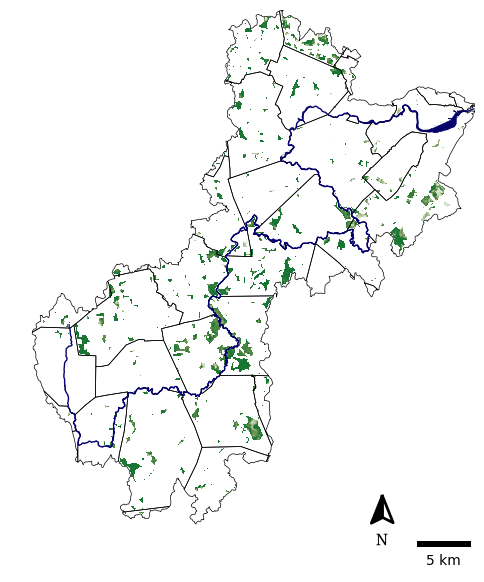

In [328]:
fig,ax=plt.subplots(figsize=(6,8))
show(Pri_TCC,ax=ax,cmap=my_greens,extent=Pri_extent)
show(Pub_TCC,ax=ax,cmap=my_greens,extent=Pub_extent)
show(NVSA_TCC,ax=ax,cmap=my_greens,extent=NVSA_extent)
show(POS_TCC,ax=ax,cmap=my_greens,extent=OS_extent)
towns.to_crs(epsg=26986).boundary.plot(ax=ax, color='black',linewidth=0.5)
Charles.plot(ax=ax,color='#060270',edgecolor='#060270',linewidth=0.5)
CHARLES.to_crs(epsg=26986).plot(ax=ax,color='#060270',linewidth=1)
ax.axis('off')
ax.add_artist(ScaleBar(1,location='lower right'))
add_north_arrow(ax=ax,scale=0.5,ylim_pos=0.05,xlim_pos=0.80,text_scaler=3, text_yT=-3)
fig.savefig('Output Maps/Protected Trees.png',dpi=300,transparent=True,bbox_inches='tight')

In [323]:
Protect_All=Pub_Protect[['geometry']].overlay(Pri_Protect[['geometry']],how='union').overlay(NVSA[NVSA.geometry!=None][['geometry']].dissolve(),how='union').overlay(P_OS[['geometry']].dissolve(),how='union').dissolve()

<IPython.core.display.HTML object>

C:\Users\Chad\AppData\Roaming\Python\Python311\site-packages\geopandas\geodataframe.py:2467: UserWarning: `keep_geom_type=True` in overlay resulted in 1 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(
C:\Users\Chad\AppData\Roaming\Python\Python311\site-packages\geopandas\geodataframe.py:2467: UserWarning: `keep_geom_type=True` in overlay resulted in 939 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(


In [324]:
P_stats=pd.DataFrame(rasterstats.zonal_stats(Protect_All, "../../Working_Data/TCC2021.tif",stats="mean"))
P_stats['mean']/100*Protect_All.geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


0    28473.496892
dtype: float64

In [325]:
CRW_stats=pd.DataFrame(rasterstats.zonal_stats(CRW.dissolve(), "../../Working_Data/TCC2021.tif",stats="mean"))
CRW_stats['mean']/100*CRW.dissolve().geometry.area*2.47105381/10000

<IPython.core.display.HTML object>


0    106815.581787
dtype: float64

In [326]:
(P_stats['mean']/100*Protect_All.geometry.area*2.47105381/10000)/(CRW_stats['mean']/100*CRW.dissolve().geometry.area*2.47105381/10000)

<IPython.core.display.HTML object>


0    0.266567
dtype: float64

# FEMA flood zones

In [ ]:
# https://www.mass.gov/info-details/massgis-data-fema-national-flood-hazard-layer

# AF TES

In [ ]:
# https://www.treeequityscore.org/map#8.58/42.24/-71.4325

# Invasive Species Data Collection

In [ ]:
#Extract Sentinel 2 bands and indices of interest
def extractBandsIndices(image):
    return image.select(['B2','B3','B4','B5_10m','B6_10m','B7_10m','B8','B8A_10m','B11_10m','B12_10m',
                         'NDVI','NBR','SAVI','RENDVI','EVI'])

In [ ]:
#Resample Sentinel 2 bands to 10 m
def resample10m(image):
    proj_10m=image.select('B4').projection()
    B5_res=image.select('B5').resample('bicubic').reproject(proj_10m).rename('B5_10m')
    B6_res=image.select('B6').resample('bicubic').reproject(proj_10m).rename('B6_10m')
    B7_res=image.select('B7').resample('bicubic').reproject(proj_10m).rename('B7_10m')
    B8A_res=image.select('B8A').resample('bicubic').reproject(proj_10m).rename('B8A_10m')
    B11_res=image.select('B11').resample('bicubic').reproject(proj_10m).rename('B11_10m')
    B12_res=image.select('B12').resample('bicubic').reproject(proj_10m).rename('B12_10m')
    return image.addBands([B5_res,B6_res,B7_res,B8A_res,B11_res,B12_res])

In [ ]:
#Add 5 vegetation indices of interest
def addIndices(image):
    NDVI = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    NBR = image.normalizedDifference(['B12_10m','B8']).rename('NBR')
    SAVI = image.expression(
        '1.5 * ((NIR - RED)) / (NIR + RED + 0.5)', {
            'NIR' : image.select('B8'),
            'RED' : image.select('B4'),
        }).rename('SAVI')
    RENDVI = image.normalizedDifference(['B6_10m','B5_10m']).rename('RENDVI')
    EVI = image.expression(
        '2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))', {
            'NIR' : image.select('B8'),
            'RED' : image.select('B4'),
            'BLUE': image.select('B2')}).rename('EVI')
    return image.addBands([NDVI,NBR,SAVI,RENDVI,EVI])

In [ ]:
#Cloud mask function
def mask_s2_clouds(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = (
        qa.bitwiseAnd(cloud_bit_mask)
        .eq(0)
        .And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    )
    return image.updateMask(mask).divide(10000)

In [ ]:
#Land cover mask function
def mask_forests(image):
    mask=(NLCD2019lc.eq(41).Or(NLCD2019lc.eq(42).Or(NLCD2019lc.eq(43))))
    return image.updateMask(mask)

In [ ]:
#Pre-processing sentinel-2 data
S2_All=ee.ImageCollection(("COPERNICUS/S2_SR_HARMONIZED")).map(mask_s2_clouds).filterBounds(Charles.geometry()).map(Charclip).map(resample10m).map(addIndices).map(extractBandsIndices)

In [ ]:
S2_All.size()

In [ ]:
S2_All_list=S2_All.toList(S2_All.size())

In [ ]:
#Map of first image in collection
map_3 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
map_3.add_layer(ee.Image(S2_All_list.get(1)).visualize(bands=['B4','B3','B2'],max=0.2))
map_3

In [ ]:
NDVI=S2_All.select('NDVI')

In [ ]:
NDVI_list=NDVI.toList(NDVI.size())

In [ ]:
map_4 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
map_4.add_layer(ee.Image(NDVI_list.get(1)))
map_4

# Scratch workspace

In [ ]:
#Forest Areas
NLCD2019lc=ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2019').clip(Charles).select('landcover')
map_1 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
map_1.add_layer(NLCD2019lc.updateMask(NLCD2019lc.eq(41)),name='Deciduous Forest',color='light green')
map_1.add_layer(NLCD2019lc.updateMask(NLCD2019lc.eq(42)),name='Evergreen Forest',color='dark green')
map_1.add_layer(NLCD2019lc.updateMask(NLCD2019lc.eq(43)),name='Mixed Forest',color='green')
map_1

#NLCD change maps for forest types, check out different times
#Add boundary to map

In [ ]:
# Create HTML map of each year for the forest cover data
for i in range(2000,2021):
    year=i
    image=ee.ImageCollection('MODIS/006/MOD44B').filterDate(str(i)+'-01-01',str(i+1)+'-01-01').map(Charclip)
    image_viz_params = {
        'bands': ['Percent_Tree_Cover'],
        'min': 0,
        'max': 100,
        'palette': 'Greens'
    }
    map_1 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
    map_1.add_layer(image, image_viz_params)
    legend_keys=['0%','25%','50%','75%','100%']
    map_1.add_legend('Percent_Tree_Cover',legend_keys,["#f7fcf5","#c7e9c0","#74c476","#238b45","#00441b"])
    map_1
    map_1.save('TreeCoverMaps\Tree Cover '+str(i)+'.html')



In [ ]:
#Extracting Charles River Watershed Boundary
CRW_ = gpd.read_file("..\Raw_Data\watshd\watshdp1.shp")
CRW = CRW_[CRW_.NAME=="CHARLES"]
CRW.plot()

In [ ]:
#List of invasive species of interest
# Japanese knotweed, Asian bittersweet, glossy buckthorn, euonymous, multiflora rose, cork tree, kudzu, porcelain berry
# https://www.massaudubon.org/nature-wildlife/invasive-plants-in-massachusetts
def get_obs(years,taxon_id):
  response=pyinaturalist.v1.observations.get_observations(year=years,taxon_id=taxon_id,geo=True,page='all',place_id=2)
  my_observations = pyinaturalist.Observation.from_json_list(response)
  df = pd.DataFrame(
      [
          {
              'latitude': o.location[0],
              'longitude': o.location[1],
              'date': o.observed_on.isoformat()
          }
          for o in my_observations
          if o.location
      ]
  )
  gdf = gpd.GeoDataFrame(
      df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
  )
  return gdf

In [ ]:
# https://nbviewer.org/gist/perrygeo/c426355e40037c452434
def density_heatmap(d, bins=(100,100), smoothing=1.3, cmap='jet'):
    def getx(pt):
        return pt.coords[0][0]

    def gety(pt):
        return pt.coords[0][1]

    x = list(d.geometry.apply(getx))
    y = list(d.geometry.apply(gety))
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]

    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.gaussian_filter(logheatmap, smoothing, mode='nearest')

    plt.imshow(logheatmap, cmap=cmap, extent=extent)
    plt.colorbar()
    plt.gca().invert_yaxis()
    plt.show()

In [ ]:

years=[2020,2021,2022,2023,2024]
knotweed=914922
bittersweet=64540
buckthorn=55972
euonymus=117433
multiflora=78882
corktree=166636
porcelain=204237
kudzu=62671
barberry=58727

knot_gdf=get_obs(years,knotweed)
bitt_gdf=get_obs(years,bittersweet)
buck_gdf=get_obs(years,buckthorn)
euon_gdf=get_obs(years,euonymus)
mult_gdf=get_obs(years,multiflora)
cork_gdf=get_obs(years,corktree)
porc_gdf=get_obs(years,porcelain)
kudz_gdf=get_obs(years,kudzu)
barb_gdf=get_obs(years,barberry)

In [ ]:
d={
  'Knotweed':knot_gdf,
  'Bittersweet':bitt_gdf,
  'Buckthorn':buck_gdf,
  'Euonymus':euon_gdf,
  'Multiflora':mult_gdf,
  'Corktree':cork_gdf,
  'Porcelain Berry':porc_gdf,
  'Kudzu':kudz_gdf,
  'Barberry':barb_gdf
}
for name, value in d.items():
  ax = Charles_lower_gdf.to_crs(epsg=3857).boundary.plot(figsize=(10,10), color='blue',linewidth=0.5)
  Charles_upper_gdf.to_crs(epsg=3857).boundary.plot(ax=ax,figsize=(10,10), color='green',linewidth=0.5)
  value.clip(Charles_gdf).to_crs(epsg=3857).plot(ax=ax)
  plt.title(name+" (2020 - 2024)")
  cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)
  ax.set_axis_off()
  ax.add_artist(ScaleBar(1,location='lower right'))
  plt.savefig(name+'.png')

In [ ]:
#Create function to clip image to be used for clipping image collections
def Charclip(image):
    return image.clip(Charles)

In [ ]:
#Import and clip MODIS VCF data to Charles and animate
treeData=ee.ImageCollection('MODIS/006/MOD44B').filterBounds(Charles.geometry()).select('Percent_Tree_Cover').map(Charclip)
videoArgs = {
  'dimensions': 768,
  'region': Charles.geometry(),
  'framesPerSecond': 1,
  'crs': 'EPSG:3857',
  'min': 0,
  'max': 100,
  'palette': ["#f7fcf5","#c7e9c0","#74c476","#238b45","#00441b"],
  'format':'gif'
}

In [ ]:
#Obtain link to animation
urllib.request.urlretrieve(treeData.getVideoThumbURL(videoArgs),'../../Working_Data/treeCoverNoLabels.gif')
geemap.add_text_to_gif('../../Working_Data/treeCoverNoLabels.gif','treeCover.gif',text_sequence=[2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020],font_color='white')

In [ ]:
#HUC codes from https://apps.nationalmap.gov/viewer/
Charles=ee.FeatureCollection("USGS/WBD/2017/HUC10").filter("huc10 == '0109000107' or huc10 == '0109000106'")
Charles_lower=ee.FeatureCollection("USGS/WBD/2017/HUC10").filter("huc10 == '0109000107'")
Charles_upper=ee.FeatureCollection("USGS/WBD/2017/HUC10").filter("huc10 == '0109000106'")

In [ ]:
#Convert earth engine feature collections to geopandas data frames
Charles_gdf = ee.data.computeFeatures({
    'expression': Charles,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
Charles_gdf.crs = 'EPSG:4326'

Charles_lower_gdf = ee.data.computeFeatures({
    'expression': Charles_lower,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
Charles_lower_gdf.crs = 'EPSG:4326'

Charles_upper_gdf = ee.data.computeFeatures({
    'expression': Charles_upper,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
Charles_upper_gdf.crs = 'EPSG:4326'

In [ ]:
ax = Charles_lower_gdf.to_crs(epsg=3857).boundary.plot(figsize=(10,10), color='blue',linewidth=0.5)
Charles_upper_gdf.to_crs(epsg=3857).boundary.plot(ax=ax,figsize=(10,10), color='green',linewidth=0.5)
plt.title("Map of the Charles River Watershed")
cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)
ax.set_axis_off()
ax.add_artist(ScaleBar(1,location='lower right'))
plt.savefig("Charles River Watershed Overview Map.png")

In [ ]:
# Projected climate impacts
# USDA hardiness zones maps
# Rainfall, drought prediction
# Temperature projections

In [ ]:
#Priority planting recommendations as areas with low canopy that already have permeable areas

In [ ]:
# American Forests tree equity score analyzer
# Message Mushtaaq about why there are gaps in the data

In [ ]:
# South Natick Dam
# Watertown Dam (probably not happening soon)
# https://maps.coastalresilience.org/massachusetts/

In [ ]:
# Calculate and extract raster of tree cover change from 2005 to 2020 from GEE
treeCover2005=ee.Image('MODIS/006/MOD44B/2005_03_06').clip(geemap.geopandas_to_ee(CRW)).select('Percent_Tree_Cover').reproject(crs='EPSG:3857',scale=250)
treeCover2020=ee.Image('MODIS/006/MOD44B/2020_03_05').clip(geemap.geopandas_to_ee(CRW)).select('Percent_Tree_Cover').reproject(crs='EPSG:3857',scale=250)
dtreeCover=treeCover2020.subtract(treeCover2005)
dtreeCover=geemap.ee_export_image(dtreeCover, filename='../../Working_Data/dtreeCover.tif', region=geemap.geopandas_to_ee(CRW).geometry(), file_per_band=False)

In [ ]:
# Mask tree cover change to watershed and obtain its plotting extent to use later for lining up vector data
dtreeCover,trans=mask(rio.open('../../Working_Data/dtreeCover.tif'),CRW.to_crs(epsg=3857).geometry,crop=True)
plot_extent = rio.plot.plotting_extent(rio.open('../../Working_Data/dtreeCover.tif'))